# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [12, 48]
dtc_w1 = 1000
dtc_w2 = 100

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            )
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 400

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)), 
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.1,
    include_auxillary_loss = True,
    encode_covariates=False
)

train_params = dict(
    max_epochs=1000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: ci9g6pgt
Name: glad-firefly-622
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/ci9g6pgt
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_120801-ci9g6pgt/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1/1000:   0%|          | 0/1000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 223,379,456,179,407,305,544,132,455,357,436,362,248,291,50,216,444,293,287,544,247,270,148,46,324,160,116,286,96,79,193,197,59,329,237,173,265,142,90,200,390,451,325,992,150,366,166,179,278,319,226,145,377,262,261,391,313,632,310,291,230,600,248,143,255,334,284,720,350,353,254,360,358,363,130,219,209,148,57,118,201,499,296,281,334,221,156,239,384,173,134,100,263,395,146,156,443,77,153,291,162,371,95,236,191,235,327,140,140,292,283,106,114,343,345,356,267,43,48,217,231,266,75,191,308,246,191,241,305,198,970,278,191,526,293,138,503,351,503,456,208,462,464,268,379,238,354,234,287,271,268,236,263,390,404,250,241,197,157,631,254,220,137,146,170,158,517,248,388,214,288,407,623,411,300,257,223,228,164,175,210,191,202,238,608,351,331,359,377,7133,423,276,203,172,376,177,264,267,161,326

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 53,102,102,53,88,74,143,43,127,106,97,102,53,67,9,48,118,72,61,119,59,65,40,18,86,24,18,78,30,28,37,48,5,83,49,38,66,38,24,37,78,115,90,227,29,109,49,62,77,79,59,33,93,66,68,87,74,155,72,75,60,131,49,40,67,91,70,185,91,92,70,99,93,82,29,65,68,43,14,33,46,131,86,64,92,51,36,56,95,43,41,30,66,99,46,44,109,19,40,77,53,92,31,67,46,39,83,27,43,76,66,34,27,102,82,88,60,11,11,49,47,63,21,63,87,65,46,57,56,65,227,59,50,121,82,54,120,81,123,125,53,109,115,70,72,62,90,68,76,95,71,66,56,110,93,63,57,40,35,139,56,73,39,40,45,44,150,67,92,55,57,105,127,102,72,65,61,63,54,47,54,45,53,67,155,83,81,87,86,1774,107,73,42,39,70,40,67,65,39,77,31,54,76,68,73,108,71,67,101,15,19,42,63,73,23,70,73,89,39,42,72,75,71,59,72,60,71,54,42,86,73,104,52,69,12,38,40,131,132,118,104,85,63,68,208,108,27,42,6

Epoch 1/1000:   0%|          | 1/1000 [00:14<3:56:06, 14.18s/it]

Epoch 1/1000:   0%|          | 1/1000 [00:14<3:56:06, 14.18s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=132]

Epoch 2/1000:   0%|          | 1/1000 [00:14<3:56:06, 14.18s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=132]

Epoch 2/1000:   0%|          | 2/1000 [00:20<2:39:59,  9.62s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=132]

Epoch 2/1000:   0%|          | 2/1000 [00:20<2:39:59,  9.62s/it, v_num=gt_1, total_loss_train=1.3e+3, kl_local_train=54.5]

Epoch 3/1000:   0%|          | 2/1000 [00:20<2:39:59,  9.62s/it, v_num=gt_1, total_loss_train=1.3e+3, kl_local_train=54.5]

Epoch 3/1000:   0%|          | 3/1000 [00:27<2:15:22,  8.15s/it, v_num=gt_1, total_loss_train=1.3e+3, kl_local_train=54.5]

Epoch 3/1000:   0%|          | 3/1000 [00:27<2:15:22,  8.15s/it, v_num=gt_1, total_loss_train=1.29e+3, kl_local_train=3.9]

Epoch 4/1000:   0%|          | 3/1000 [00:27<2:15:22,  8.15s/it, v_num=gt_1, total_loss_train=1.29e+3, kl_local_train=3.9]

Epoch 4/1000:   0%|          | 4/1000 [00:33<2:03:46,  7.46s/it, v_num=gt_1, total_loss_train=1.29e+3, kl_local_train=3.9]

Epoch 4/1000:   0%|          | 4/1000 [00:33<2:03:46,  7.46s/it, v_num=gt_1, total_loss_train=1.29e+3, kl_local_train=1.39]

Epoch 5/1000:   0%|          | 4/1000 [00:33<2:03:46,  7.46s/it, v_num=gt_1, total_loss_train=1.29e+3, kl_local_train=1.39]

Epoch 5/1000:   0%|          | 5/1000 [00:39<1:57:17,  7.07s/it, v_num=gt_1, total_loss_train=1.29e+3, kl_local_train=1.39]

Epoch 5/1000:   0%|          | 5/1000 [00:39<1:57:17,  7.07s/it, v_num=gt_1, total_loss_train=1.28e+3, kl_local_train=0.953]

Epoch 6/1000:   0%|          | 5/1000 [00:39<1:57:17,  7.07s/it, v_num=gt_1, total_loss_train=1.28e+3, kl_local_train=0.953]

Epoch 6/1000:   1%|          | 6/1000 [00:46<1:53:18,  6.84s/it, v_num=gt_1, total_loss_train=1.28e+3, kl_local_train=0.953]

Epoch 6/1000:   1%|          | 6/1000 [00:46<1:53:18,  6.84s/it, v_num=gt_1, total_loss_train=1.27e+3, kl_local_train=0.781]

Epoch 7/1000:   1%|          | 6/1000 [00:46<1:53:18,  6.84s/it, v_num=gt_1, total_loss_train=1.27e+3, kl_local_train=0.781]

Epoch 7/1000:   1%|          | 7/1000 [00:52<1:50:45,  6.69s/it, v_num=gt_1, total_loss_train=1.27e+3, kl_local_train=0.781]

Epoch 7/1000:   1%|          | 7/1000 [00:52<1:50:45,  6.69s/it, v_num=gt_1, total_loss_train=1.27e+3, kl_local_train=0.663]

Epoch 8/1000:   1%|          | 7/1000 [00:52<1:50:45,  6.69s/it, v_num=gt_1, total_loss_train=1.27e+3, kl_local_train=0.663]

Epoch 8/1000:   1%|          | 8/1000 [00:58<1:49:09,  6.60s/it, v_num=gt_1, total_loss_train=1.27e+3, kl_local_train=0.663]

Epoch 8/1000:   1%|          | 8/1000 [00:58<1:49:09,  6.60s/it, v_num=gt_1, total_loss_train=1.26e+3, kl_local_train=0.587]

Epoch 9/1000:   1%|          | 8/1000 [00:58<1:49:09,  6.60s/it, v_num=gt_1, total_loss_train=1.26e+3, kl_local_train=0.587]

Epoch 9/1000:   1%|          | 9/1000 [01:05<1:47:56,  6.53s/it, v_num=gt_1, total_loss_train=1.26e+3, kl_local_train=0.587]

Epoch 9/1000:   1%|          | 9/1000 [01:05<1:47:56,  6.53s/it, v_num=gt_1, total_loss_train=1.25e+3, kl_local_train=13.7] 

Epoch 10/1000:   1%|          | 9/1000 [01:05<1:47:56,  6.53s/it, v_num=gt_1, total_loss_train=1.25e+3, kl_local_train=13.7]

Epoch 10/1000:   1%|          | 10/1000 [01:11<1:47:06,  6.49s/it, v_num=gt_1, total_loss_train=1.25e+3, kl_local_train=13.7]

Epoch 10/1000:   1%|          | 10/1000 [01:11<1:47:06,  6.49s/it, v_num=gt_1, total_loss_train=1.23e+3, kl_local_train=19.3]

Epoch 11/1000:   1%|          | 10/1000 [01:11<1:47:06,  6.49s/it, v_num=gt_1, total_loss_train=1.23e+3, kl_local_train=19.3]

Epoch 11/1000:   1%|          | 11/1000 [01:18<1:46:28,  6.46s/it, v_num=gt_1, total_loss_train=1.23e+3, kl_local_train=19.3]

Epoch 11/1000:   1%|          | 11/1000 [01:18<1:46:28,  6.46s/it, v_num=gt_1, total_loss_train=1.22e+3, kl_local_train=23.3]

Epoch 12/1000:   1%|          | 11/1000 [01:18<1:46:28,  6.46s/it, v_num=gt_1, total_loss_train=1.22e+3, kl_local_train=23.3]

Epoch 12/1000:   1%|          | 12/1000 [01:24<1:46:09,  6.45s/it, v_num=gt_1, total_loss_train=1.22e+3, kl_local_train=23.3]

Epoch 12/1000:   1%|          | 12/1000 [01:24<1:46:09,  6.45s/it, v_num=gt_1, total_loss_train=1.21e+3, kl_local_train=25.3]

Epoch 13/1000:   1%|          | 12/1000 [01:24<1:46:09,  6.45s/it, v_num=gt_1, total_loss_train=1.21e+3, kl_local_train=25.3]

Epoch 13/1000:   1%|▏         | 13/1000 [01:30<1:45:56,  6.44s/it, v_num=gt_1, total_loss_train=1.21e+3, kl_local_train=25.3]

Epoch 13/1000:   1%|▏         | 13/1000 [01:30<1:45:56,  6.44s/it, v_num=gt_1, total_loss_train=1.2e+3, kl_local_train=28.4] 

Epoch 14/1000:   1%|▏         | 13/1000 [01:30<1:45:56,  6.44s/it, v_num=gt_1, total_loss_train=1.2e+3, kl_local_train=28.4]

Epoch 14/1000:   1%|▏         | 14/1000 [01:37<1:45:32,  6.42s/it, v_num=gt_1, total_loss_train=1.2e+3, kl_local_train=28.4]

Epoch 14/1000:   1%|▏         | 14/1000 [01:37<1:45:32,  6.42s/it, v_num=gt_1, total_loss_train=1.21e+3, kl_local_train=38.9]

Epoch 15/1000:   1%|▏         | 14/1000 [01:37<1:45:32,  6.42s/it, v_num=gt_1, total_loss_train=1.21e+3, kl_local_train=38.9]

Epoch 15/1000:   2%|▏         | 15/1000 [01:43<1:45:20,  6.42s/it, v_num=gt_1, total_loss_train=1.21e+3, kl_local_train=38.9]

Epoch 15/1000:   2%|▏         | 15/1000 [01:43<1:45:20,  6.42s/it, v_num=gt_1, total_loss_train=1.21e+3, kl_local_train=58]  

Epoch 16/1000:   2%|▏         | 15/1000 [01:43<1:45:20,  6.42s/it, v_num=gt_1, total_loss_train=1.21e+3, kl_local_train=58]

Epoch 16/1000:   2%|▏         | 16/1000 [01:50<1:45:03,  6.41s/it, v_num=gt_1, total_loss_train=1.21e+3, kl_local_train=58]

Epoch 16/1000:   2%|▏         | 16/1000 [01:50<1:45:03,  6.41s/it, v_num=gt_1, total_loss_train=1.22e+3, kl_local_train=75.4]

Epoch 17/1000:   2%|▏         | 16/1000 [01:50<1:45:03,  6.41s/it, v_num=gt_1, total_loss_train=1.22e+3, kl_local_train=75.4]

Epoch 17/1000:   2%|▏         | 17/1000 [01:56<1:44:57,  6.41s/it, v_num=gt_1, total_loss_train=1.22e+3, kl_local_train=75.4]

Epoch 17/1000:   2%|▏         | 17/1000 [01:56<1:44:57,  6.41s/it, v_num=gt_1, total_loss_train=1.23e+3, kl_local_train=90.8]

Epoch 18/1000:   2%|▏         | 17/1000 [01:56<1:44:57,  6.41s/it, v_num=gt_1, total_loss_train=1.23e+3, kl_local_train=90.8]

Epoch 18/1000:   2%|▏         | 18/1000 [02:02<1:44:48,  6.40s/it, v_num=gt_1, total_loss_train=1.23e+3, kl_local_train=90.8]

Epoch 18/1000:   2%|▏         | 18/1000 [02:02<1:44:48,  6.40s/it, v_num=gt_1, total_loss_train=1.24e+3, kl_local_train=110] 

Epoch 19/1000:   2%|▏         | 18/1000 [02:02<1:44:48,  6.40s/it, v_num=gt_1, total_loss_train=1.24e+3, kl_local_train=110]

Epoch 19/1000:   2%|▏         | 19/1000 [02:09<1:44:42,  6.40s/it, v_num=gt_1, total_loss_train=1.24e+3, kl_local_train=110]

Epoch 19/1000:   2%|▏         | 19/1000 [02:09<1:44:42,  6.40s/it, v_num=gt_1, total_loss_train=1.25e+3, kl_local_train=124]

Epoch 20/1000:   2%|▏         | 19/1000 [02:09<1:44:42,  6.40s/it, v_num=gt_1, total_loss_train=1.25e+3, kl_local_train=124]

Epoch 20/1000:   2%|▏         | 20/1000 [02:15<1:44:39,  6.41s/it, v_num=gt_1, total_loss_train=1.25e+3, kl_local_train=124]

Epoch 20/1000:   2%|▏         | 20/1000 [02:15<1:44:39,  6.41s/it, v_num=gt_1, total_loss_train=1.26e+3, kl_local_train=140]

Epoch 21/1000:   2%|▏         | 20/1000 [02:15<1:44:39,  6.41s/it, v_num=gt_1, total_loss_train=1.26e+3, kl_local_train=140]

Epoch 21/1000:   2%|▏         | 21/1000 [02:22<1:44:31,  6.41s/it, v_num=gt_1, total_loss_train=1.26e+3, kl_local_train=140]

Epoch 21/1000:   2%|▏         | 21/1000 [02:22<1:44:31,  6.41s/it, v_num=gt_1, total_loss_train=1.27e+3, kl_local_train=145]

Epoch 22/1000:   2%|▏         | 21/1000 [02:22<1:44:31,  6.41s/it, v_num=gt_1, total_loss_train=1.27e+3, kl_local_train=145]

Epoch 22/1000:   2%|▏         | 22/1000 [02:28<1:44:34,  6.42s/it, v_num=gt_1, total_loss_train=1.27e+3, kl_local_train=145]

Epoch 22/1000:   2%|▏         | 22/1000 [02:28<1:44:34,  6.42s/it, v_num=gt_1, total_loss_train=1.28e+3, kl_local_train=160]

Epoch 23/1000:   2%|▏         | 22/1000 [02:28<1:44:34,  6.42s/it, v_num=gt_1, total_loss_train=1.28e+3, kl_local_train=160]

Epoch 23/1000:   2%|▏         | 23/1000 [02:35<1:44:26,  6.41s/it, v_num=gt_1, total_loss_train=1.28e+3, kl_local_train=160]

Epoch 23/1000:   2%|▏         | 23/1000 [02:35<1:44:26,  6.41s/it, v_num=gt_1, total_loss_train=1.28e+3, kl_local_train=148]

Epoch 24/1000:   2%|▏         | 23/1000 [02:35<1:44:26,  6.41s/it, v_num=gt_1, total_loss_train=1.28e+3, kl_local_train=148]

Epoch 24/1000:   2%|▏         | 24/1000 [02:41<1:44:19,  6.41s/it, v_num=gt_1, total_loss_train=1.28e+3, kl_local_train=148]

Epoch 24/1000:   2%|▏         | 24/1000 [02:41<1:44:19,  6.41s/it, v_num=gt_1, total_loss_train=1.3e+3, kl_local_train=170] 

Epoch 25/1000:   2%|▏         | 24/1000 [02:41<1:44:19,  6.41s/it, v_num=gt_1, total_loss_train=1.3e+3, kl_local_train=170]

Epoch 25/1000:   2%|▎         | 25/1000 [02:47<1:44:16,  6.42s/it, v_num=gt_1, total_loss_train=1.3e+3, kl_local_train=170]

Epoch 25/1000:   2%|▎         | 25/1000 [02:47<1:44:16,  6.42s/it, v_num=gt_1, total_loss_train=1.31e+3, kl_local_train=177]

Epoch 26/1000:   2%|▎         | 25/1000 [02:47<1:44:16,  6.42s/it, v_num=gt_1, total_loss_train=1.31e+3, kl_local_train=177]

Epoch 26/1000:   3%|▎         | 26/1000 [02:54<1:44:04,  6.41s/it, v_num=gt_1, total_loss_train=1.31e+3, kl_local_train=177]

Epoch 26/1000:   3%|▎         | 26/1000 [02:54<1:44:04,  6.41s/it, v_num=gt_1, total_loss_train=1.31e+3, kl_local_train=164]

Epoch 27/1000:   3%|▎         | 26/1000 [02:54<1:44:04,  6.41s/it, v_num=gt_1, total_loss_train=1.31e+3, kl_local_train=164]

Epoch 27/1000:   3%|▎         | 27/1000 [03:00<1:44:06,  6.42s/it, v_num=gt_1, total_loss_train=1.31e+3, kl_local_train=164]

Epoch 27/1000:   3%|▎         | 27/1000 [03:00<1:44:06,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=172]

Epoch 28/1000:   3%|▎         | 27/1000 [03:00<1:44:06,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=172]

Epoch 28/1000:   3%|▎         | 28/1000 [03:07<1:43:59,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=172]

Epoch 28/1000:   3%|▎         | 28/1000 [03:07<1:43:59,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=184]

Epoch 29/1000:   3%|▎         | 28/1000 [03:07<1:43:59,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=184]

Epoch 29/1000:   3%|▎         | 29/1000 [03:13<1:43:45,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=184]

Epoch 29/1000:   3%|▎         | 29/1000 [03:13<1:43:45,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=176]

Epoch 30/1000:   3%|▎         | 29/1000 [03:13<1:43:45,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=176]

Epoch 30/1000:   3%|▎         | 30/1000 [03:19<1:43:51,  6.42s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=176]

Epoch 30/1000:   3%|▎         | 30/1000 [03:19<1:43:51,  6.42s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=210]

Epoch 31/1000:   3%|▎         | 30/1000 [03:19<1:43:51,  6.42s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=210]

Epoch 31/1000:   3%|▎         | 31/1000 [03:26<1:43:55,  6.44s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=210]

Epoch 31/1000:   3%|▎         | 31/1000 [03:26<1:43:55,  6.44s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=187]

Epoch 32/1000:   3%|▎         | 31/1000 [03:26<1:43:55,  6.44s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=187]

Epoch 32/1000:   3%|▎         | 32/1000 [03:32<1:43:47,  6.43s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=187]

Epoch 32/1000:   3%|▎         | 32/1000 [03:32<1:43:47,  6.43s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=212]

Epoch 33/1000:   3%|▎         | 32/1000 [03:32<1:43:47,  6.43s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=212]

Epoch 33/1000:   3%|▎         | 33/1000 [03:39<1:43:37,  6.43s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=212]

Epoch 33/1000:   3%|▎         | 33/1000 [03:39<1:43:37,  6.43s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=200]

Epoch 34/1000:   3%|▎         | 33/1000 [03:39<1:43:37,  6.43s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=200]

Epoch 34/1000:   3%|▎         | 34/1000 [03:45<1:43:40,  6.44s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=200]

Epoch 34/1000:   3%|▎         | 34/1000 [03:45<1:43:40,  6.44s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=185] 

Epoch 35/1000:   3%|▎         | 34/1000 [03:45<1:43:40,  6.44s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=185]

Epoch 35/1000:   4%|▎         | 35/1000 [03:52<1:43:38,  6.44s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=185]

Epoch 35/1000:   4%|▎         | 35/1000 [03:52<1:43:38,  6.44s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=174]

Epoch 36/1000:   4%|▎         | 35/1000 [03:52<1:43:38,  6.44s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=174]

Epoch 36/1000:   4%|▎         | 36/1000 [03:58<1:43:40,  6.45s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=174]

Epoch 36/1000:   4%|▎         | 36/1000 [03:58<1:43:40,  6.45s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=202]

Epoch 37/1000:   4%|▎         | 36/1000 [03:58<1:43:40,  6.45s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=202]

Epoch 37/1000:   4%|▎         | 37/1000 [04:05<1:43:27,  6.45s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=202]

Epoch 37/1000:   4%|▎         | 37/1000 [04:05<1:43:27,  6.45s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=181]

Epoch 38/1000:   4%|▎         | 37/1000 [04:05<1:43:27,  6.45s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=181]

Epoch 38/1000:   4%|▍         | 38/1000 [04:11<1:43:14,  6.44s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=181]

Epoch 38/1000:   4%|▍         | 38/1000 [04:11<1:43:14,  6.44s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=190]

Epoch 39/1000:   4%|▍         | 38/1000 [04:11<1:43:14,  6.44s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=190]

Epoch 39/1000:   4%|▍         | 39/1000 [04:17<1:43:02,  6.43s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=190]

Epoch 39/1000:   4%|▍         | 39/1000 [04:17<1:43:02,  6.43s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=174]

Epoch 40/1000:   4%|▍         | 39/1000 [04:17<1:43:02,  6.43s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=174]

Epoch 40/1000:   4%|▍         | 40/1000 [04:24<1:43:00,  6.44s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=174]

Epoch 40/1000:   4%|▍         | 40/1000 [04:24<1:43:00,  6.44s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=176]

Epoch 41/1000:   4%|▍         | 40/1000 [04:24<1:43:00,  6.44s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=176]

Epoch 41/1000:   4%|▍         | 41/1000 [04:30<1:42:55,  6.44s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=176]

Epoch 41/1000:   4%|▍         | 41/1000 [04:30<1:42:55,  6.44s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=194]

Epoch 42/1000:   4%|▍         | 41/1000 [04:30<1:42:55,  6.44s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=194]

Epoch 42/1000:   4%|▍         | 42/1000 [04:37<1:42:44,  6.43s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=194]

Epoch 42/1000:   4%|▍         | 42/1000 [04:37<1:42:44,  6.43s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=216]

Epoch 43/1000:   4%|▍         | 42/1000 [04:37<1:42:44,  6.43s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=216]

Epoch 43/1000:   4%|▍         | 43/1000 [04:43<1:42:55,  6.45s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=216]

Epoch 43/1000:   4%|▍         | 43/1000 [04:43<1:42:55,  6.45s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=199]

Epoch 44/1000:   4%|▍         | 43/1000 [04:43<1:42:55,  6.45s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=199]

Epoch 44/1000:   4%|▍         | 44/1000 [04:51<1:47:11,  6.73s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=199]

Epoch 44/1000:   4%|▍         | 44/1000 [04:51<1:47:11,  6.73s/it, v_num=gt_1, total_loss_train=1.5e+3, kl_local_train=184] 

Epoch 45/1000:   4%|▍         | 44/1000 [04:51<1:47:11,  6.73s/it, v_num=gt_1, total_loss_train=1.5e+3, kl_local_train=184]

Epoch 45/1000:   4%|▍         | 45/1000 [04:57<1:45:44,  6.64s/it, v_num=gt_1, total_loss_train=1.5e+3, kl_local_train=184]

Epoch 45/1000:   4%|▍         | 45/1000 [04:57<1:45:44,  6.64s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=225]

Epoch 46/1000:   4%|▍         | 45/1000 [04:57<1:45:44,  6.64s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=225]

Epoch 46/1000:   5%|▍         | 46/1000 [05:04<1:45:43,  6.65s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=225]

Epoch 46/1000:   5%|▍         | 46/1000 [05:04<1:45:43,  6.65s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=204]

Epoch 47/1000:   5%|▍         | 46/1000 [05:04<1:45:43,  6.65s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=204]

Epoch 47/1000:   5%|▍         | 47/1000 [05:10<1:44:53,  6.60s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=204]

Epoch 47/1000:   5%|▍         | 47/1000 [05:10<1:44:53,  6.60s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=200]

Epoch 48/1000:   5%|▍         | 47/1000 [05:10<1:44:53,  6.60s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=200]

Epoch 48/1000:   5%|▍         | 48/1000 [05:17<1:44:32,  6.59s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=200]

Epoch 48/1000:   5%|▍         | 48/1000 [05:17<1:44:32,  6.59s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=211]

Epoch 49/1000:   5%|▍         | 48/1000 [05:17<1:44:32,  6.59s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=211]

Epoch 49/1000:   5%|▍         | 49/1000 [05:23<1:44:00,  6.56s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=211]

Epoch 49/1000:   5%|▍         | 49/1000 [05:23<1:44:00,  6.56s/it, v_num=gt_1, total_loss_train=1.56e+3, kl_local_train=211]

Epoch 50/1000:   5%|▍         | 49/1000 [05:23<1:44:00,  6.56s/it, v_num=gt_1, total_loss_train=1.56e+3, kl_local_train=211]

Epoch 50/1000:   5%|▌         | 50/1000 [05:30<1:43:17,  6.52s/it, v_num=gt_1, total_loss_train=1.56e+3, kl_local_train=211]

Epoch 50/1000:   5%|▌         | 50/1000 [05:30<1:43:17,  6.52s/it, v_num=gt_1, total_loss_train=1.57e+3, kl_local_train=230]

Epoch 51/1000:   5%|▌         | 50/1000 [05:30<1:43:17,  6.52s/it, v_num=gt_1, total_loss_train=1.57e+3, kl_local_train=230]

Epoch 51/1000:   5%|▌         | 51/1000 [05:36<1:42:38,  6.49s/it, v_num=gt_1, total_loss_train=1.57e+3, kl_local_train=230]

Epoch 51/1000:   5%|▌         | 51/1000 [05:36<1:42:38,  6.49s/it, v_num=gt_1, total_loss_train=1.56e+3, kl_local_train=189]

Epoch 52/1000:   5%|▌         | 51/1000 [05:36<1:42:38,  6.49s/it, v_num=gt_1, total_loss_train=1.56e+3, kl_local_train=189]

Epoch 52/1000:   5%|▌         | 52/1000 [05:43<1:42:36,  6.49s/it, v_num=gt_1, total_loss_train=1.56e+3, kl_local_train=189]

Epoch 52/1000:   5%|▌         | 52/1000 [05:43<1:42:36,  6.49s/it, v_num=gt_1, total_loss_train=1.56e+3, kl_local_train=189]

Epoch 53/1000:   5%|▌         | 52/1000 [05:43<1:42:36,  6.49s/it, v_num=gt_1, total_loss_train=1.56e+3, kl_local_train=189]

Epoch 53/1000:   5%|▌         | 53/1000 [05:49<1:42:09,  6.47s/it, v_num=gt_1, total_loss_train=1.56e+3, kl_local_train=189]

Epoch 53/1000:   5%|▌         | 53/1000 [05:49<1:42:09,  6.47s/it, v_num=gt_1, total_loss_train=1.56e+3, kl_local_train=185]

Epoch 54/1000:   5%|▌         | 53/1000 [05:49<1:42:09,  6.47s/it, v_num=gt_1, total_loss_train=1.56e+3, kl_local_train=185]

Epoch 54/1000:   5%|▌         | 54/1000 [05:56<1:42:07,  6.48s/it, v_num=gt_1, total_loss_train=1.56e+3, kl_local_train=185]

Epoch 54/1000:   5%|▌         | 54/1000 [05:56<1:42:07,  6.48s/it, v_num=gt_1, total_loss_train=1.56e+3, kl_local_train=204]

Epoch 55/1000:   5%|▌         | 54/1000 [05:56<1:42:07,  6.48s/it, v_num=gt_1, total_loss_train=1.56e+3, kl_local_train=204]

Epoch 55/1000:   6%|▌         | 55/1000 [06:02<1:41:41,  6.46s/it, v_num=gt_1, total_loss_train=1.56e+3, kl_local_train=204]

Epoch 55/1000:   6%|▌         | 55/1000 [06:02<1:41:41,  6.46s/it, v_num=gt_1, total_loss_train=1.55e+3, kl_local_train=176]

Epoch 56/1000:   6%|▌         | 55/1000 [06:02<1:41:41,  6.46s/it, v_num=gt_1, total_loss_train=1.55e+3, kl_local_train=176]

Epoch 56/1000:   6%|▌         | 56/1000 [06:08<1:41:33,  6.46s/it, v_num=gt_1, total_loss_train=1.55e+3, kl_local_train=176]

Epoch 56/1000:   6%|▌         | 56/1000 [06:08<1:41:33,  6.46s/it, v_num=gt_1, total_loss_train=1.55e+3, kl_local_train=165]

Epoch 57/1000:   6%|▌         | 56/1000 [06:08<1:41:33,  6.46s/it, v_num=gt_1, total_loss_train=1.55e+3, kl_local_train=165]

Epoch 57/1000:   6%|▌         | 57/1000 [06:15<1:41:11,  6.44s/it, v_num=gt_1, total_loss_train=1.55e+3, kl_local_train=165]

Epoch 57/1000:   6%|▌         | 57/1000 [06:15<1:41:11,  6.44s/it, v_num=gt_1, total_loss_train=1.55e+3, kl_local_train=148]

Epoch 58/1000:   6%|▌         | 57/1000 [06:15<1:41:11,  6.44s/it, v_num=gt_1, total_loss_train=1.55e+3, kl_local_train=148]

Epoch 58/1000:   6%|▌         | 58/1000 [06:21<1:40:59,  6.43s/it, v_num=gt_1, total_loss_train=1.55e+3, kl_local_train=148]

Epoch 58/1000:   6%|▌         | 58/1000 [06:21<1:40:59,  6.43s/it, v_num=gt_1, total_loss_train=1.55e+3, kl_local_train=155]

Epoch 59/1000:   6%|▌         | 58/1000 [06:21<1:40:59,  6.43s/it, v_num=gt_1, total_loss_train=1.55e+3, kl_local_train=155]

Epoch 59/1000:   6%|▌         | 59/1000 [06:28<1:40:44,  6.42s/it, v_num=gt_1, total_loss_train=1.55e+3, kl_local_train=155]

Epoch 59/1000:   6%|▌         | 59/1000 [06:28<1:40:44,  6.42s/it, v_num=gt_1, total_loss_train=1.55e+3, kl_local_train=156]

Epoch 60/1000:   6%|▌         | 59/1000 [06:28<1:40:44,  6.42s/it, v_num=gt_1, total_loss_train=1.55e+3, kl_local_train=156]

Epoch 60/1000:   6%|▌         | 60/1000 [06:34<1:40:54,  6.44s/it, v_num=gt_1, total_loss_train=1.55e+3, kl_local_train=156]

Epoch 60/1000:   6%|▌         | 60/1000 [06:34<1:40:54,  6.44s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=163]

Epoch 61/1000:   6%|▌         | 60/1000 [06:34<1:40:54,  6.44s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=163]

Epoch 61/1000:   6%|▌         | 61/1000 [06:41<1:40:49,  6.44s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=163]

Epoch 61/1000:   6%|▌         | 61/1000 [06:41<1:40:49,  6.44s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=142]

Epoch 62/1000:   6%|▌         | 61/1000 [06:41<1:40:49,  6.44s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=142]

Epoch 62/1000:   6%|▌         | 62/1000 [06:47<1:40:44,  6.44s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=142]

Epoch 62/1000:   6%|▌         | 62/1000 [06:47<1:40:44,  6.44s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=155]

Epoch 63/1000:   6%|▌         | 62/1000 [06:47<1:40:44,  6.44s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=155]

Epoch 63/1000:   6%|▋         | 63/1000 [06:53<1:40:23,  6.43s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=155]

Epoch 63/1000:   6%|▋         | 63/1000 [06:53<1:40:23,  6.43s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=156]

Epoch 64/1000:   6%|▋         | 63/1000 [06:53<1:40:23,  6.43s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=156]

Epoch 64/1000:   6%|▋         | 64/1000 [07:00<1:40:35,  6.45s/it, v_num=gt_1, total_loss_train=1.54e+3, kl_local_train=156]

Epoch 64/1000:   6%|▋         | 64/1000 [07:00<1:40:35,  6.45s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=145]

Epoch 65/1000:   6%|▋         | 64/1000 [07:00<1:40:35,  6.45s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=145]

Epoch 65/1000:   6%|▋         | 65/1000 [07:06<1:40:15,  6.43s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=145]

Epoch 65/1000:   6%|▋         | 65/1000 [07:06<1:40:15,  6.43s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=144]

Epoch 66/1000:   6%|▋         | 65/1000 [07:06<1:40:15,  6.43s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=144]

Epoch 66/1000:   7%|▋         | 66/1000 [07:13<1:40:16,  6.44s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=144]

Epoch 66/1000:   7%|▋         | 66/1000 [07:13<1:40:16,  6.44s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=142]

Epoch 67/1000:   7%|▋         | 66/1000 [07:13<1:40:16,  6.44s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=142]

Epoch 67/1000:   7%|▋         | 67/1000 [07:19<1:40:00,  6.43s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=142]

Epoch 67/1000:   7%|▋         | 67/1000 [07:19<1:40:00,  6.43s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=125]

Epoch 68/1000:   7%|▋         | 67/1000 [07:19<1:40:00,  6.43s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=125]

Epoch 68/1000:   7%|▋         | 68/1000 [07:26<1:39:48,  6.42s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=125]

Epoch 68/1000:   7%|▋         | 68/1000 [07:26<1:39:48,  6.42s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=139]

Epoch 69/1000:   7%|▋         | 68/1000 [07:26<1:39:48,  6.42s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=139]

Epoch 69/1000:   7%|▋         | 69/1000 [07:32<1:39:37,  6.42s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=139]

Epoch 69/1000:   7%|▋         | 69/1000 [07:32<1:39:37,  6.42s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=128]

Epoch 70/1000:   7%|▋         | 69/1000 [07:32<1:39:37,  6.42s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=128]

Epoch 70/1000:   7%|▋         | 70/1000 [07:38<1:39:31,  6.42s/it, v_num=gt_1, total_loss_train=1.53e+3, kl_local_train=128]

Epoch 70/1000:   7%|▋         | 70/1000 [07:38<1:39:31,  6.42s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=125]

Epoch 71/1000:   7%|▋         | 70/1000 [07:38<1:39:31,  6.42s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=125]

Epoch 71/1000:   7%|▋         | 71/1000 [07:45<1:39:20,  6.42s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=125]

Epoch 71/1000:   7%|▋         | 71/1000 [07:45<1:39:20,  6.42s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=128]

Epoch 72/1000:   7%|▋         | 71/1000 [07:45<1:39:20,  6.42s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=128]

Epoch 72/1000:   7%|▋         | 72/1000 [07:51<1:39:22,  6.43s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=128]

Epoch 72/1000:   7%|▋         | 72/1000 [07:51<1:39:22,  6.43s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=123]

Epoch 73/1000:   7%|▋         | 72/1000 [07:51<1:39:22,  6.43s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=123]

Epoch 73/1000:   7%|▋         | 73/1000 [07:58<1:39:15,  6.42s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=123]

Epoch 73/1000:   7%|▋         | 73/1000 [07:58<1:39:15,  6.42s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=131]

Epoch 74/1000:   7%|▋         | 73/1000 [07:58<1:39:15,  6.42s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=131]

Epoch 74/1000:   7%|▋         | 74/1000 [08:04<1:39:43,  6.46s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=131]

Epoch 74/1000:   7%|▋         | 74/1000 [08:04<1:39:43,  6.46s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=129]

Epoch 75/1000:   7%|▋         | 74/1000 [08:04<1:39:43,  6.46s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=129]

Epoch 75/1000:   8%|▊         | 75/1000 [08:11<1:39:16,  6.44s/it, v_num=gt_1, total_loss_train=1.52e+3, kl_local_train=129]

Epoch 75/1000:   8%|▊         | 75/1000 [08:11<1:39:16,  6.44s/it, v_num=gt_1, total_loss_train=1.51e+3, kl_local_train=119]

Epoch 76/1000:   8%|▊         | 75/1000 [08:11<1:39:16,  6.44s/it, v_num=gt_1, total_loss_train=1.51e+3, kl_local_train=119]

Epoch 76/1000:   8%|▊         | 76/1000 [08:17<1:39:13,  6.44s/it, v_num=gt_1, total_loss_train=1.51e+3, kl_local_train=119]

Epoch 76/1000:   8%|▊         | 76/1000 [08:17<1:39:13,  6.44s/it, v_num=gt_1, total_loss_train=1.51e+3, kl_local_train=109]

Epoch 77/1000:   8%|▊         | 76/1000 [08:17<1:39:13,  6.44s/it, v_num=gt_1, total_loss_train=1.51e+3, kl_local_train=109]

Epoch 77/1000:   8%|▊         | 77/1000 [08:24<1:39:30,  6.47s/it, v_num=gt_1, total_loss_train=1.51e+3, kl_local_train=109]

Epoch 77/1000:   8%|▊         | 77/1000 [08:24<1:39:30,  6.47s/it, v_num=gt_1, total_loss_train=1.5e+3, kl_local_train=106] 

Epoch 78/1000:   8%|▊         | 77/1000 [08:24<1:39:30,  6.47s/it, v_num=gt_1, total_loss_train=1.5e+3, kl_local_train=106]

Epoch 78/1000:   8%|▊         | 78/1000 [08:30<1:39:17,  6.46s/it, v_num=gt_1, total_loss_train=1.5e+3, kl_local_train=106]

Epoch 78/1000:   8%|▊         | 78/1000 [08:30<1:39:17,  6.46s/it, v_num=gt_1, total_loss_train=1.51e+3, kl_local_train=113]

Epoch 79/1000:   8%|▊         | 78/1000 [08:30<1:39:17,  6.46s/it, v_num=gt_1, total_loss_train=1.51e+3, kl_local_train=113]

Epoch 79/1000:   8%|▊         | 79/1000 [08:37<1:39:26,  6.48s/it, v_num=gt_1, total_loss_train=1.51e+3, kl_local_train=113]

Epoch 79/1000:   8%|▊         | 79/1000 [08:37<1:39:26,  6.48s/it, v_num=gt_1, total_loss_train=1.5e+3, kl_local_train=107] 

Epoch 80/1000:   8%|▊         | 79/1000 [08:37<1:39:26,  6.48s/it, v_num=gt_1, total_loss_train=1.5e+3, kl_local_train=107]

Epoch 80/1000:   8%|▊         | 80/1000 [08:43<1:39:59,  6.52s/it, v_num=gt_1, total_loss_train=1.5e+3, kl_local_train=107]

Epoch 80/1000:   8%|▊         | 80/1000 [08:43<1:39:59,  6.52s/it, v_num=gt_1, total_loss_train=1.5e+3, kl_local_train=99.7]

Epoch 81/1000:   8%|▊         | 80/1000 [08:43<1:39:59,  6.52s/it, v_num=gt_1, total_loss_train=1.5e+3, kl_local_train=99.7]

Epoch 81/1000:   8%|▊         | 81/1000 [08:50<1:40:05,  6.53s/it, v_num=gt_1, total_loss_train=1.5e+3, kl_local_train=99.7]

Epoch 81/1000:   8%|▊         | 81/1000 [08:50<1:40:05,  6.53s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=99.9]

Epoch 82/1000:   8%|▊         | 81/1000 [08:50<1:40:05,  6.53s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=99.9]

Epoch 82/1000:   8%|▊         | 82/1000 [08:56<1:39:55,  6.53s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=99.9]

Epoch 82/1000:   8%|▊         | 82/1000 [08:56<1:39:55,  6.53s/it, v_num=gt_1, total_loss_train=1.5e+3, kl_local_train=107]  

Epoch 83/1000:   8%|▊         | 82/1000 [08:56<1:39:55,  6.53s/it, v_num=gt_1, total_loss_train=1.5e+3, kl_local_train=107]

Epoch 83/1000:   8%|▊         | 83/1000 [09:03<1:39:15,  6.49s/it, v_num=gt_1, total_loss_train=1.5e+3, kl_local_train=107]

Epoch 83/1000:   8%|▊         | 83/1000 [09:03<1:39:15,  6.49s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=102]

Epoch 84/1000:   8%|▊         | 83/1000 [09:03<1:39:15,  6.49s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=102]

Epoch 84/1000:   8%|▊         | 84/1000 [09:09<1:38:57,  6.48s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=102]

Epoch 84/1000:   8%|▊         | 84/1000 [09:09<1:38:57,  6.48s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=103]

Epoch 85/1000:   8%|▊         | 84/1000 [09:09<1:38:57,  6.48s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=103]

Epoch 85/1000:   8%|▊         | 85/1000 [09:16<1:39:02,  6.49s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=103]

Epoch 85/1000:   8%|▊         | 85/1000 [09:16<1:39:02,  6.49s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=95.2]

Epoch 86/1000:   8%|▊         | 85/1000 [09:16<1:39:02,  6.49s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=95.2]

Epoch 86/1000:   9%|▊         | 86/1000 [09:22<1:38:58,  6.50s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=95.2]

Epoch 86/1000:   9%|▊         | 86/1000 [09:22<1:38:58,  6.50s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=98.4]

Epoch 87/1000:   9%|▊         | 86/1000 [09:22<1:38:58,  6.50s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=98.4]

Epoch 87/1000:   9%|▊         | 87/1000 [09:29<1:38:56,  6.50s/it, v_num=gt_1, total_loss_train=1.49e+3, kl_local_train=98.4]

Epoch 87/1000:   9%|▊         | 87/1000 [09:29<1:38:56,  6.50s/it, v_num=gt_1, total_loss_train=1.48e+3, kl_local_train=96.6]

Epoch 88/1000:   9%|▊         | 87/1000 [09:29<1:38:56,  6.50s/it, v_num=gt_1, total_loss_train=1.48e+3, kl_local_train=96.6]

Epoch 88/1000:   9%|▉         | 88/1000 [09:35<1:38:36,  6.49s/it, v_num=gt_1, total_loss_train=1.48e+3, kl_local_train=96.6]

Epoch 88/1000:   9%|▉         | 88/1000 [09:35<1:38:36,  6.49s/it, v_num=gt_1, total_loss_train=1.48e+3, kl_local_train=93]  

Epoch 89/1000:   9%|▉         | 88/1000 [09:35<1:38:36,  6.49s/it, v_num=gt_1, total_loss_train=1.48e+3, kl_local_train=93]

Epoch 89/1000:   9%|▉         | 89/1000 [09:42<1:38:46,  6.51s/it, v_num=gt_1, total_loss_train=1.48e+3, kl_local_train=93]

Epoch 89/1000:   9%|▉         | 89/1000 [09:42<1:38:46,  6.51s/it, v_num=gt_1, total_loss_train=1.48e+3, kl_local_train=96.7]

Epoch 90/1000:   9%|▉         | 89/1000 [09:42<1:38:46,  6.51s/it, v_num=gt_1, total_loss_train=1.48e+3, kl_local_train=96.7]

Epoch 90/1000:   9%|▉         | 90/1000 [09:48<1:38:50,  6.52s/it, v_num=gt_1, total_loss_train=1.48e+3, kl_local_train=96.7]

Epoch 90/1000:   9%|▉         | 90/1000 [09:48<1:38:50,  6.52s/it, v_num=gt_1, total_loss_train=1.48e+3, kl_local_train=90.7]

Epoch 91/1000:   9%|▉         | 90/1000 [09:48<1:38:50,  6.52s/it, v_num=gt_1, total_loss_train=1.48e+3, kl_local_train=90.7]

Epoch 91/1000:   9%|▉         | 91/1000 [09:55<1:38:21,  6.49s/it, v_num=gt_1, total_loss_train=1.48e+3, kl_local_train=90.7]

Epoch 91/1000:   9%|▉         | 91/1000 [09:55<1:38:21,  6.49s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=83.7]

Epoch 92/1000:   9%|▉         | 91/1000 [09:55<1:38:21,  6.49s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=83.7]

Epoch 92/1000:   9%|▉         | 92/1000 [10:01<1:38:28,  6.51s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=83.7]

Epoch 92/1000:   9%|▉         | 92/1000 [10:01<1:38:28,  6.51s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=91.9]

Epoch 93/1000:   9%|▉         | 92/1000 [10:01<1:38:28,  6.51s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=91.9]

Epoch 93/1000:   9%|▉         | 93/1000 [10:08<1:37:53,  6.48s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=91.9]

Epoch 93/1000:   9%|▉         | 93/1000 [10:08<1:37:53,  6.48s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=92.8]

Epoch 94/1000:   9%|▉         | 93/1000 [10:08<1:37:53,  6.48s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=92.8]

Epoch 94/1000:   9%|▉         | 94/1000 [10:14<1:37:44,  6.47s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=92.8]

Epoch 94/1000:   9%|▉         | 94/1000 [10:14<1:37:44,  6.47s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=89.1]

Epoch 95/1000:   9%|▉         | 94/1000 [10:14<1:37:44,  6.47s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=89.1]

Epoch 95/1000:  10%|▉         | 95/1000 [10:21<1:37:36,  6.47s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=89.1]

Epoch 95/1000:  10%|▉         | 95/1000 [10:21<1:37:36,  6.47s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=92.1]

Epoch 96/1000:  10%|▉         | 95/1000 [10:21<1:37:36,  6.47s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=92.1]

Epoch 96/1000:  10%|▉         | 96/1000 [10:27<1:37:16,  6.46s/it, v_num=gt_1, total_loss_train=1.47e+3, kl_local_train=92.1]

Epoch 96/1000:  10%|▉         | 96/1000 [10:27<1:37:16,  6.46s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=85.7]

Epoch 97/1000:  10%|▉         | 96/1000 [10:27<1:37:16,  6.46s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=85.7]

Epoch 97/1000:  10%|▉         | 97/1000 [10:33<1:36:52,  6.44s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=85.7]

Epoch 97/1000:  10%|▉         | 97/1000 [10:33<1:36:52,  6.44s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=82.4]

Epoch 98/1000:  10%|▉         | 97/1000 [10:33<1:36:52,  6.44s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=82.4]

Epoch 98/1000:  10%|▉         | 98/1000 [10:40<1:36:46,  6.44s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=82.4]

Epoch 98/1000:  10%|▉         | 98/1000 [10:40<1:36:46,  6.44s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=84]  

Epoch 99/1000:  10%|▉         | 98/1000 [10:40<1:36:46,  6.44s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=84]

Epoch 99/1000:  10%|▉         | 99/1000 [10:46<1:36:34,  6.43s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=84]

Epoch 99/1000:  10%|▉         | 99/1000 [10:46<1:36:34,  6.43s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=82]

Epoch 100/1000:  10%|▉         | 99/1000 [10:46<1:36:34,  6.43s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=82]

Epoch 100/1000:  10%|█         | 100/1000 [10:53<1:36:24,  6.43s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=82]

Epoch 100/1000:  10%|█         | 100/1000 [10:53<1:36:24,  6.43s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=85.4]

Epoch 101/1000:  10%|█         | 100/1000 [10:53<1:36:24,  6.43s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=85.4]

Epoch 101/1000:  10%|█         | 101/1000 [10:59<1:36:08,  6.42s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=85.4]

Epoch 101/1000:  10%|█         | 101/1000 [10:59<1:36:08,  6.42s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=80.6]

Epoch 102/1000:  10%|█         | 101/1000 [10:59<1:36:08,  6.42s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=80.6]

Epoch 102/1000:  10%|█         | 102/1000 [11:05<1:35:56,  6.41s/it, v_num=gt_1, total_loss_train=1.46e+3, kl_local_train=80.6]

Epoch 102/1000:  10%|█         | 102/1000 [11:05<1:35:56,  6.41s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=78.3]

Epoch 103/1000:  10%|█         | 102/1000 [11:05<1:35:56,  6.41s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=78.3]

Epoch 103/1000:  10%|█         | 103/1000 [11:12<1:35:43,  6.40s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=78.3]

Epoch 103/1000:  10%|█         | 103/1000 [11:12<1:35:43,  6.40s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=75.5]

Epoch 104/1000:  10%|█         | 103/1000 [11:12<1:35:43,  6.40s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=75.5]

Epoch 104/1000:  10%|█         | 104/1000 [11:18<1:35:29,  6.39s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=75.5]

Epoch 104/1000:  10%|█         | 104/1000 [11:18<1:35:29,  6.39s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=80.7]

Epoch 105/1000:  10%|█         | 104/1000 [11:18<1:35:29,  6.39s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=80.7]

Epoch 105/1000:  10%|█         | 105/1000 [11:25<1:35:18,  6.39s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=80.7]

Epoch 105/1000:  10%|█         | 105/1000 [11:25<1:35:18,  6.39s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=80.6]

Epoch 106/1000:  10%|█         | 105/1000 [11:25<1:35:18,  6.39s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=80.6]

Epoch 106/1000:  11%|█         | 106/1000 [11:31<1:35:19,  6.40s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=80.6]

Epoch 106/1000:  11%|█         | 106/1000 [11:31<1:35:19,  6.40s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=79.5]

Epoch 107/1000:  11%|█         | 106/1000 [11:31<1:35:19,  6.40s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=79.5]

Epoch 107/1000:  11%|█         | 107/1000 [11:37<1:35:03,  6.39s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=79.5]

Epoch 107/1000:  11%|█         | 107/1000 [11:37<1:35:03,  6.39s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=82.2]

Epoch 108/1000:  11%|█         | 107/1000 [11:37<1:35:03,  6.39s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=82.2]

Epoch 108/1000:  11%|█         | 108/1000 [11:44<1:35:02,  6.39s/it, v_num=gt_1, total_loss_train=1.45e+3, kl_local_train=82.2]

Epoch 108/1000:  11%|█         | 108/1000 [11:44<1:35:02,  6.39s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=76.9]

Epoch 109/1000:  11%|█         | 108/1000 [11:44<1:35:02,  6.39s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=76.9]

Epoch 109/1000:  11%|█         | 109/1000 [11:50<1:34:52,  6.39s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=76.9]

Epoch 109/1000:  11%|█         | 109/1000 [11:50<1:34:52,  6.39s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=79.8]

Epoch 110/1000:  11%|█         | 109/1000 [11:50<1:34:52,  6.39s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=79.8]

Epoch 110/1000:  11%|█         | 110/1000 [11:56<1:34:40,  6.38s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=79.8]

Epoch 110/1000:  11%|█         | 110/1000 [11:56<1:34:40,  6.38s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=75.4]

Epoch 111/1000:  11%|█         | 110/1000 [11:56<1:34:40,  6.38s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=75.4]

Epoch 111/1000:  11%|█         | 111/1000 [12:03<1:34:35,  6.38s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=75.4]

Epoch 111/1000:  11%|█         | 111/1000 [12:03<1:34:35,  6.38s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=68.3]

Epoch 112/1000:  11%|█         | 111/1000 [12:03<1:34:35,  6.38s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=68.3]

Epoch 112/1000:  11%|█         | 112/1000 [12:09<1:34:37,  6.39s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=68.3]

Epoch 112/1000:  11%|█         | 112/1000 [12:09<1:34:37,  6.39s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=72.1]

Epoch 113/1000:  11%|█         | 112/1000 [12:09<1:34:37,  6.39s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=72.1]

Epoch 113/1000:  11%|█▏        | 113/1000 [12:16<1:34:48,  6.41s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=72.1]

Epoch 113/1000:  11%|█▏        | 113/1000 [12:16<1:34:48,  6.41s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=83.9]

Epoch 114/1000:  11%|█▏        | 113/1000 [12:16<1:34:48,  6.41s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=83.9]

Epoch 114/1000:  11%|█▏        | 114/1000 [12:22<1:34:56,  6.43s/it, v_num=gt_1, total_loss_train=1.44e+3, kl_local_train=83.9]

Epoch 114/1000:  11%|█▏        | 114/1000 [12:22<1:34:56,  6.43s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=78.3]

Epoch 115/1000:  11%|█▏        | 114/1000 [12:22<1:34:56,  6.43s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=78.3]

Epoch 115/1000:  12%|█▏        | 115/1000 [12:29<1:34:42,  6.42s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=78.3]

Epoch 115/1000:  12%|█▏        | 115/1000 [12:29<1:34:42,  6.42s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=78.3]

Epoch 116/1000:  12%|█▏        | 115/1000 [12:29<1:34:42,  6.42s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=78.3]

Epoch 116/1000:  12%|█▏        | 116/1000 [12:35<1:34:54,  6.44s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=78.3]

Epoch 116/1000:  12%|█▏        | 116/1000 [12:35<1:34:54,  6.44s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=71.6]

Epoch 117/1000:  12%|█▏        | 116/1000 [12:35<1:34:54,  6.44s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=71.6]

Epoch 117/1000:  12%|█▏        | 117/1000 [12:42<1:34:44,  6.44s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=71.6]

Epoch 117/1000:  12%|█▏        | 117/1000 [12:42<1:34:44,  6.44s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=73.7]

Epoch 118/1000:  12%|█▏        | 117/1000 [12:42<1:34:44,  6.44s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=73.7]

Epoch 118/1000:  12%|█▏        | 118/1000 [12:48<1:34:49,  6.45s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=73.7]

Epoch 118/1000:  12%|█▏        | 118/1000 [12:48<1:34:49,  6.45s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=74.6]

Epoch 119/1000:  12%|█▏        | 118/1000 [12:48<1:34:49,  6.45s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=74.6]

Epoch 119/1000:  12%|█▏        | 119/1000 [12:54<1:34:27,  6.43s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=74.6]

Epoch 119/1000:  12%|█▏        | 119/1000 [12:54<1:34:27,  6.43s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=74.8]

Epoch 120/1000:  12%|█▏        | 119/1000 [12:54<1:34:27,  6.43s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=74.8]

Epoch 120/1000:  12%|█▏        | 120/1000 [13:01<1:34:33,  6.45s/it, v_num=gt_1, total_loss_train=1.43e+3, kl_local_train=74.8]

Epoch 120/1000:  12%|█▏        | 120/1000 [13:01<1:34:33,  6.45s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=68.8]

Epoch 121/1000:  12%|█▏        | 120/1000 [13:01<1:34:33,  6.45s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=68.8]

Epoch 121/1000:  12%|█▏        | 121/1000 [13:07<1:34:06,  6.42s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=68.8]

Epoch 121/1000:  12%|█▏        | 121/1000 [13:07<1:34:06,  6.42s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=72]  

Epoch 122/1000:  12%|█▏        | 121/1000 [13:07<1:34:06,  6.42s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=72]

Epoch 122/1000:  12%|█▏        | 122/1000 [13:14<1:34:00,  6.42s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=72]

Epoch 122/1000:  12%|█▏        | 122/1000 [13:14<1:34:00,  6.42s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=75.2]

Epoch 123/1000:  12%|█▏        | 122/1000 [13:14<1:34:00,  6.42s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=75.2]

Epoch 123/1000:  12%|█▏        | 123/1000 [13:20<1:33:33,  6.40s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=75.2]

Epoch 123/1000:  12%|█▏        | 123/1000 [13:20<1:33:33,  6.40s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=71.6]

Epoch 124/1000:  12%|█▏        | 123/1000 [13:20<1:33:33,  6.40s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=71.6]

Epoch 124/1000:  12%|█▏        | 124/1000 [13:27<1:33:53,  6.43s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=71.6]

Epoch 124/1000:  12%|█▏        | 124/1000 [13:27<1:33:53,  6.43s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=71.3]

Epoch 125/1000:  12%|█▏        | 124/1000 [13:27<1:33:53,  6.43s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=71.3]

Epoch 125/1000:  12%|█▎        | 125/1000 [13:33<1:33:52,  6.44s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=71.3]

Epoch 125/1000:  12%|█▎        | 125/1000 [13:33<1:33:52,  6.44s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=73.1]

Epoch 126/1000:  12%|█▎        | 125/1000 [13:33<1:33:52,  6.44s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=73.1]

Epoch 126/1000:  13%|█▎        | 126/1000 [13:39<1:33:47,  6.44s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=73.1]

Epoch 126/1000:  13%|█▎        | 126/1000 [13:39<1:33:47,  6.44s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=72.7]

Epoch 127/1000:  13%|█▎        | 126/1000 [13:39<1:33:47,  6.44s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=72.7]

Epoch 127/1000:  13%|█▎        | 127/1000 [13:46<1:34:13,  6.48s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=72.7]

Epoch 127/1000:  13%|█▎        | 127/1000 [13:46<1:34:13,  6.48s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=74.8]

Epoch 128/1000:  13%|█▎        | 127/1000 [13:46<1:34:13,  6.48s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=74.8]

Epoch 128/1000:  13%|█▎        | 128/1000 [13:52<1:33:44,  6.45s/it, v_num=gt_1, total_loss_train=1.42e+3, kl_local_train=74.8]

Epoch 128/1000:  13%|█▎        | 128/1000 [13:52<1:33:44,  6.45s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=71.1]

Epoch 129/1000:  13%|█▎        | 128/1000 [13:52<1:33:44,  6.45s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=71.1]

Epoch 129/1000:  13%|█▎        | 129/1000 [13:59<1:33:30,  6.44s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=71.1]

Epoch 129/1000:  13%|█▎        | 129/1000 [13:59<1:33:30,  6.44s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=73.1]

Epoch 130/1000:  13%|█▎        | 129/1000 [13:59<1:33:30,  6.44s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=73.1]

Epoch 130/1000:  13%|█▎        | 130/1000 [14:05<1:33:29,  6.45s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=73.1]

Epoch 130/1000:  13%|█▎        | 130/1000 [14:05<1:33:29,  6.45s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=71.1]

Epoch 131/1000:  13%|█▎        | 130/1000 [14:05<1:33:29,  6.45s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=71.1]

Epoch 131/1000:  13%|█▎        | 131/1000 [14:12<1:33:13,  6.44s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=71.1]

Epoch 131/1000:  13%|█▎        | 131/1000 [14:12<1:33:13,  6.44s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=69.9]

Epoch 132/1000:  13%|█▎        | 131/1000 [14:12<1:33:13,  6.44s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=69.9]

Epoch 132/1000:  13%|█▎        | 132/1000 [14:18<1:32:50,  6.42s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=69.9]

Epoch 132/1000:  13%|█▎        | 132/1000 [14:18<1:32:50,  6.42s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=70]  

Epoch 133/1000:  13%|█▎        | 132/1000 [14:18<1:32:50,  6.42s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=70]

Epoch 133/1000:  13%|█▎        | 133/1000 [14:24<1:32:48,  6.42s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=70]

Epoch 133/1000:  13%|█▎        | 133/1000 [14:24<1:32:48,  6.42s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=68.8]

Epoch 134/1000:  13%|█▎        | 133/1000 [14:24<1:32:48,  6.42s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=68.8]

Epoch 134/1000:  13%|█▎        | 134/1000 [14:31<1:32:39,  6.42s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=68.8]

Epoch 134/1000:  13%|█▎        | 134/1000 [14:31<1:32:39,  6.42s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=66.2] 

Epoch 135/1000:  13%|█▎        | 134/1000 [14:31<1:32:39,  6.42s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=66.2]

Epoch 135/1000:  14%|█▎        | 135/1000 [14:37<1:32:25,  6.41s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=66.2]

Epoch 135/1000:  14%|█▎        | 135/1000 [14:37<1:32:25,  6.41s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=70.2]

Epoch 136/1000:  14%|█▎        | 135/1000 [14:37<1:32:25,  6.41s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=70.2]

Epoch 136/1000:  14%|█▎        | 136/1000 [14:44<1:32:17,  6.41s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=70.2]

Epoch 136/1000:  14%|█▎        | 136/1000 [14:44<1:32:17,  6.41s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=72] 

Epoch 137/1000:  14%|█▎        | 136/1000 [14:44<1:32:17,  6.41s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=72]

Epoch 137/1000:  14%|█▎        | 137/1000 [14:50<1:32:02,  6.40s/it, v_num=gt_1, total_loss_train=1.41e+3, kl_local_train=72]

Epoch 137/1000:  14%|█▎        | 137/1000 [14:50<1:32:02,  6.40s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=66.9]

Epoch 138/1000:  14%|█▎        | 137/1000 [14:50<1:32:02,  6.40s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=66.9]

Epoch 138/1000:  14%|█▍        | 138/1000 [14:56<1:31:36,  6.38s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=66.9]

Epoch 138/1000:  14%|█▍        | 138/1000 [14:56<1:31:36,  6.38s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=68.9]

Epoch 139/1000:  14%|█▍        | 138/1000 [14:56<1:31:36,  6.38s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=68.9]

Epoch 139/1000:  14%|█▍        | 139/1000 [15:03<1:31:34,  6.38s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=68.9]

Epoch 139/1000:  14%|█▍        | 139/1000 [15:03<1:31:34,  6.38s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=68.6]

Epoch 140/1000:  14%|█▍        | 139/1000 [15:03<1:31:34,  6.38s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=68.6]

Epoch 140/1000:  14%|█▍        | 140/1000 [15:09<1:31:36,  6.39s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=68.6]

Epoch 140/1000:  14%|█▍        | 140/1000 [15:09<1:31:36,  6.39s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=71.1]

Epoch 141/1000:  14%|█▍        | 140/1000 [15:09<1:31:36,  6.39s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=71.1]

Epoch 141/1000:  14%|█▍        | 141/1000 [15:16<1:31:38,  6.40s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=71.1]

Epoch 141/1000:  14%|█▍        | 141/1000 [15:16<1:31:38,  6.40s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=67.2]

Epoch 142/1000:  14%|█▍        | 141/1000 [15:16<1:31:38,  6.40s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=67.2]

Epoch 142/1000:  14%|█▍        | 142/1000 [15:22<1:31:25,  6.39s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=67.2]

Epoch 142/1000:  14%|█▍        | 142/1000 [15:22<1:31:25,  6.39s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=64.1]

Epoch 143/1000:  14%|█▍        | 142/1000 [15:22<1:31:25,  6.39s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=64.1]

Epoch 143/1000:  14%|█▍        | 143/1000 [15:28<1:31:16,  6.39s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=64.1]

Epoch 143/1000:  14%|█▍        | 143/1000 [15:28<1:31:16,  6.39s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=66.1] 

Epoch 144/1000:  14%|█▍        | 143/1000 [15:28<1:31:16,  6.39s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=66.1]

Epoch 144/1000:  14%|█▍        | 144/1000 [15:35<1:31:01,  6.38s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=66.1]

Epoch 144/1000:  14%|█▍        | 144/1000 [15:35<1:31:01,  6.38s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=67.1]

Epoch 145/1000:  14%|█▍        | 144/1000 [15:35<1:31:01,  6.38s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=67.1]

Epoch 145/1000:  14%|█▍        | 145/1000 [15:41<1:30:47,  6.37s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=67.1]

Epoch 145/1000:  14%|█▍        | 145/1000 [15:41<1:30:47,  6.37s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=68.1]

Epoch 146/1000:  14%|█▍        | 145/1000 [15:41<1:30:47,  6.37s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=68.1]

Epoch 146/1000:  15%|█▍        | 146/1000 [15:47<1:30:45,  6.38s/it, v_num=gt_1, total_loss_train=1.4e+3, kl_local_train=68.1]

Epoch 146/1000:  15%|█▍        | 146/1000 [15:47<1:30:45,  6.38s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=67.5]

Epoch 147/1000:  15%|█▍        | 146/1000 [15:47<1:30:45,  6.38s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=67.5]

Epoch 147/1000:  15%|█▍        | 147/1000 [15:54<1:30:40,  6.38s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=67.5]

Epoch 147/1000:  15%|█▍        | 147/1000 [15:54<1:30:40,  6.38s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=67]  

Epoch 148/1000:  15%|█▍        | 147/1000 [15:54<1:30:40,  6.38s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=67]

Epoch 148/1000:  15%|█▍        | 148/1000 [16:00<1:30:26,  6.37s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=67]

Epoch 148/1000:  15%|█▍        | 148/1000 [16:00<1:30:26,  6.37s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=65.6]

Epoch 149/1000:  15%|█▍        | 148/1000 [16:00<1:30:26,  6.37s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=65.6]

Epoch 149/1000:  15%|█▍        | 149/1000 [16:07<1:30:17,  6.37s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=65.6]

Epoch 149/1000:  15%|█▍        | 149/1000 [16:07<1:30:17,  6.37s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=68.3]

Epoch 150/1000:  15%|█▍        | 149/1000 [16:07<1:30:17,  6.37s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=68.3]

Epoch 150/1000:  15%|█▌        | 150/1000 [16:13<1:30:08,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=68.3]

Epoch 150/1000:  15%|█▌        | 150/1000 [16:13<1:30:08,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=65.2]

Epoch 151/1000:  15%|█▌        | 150/1000 [16:13<1:30:08,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=65.2]

Epoch 151/1000:  15%|█▌        | 151/1000 [16:19<1:29:58,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=65.2]

Epoch 151/1000:  15%|█▌        | 151/1000 [16:19<1:29:58,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=65.4]

Epoch 152/1000:  15%|█▌        | 151/1000 [16:19<1:29:58,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=65.4]

Epoch 152/1000:  15%|█▌        | 152/1000 [16:26<1:29:52,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=65.4]

Epoch 152/1000:  15%|█▌        | 152/1000 [16:26<1:29:52,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=67.8]

Epoch 153/1000:  15%|█▌        | 152/1000 [16:26<1:29:52,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=67.8]

Epoch 153/1000:  15%|█▌        | 153/1000 [16:32<1:29:45,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=67.8]

Epoch 153/1000:  15%|█▌        | 153/1000 [16:32<1:29:45,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=69]  

Epoch 154/1000:  15%|█▌        | 153/1000 [16:32<1:29:45,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=69]

Epoch 154/1000:  15%|█▌        | 154/1000 [16:38<1:29:44,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=69]

Epoch 154/1000:  15%|█▌        | 154/1000 [16:38<1:29:44,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=69.5]

Epoch 155/1000:  15%|█▌        | 154/1000 [16:38<1:29:44,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=69.5]

Epoch 155/1000:  16%|█▌        | 155/1000 [16:45<1:29:38,  6.37s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=69.5]

Epoch 155/1000:  16%|█▌        | 155/1000 [16:45<1:29:38,  6.37s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=69]  

Epoch 156/1000:  16%|█▌        | 155/1000 [16:45<1:29:38,  6.37s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=69]

Epoch 156/1000:  16%|█▌        | 156/1000 [16:51<1:29:44,  6.38s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=69]

Epoch 156/1000:  16%|█▌        | 156/1000 [16:51<1:29:44,  6.38s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=65.3]

Epoch 157/1000:  16%|█▌        | 156/1000 [16:51<1:29:44,  6.38s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=65.3]

Epoch 157/1000:  16%|█▌        | 157/1000 [16:57<1:29:28,  6.37s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=65.3]

Epoch 157/1000:  16%|█▌        | 157/1000 [16:57<1:29:28,  6.37s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=63.5]

Epoch 158/1000:  16%|█▌        | 157/1000 [16:57<1:29:28,  6.37s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=63.5]

Epoch 158/1000:  16%|█▌        | 158/1000 [17:04<1:29:19,  6.36s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=63.5]

Epoch 158/1000:  16%|█▌        | 158/1000 [17:04<1:29:19,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=66.2]

Epoch 159/1000:  16%|█▌        | 158/1000 [17:04<1:29:19,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=66.2]

Epoch 159/1000:  16%|█▌        | 159/1000 [17:10<1:29:10,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=66.2]

Epoch 159/1000:  16%|█▌        | 159/1000 [17:10<1:29:10,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=67.9]

Epoch 160/1000:  16%|█▌        | 159/1000 [17:10<1:29:10,  6.36s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=67.9]

Epoch 160/1000:  16%|█▌        | 160/1000 [17:17<1:29:08,  6.37s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=67.9]

Epoch 160/1000:  16%|█▌        | 160/1000 [17:17<1:29:08,  6.37s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=68.3]

Epoch 161/1000:  16%|█▌        | 160/1000 [17:17<1:29:08,  6.37s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=68.3]

Epoch 161/1000:  16%|█▌        | 161/1000 [17:23<1:29:00,  6.37s/it, v_num=gt_1, total_loss_train=1.39e+3, kl_local_train=68.3]

Epoch 161/1000:  16%|█▌        | 161/1000 [17:23<1:29:00,  6.37s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=63.9]

Epoch 162/1000:  16%|█▌        | 161/1000 [17:23<1:29:00,  6.37s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=63.9]

Epoch 162/1000:  16%|█▌        | 162/1000 [17:29<1:28:43,  6.35s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=63.9]

Epoch 162/1000:  16%|█▌        | 162/1000 [17:29<1:28:43,  6.35s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=66.4]

Epoch 163/1000:  16%|█▌        | 162/1000 [17:29<1:28:43,  6.35s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=66.4]

Epoch 163/1000:  16%|█▋        | 163/1000 [17:36<1:28:37,  6.35s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=66.4]

Epoch 163/1000:  16%|█▋        | 163/1000 [17:36<1:28:37,  6.35s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=65.5]

Epoch 164/1000:  16%|█▋        | 163/1000 [17:36<1:28:37,  6.35s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=65.5]

Epoch 164/1000:  16%|█▋        | 164/1000 [17:42<1:28:41,  6.37s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=65.5]

Epoch 164/1000:  16%|█▋        | 164/1000 [17:42<1:28:41,  6.37s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=64.9]

Epoch 165/1000:  16%|█▋        | 164/1000 [17:42<1:28:41,  6.37s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=64.9]

Epoch 165/1000:  16%|█▋        | 165/1000 [17:48<1:28:32,  6.36s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=64.9]

Epoch 165/1000:  16%|█▋        | 165/1000 [17:48<1:28:32,  6.36s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=69.7]

Epoch 166/1000:  16%|█▋        | 165/1000 [17:48<1:28:32,  6.36s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=69.7]

Epoch 166/1000:  17%|█▋        | 166/1000 [17:55<1:28:26,  6.36s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=69.7]

Epoch 166/1000:  17%|█▋        | 166/1000 [17:55<1:28:26,  6.36s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=64.3]

Epoch 167/1000:  17%|█▋        | 166/1000 [17:55<1:28:26,  6.36s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=64.3]

Epoch 167/1000:  17%|█▋        | 167/1000 [18:01<1:28:19,  6.36s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=64.3]

Epoch 167/1000:  17%|█▋        | 167/1000 [18:01<1:28:19,  6.36s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=63]  

Epoch 168/1000:  17%|█▋        | 167/1000 [18:01<1:28:19,  6.36s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=63]

Epoch 168/1000:  17%|█▋        | 168/1000 [18:07<1:28:13,  6.36s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=63]

Epoch 168/1000:  17%|█▋        | 168/1000 [18:07<1:28:13,  6.36s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=65.6]

Epoch 169/1000:  17%|█▋        | 168/1000 [18:07<1:28:13,  6.36s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=65.6]

Epoch 169/1000:  17%|█▋        | 169/1000 [18:14<1:28:11,  6.37s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=65.6]

Epoch 169/1000:  17%|█▋        | 169/1000 [18:14<1:28:11,  6.37s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=64.3]

Epoch 170/1000:  17%|█▋        | 169/1000 [18:14<1:28:11,  6.37s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=64.3]

Epoch 170/1000:  17%|█▋        | 170/1000 [18:20<1:28:04,  6.37s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=64.3]

Epoch 170/1000:  17%|█▋        | 170/1000 [18:20<1:28:04,  6.37s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=64.5]

Epoch 171/1000:  17%|█▋        | 170/1000 [18:20<1:28:04,  6.37s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=64.5]

Epoch 171/1000:  17%|█▋        | 171/1000 [18:27<1:28:14,  6.39s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=64.5]

Epoch 171/1000:  17%|█▋        | 171/1000 [18:27<1:28:14,  6.39s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=67.2]

Epoch 172/1000:  17%|█▋        | 171/1000 [18:27<1:28:14,  6.39s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=67.2]

Epoch 172/1000:  17%|█▋        | 172/1000 [18:33<1:28:06,  6.38s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=67.2]

Epoch 172/1000:  17%|█▋        | 172/1000 [18:33<1:28:06,  6.38s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=63.6]

Epoch 173/1000:  17%|█▋        | 172/1000 [18:33<1:28:06,  6.38s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=63.6]

Epoch 173/1000:  17%|█▋        | 173/1000 [18:39<1:27:52,  6.38s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=63.6]

Epoch 173/1000:  17%|█▋        | 173/1000 [18:39<1:27:52,  6.38s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=63.9]

Epoch 174/1000:  17%|█▋        | 173/1000 [18:39<1:27:52,  6.38s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=63.9]

Epoch 174/1000:  17%|█▋        | 174/1000 [18:46<1:28:15,  6.41s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=63.9]

Epoch 174/1000:  17%|█▋        | 174/1000 [18:46<1:28:15,  6.41s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=63.9]

Epoch 175/1000:  17%|█▋        | 174/1000 [18:46<1:28:15,  6.41s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=63.9]

Epoch 175/1000:  18%|█▊        | 175/1000 [18:52<1:27:54,  6.39s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=63.9]

Epoch 175/1000:  18%|█▊        | 175/1000 [18:52<1:27:54,  6.39s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=64.5]

Epoch 176/1000:  18%|█▊        | 175/1000 [18:52<1:27:54,  6.39s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=64.5]

Epoch 176/1000:  18%|█▊        | 176/1000 [18:59<1:27:52,  6.40s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=64.5]

Epoch 176/1000:  18%|█▊        | 176/1000 [18:59<1:27:52,  6.40s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=64.2]

Epoch 177/1000:  18%|█▊        | 176/1000 [18:59<1:27:52,  6.40s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=64.2]

Epoch 177/1000:  18%|█▊        | 177/1000 [19:05<1:27:34,  6.38s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=64.2]

Epoch 177/1000:  18%|█▊        | 177/1000 [19:05<1:27:34,  6.38s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=64.2]

Epoch 178/1000:  18%|█▊        | 177/1000 [19:05<1:27:34,  6.38s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=64.2]

Epoch 178/1000:  18%|█▊        | 178/1000 [19:11<1:27:19,  6.37s/it, v_num=gt_1, total_loss_train=1.38e+3, kl_local_train=64.2]

Epoch 178/1000:  18%|█▊        | 178/1000 [19:11<1:27:19,  6.37s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=63.8]

Epoch 179/1000:  18%|█▊        | 178/1000 [19:11<1:27:19,  6.37s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=63.8]

Epoch 179/1000:  18%|█▊        | 179/1000 [19:18<1:27:13,  6.37s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=63.8]

Epoch 179/1000:  18%|█▊        | 179/1000 [19:18<1:27:13,  6.37s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.5]

Epoch 180/1000:  18%|█▊        | 179/1000 [19:18<1:27:13,  6.37s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.5]

Epoch 180/1000:  18%|█▊        | 180/1000 [19:24<1:27:04,  6.37s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.5]

Epoch 180/1000:  18%|█▊        | 180/1000 [19:24<1:27:04,  6.37s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.2]

Epoch 181/1000:  18%|█▊        | 180/1000 [19:24<1:27:04,  6.37s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.2]

Epoch 181/1000:  18%|█▊        | 181/1000 [19:30<1:27:03,  6.38s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.2]

Epoch 181/1000:  18%|█▊        | 181/1000 [19:30<1:27:03,  6.38s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.4]

Epoch 182/1000:  18%|█▊        | 181/1000 [19:30<1:27:03,  6.38s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.4]

Epoch 182/1000:  18%|█▊        | 182/1000 [19:37<1:26:43,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.4]

Epoch 182/1000:  18%|█▊        | 182/1000 [19:37<1:26:43,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=61.8]

Epoch 183/1000:  18%|█▊        | 182/1000 [19:37<1:26:43,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=61.8]

Epoch 183/1000:  18%|█▊        | 183/1000 [19:43<1:26:31,  6.35s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=61.8]

Epoch 183/1000:  18%|█▊        | 183/1000 [19:43<1:26:31,  6.35s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.5]

Epoch 184/1000:  18%|█▊        | 183/1000 [19:43<1:26:31,  6.35s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.5]

Epoch 184/1000:  18%|█▊        | 184/1000 [19:49<1:26:27,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.5]

Epoch 184/1000:  18%|█▊        | 184/1000 [19:49<1:26:27,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=65]  

Epoch 185/1000:  18%|█▊        | 184/1000 [19:49<1:26:27,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=65]

Epoch 185/1000:  18%|█▊        | 185/1000 [19:56<1:26:24,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=65]

Epoch 185/1000:  18%|█▊        | 185/1000 [19:56<1:26:24,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.8]

Epoch 186/1000:  18%|█▊        | 185/1000 [19:56<1:26:24,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.8]

Epoch 186/1000:  19%|█▊        | 186/1000 [20:02<1:26:16,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.8]

Epoch 186/1000:  19%|█▊        | 186/1000 [20:02<1:26:16,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.4]

Epoch 187/1000:  19%|█▊        | 186/1000 [20:02<1:26:16,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.4]

Epoch 187/1000:  19%|█▊        | 187/1000 [20:09<1:26:08,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.4]

Epoch 187/1000:  19%|█▊        | 187/1000 [20:09<1:26:08,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.1]

Epoch 188/1000:  19%|█▊        | 187/1000 [20:09<1:26:08,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.1]

Epoch 188/1000:  19%|█▉        | 188/1000 [20:15<1:26:11,  6.37s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.1]

Epoch 188/1000:  19%|█▉        | 188/1000 [20:15<1:26:11,  6.37s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=60.4]

Epoch 189/1000:  19%|█▉        | 188/1000 [20:15<1:26:11,  6.37s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=60.4]

Epoch 189/1000:  19%|█▉        | 189/1000 [20:21<1:26:03,  6.37s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=60.4]

Epoch 189/1000:  19%|█▉        | 189/1000 [20:21<1:26:03,  6.37s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=64.3]

Epoch 190/1000:  19%|█▉        | 189/1000 [20:21<1:26:03,  6.37s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=64.3]

Epoch 190/1000:  19%|█▉        | 190/1000 [20:28<1:25:54,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=64.3]

Epoch 190/1000:  19%|█▉        | 190/1000 [20:28<1:25:54,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.4]

Epoch 191/1000:  19%|█▉        | 190/1000 [20:28<1:25:54,  6.36s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.4]

Epoch 191/1000:  19%|█▉        | 191/1000 [20:34<1:25:39,  6.35s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.4]

Epoch 191/1000:  19%|█▉        | 191/1000 [20:34<1:25:39,  6.35s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.1]

Epoch 192/1000:  19%|█▉        | 191/1000 [20:34<1:25:39,  6.35s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.1]

Epoch 192/1000:  19%|█▉        | 192/1000 [20:40<1:25:21,  6.34s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.1]

Epoch 192/1000:  19%|█▉        | 192/1000 [20:40<1:25:21,  6.34s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=63.2]

Epoch 193/1000:  19%|█▉        | 192/1000 [20:40<1:25:21,  6.34s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=63.2]

Epoch 193/1000:  19%|█▉        | 193/1000 [20:47<1:25:16,  6.34s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=63.2]

Epoch 193/1000:  19%|█▉        | 193/1000 [20:47<1:25:16,  6.34s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=63.3]

Epoch 194/1000:  19%|█▉        | 193/1000 [20:47<1:25:16,  6.34s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=63.3]

Epoch 194/1000:  19%|█▉        | 194/1000 [20:53<1:25:09,  6.34s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=63.3]

Epoch 194/1000:  19%|█▉        | 194/1000 [20:53<1:25:09,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=63.3]

Epoch 195/1000:  19%|█▉        | 194/1000 [20:53<1:25:09,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=63.3]

Epoch 195/1000:  20%|█▉        | 195/1000 [20:59<1:24:59,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=63.3]

Epoch 195/1000:  20%|█▉        | 195/1000 [20:59<1:24:59,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.8]

Epoch 196/1000:  20%|█▉        | 195/1000 [20:59<1:24:59,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.8]

Epoch 196/1000:  20%|█▉        | 196/1000 [21:06<1:24:52,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.8]

Epoch 196/1000:  20%|█▉        | 196/1000 [21:06<1:24:52,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=63]  

Epoch 197/1000:  20%|█▉        | 196/1000 [21:06<1:24:52,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=63]

Epoch 197/1000:  20%|█▉        | 197/1000 [21:12<1:24:45,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=63]

Epoch 197/1000:  20%|█▉        | 197/1000 [21:12<1:24:45,  6.33s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.8]

Epoch 198/1000:  20%|█▉        | 197/1000 [21:12<1:24:45,  6.33s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.8]

Epoch 198/1000:  20%|█▉        | 198/1000 [21:18<1:24:43,  6.34s/it, v_num=gt_1, total_loss_train=1.37e+3, kl_local_train=62.8]

Epoch 198/1000:  20%|█▉        | 198/1000 [21:18<1:24:43,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.9]

Epoch 199/1000:  20%|█▉        | 198/1000 [21:18<1:24:43,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.9]

Epoch 199/1000:  20%|█▉        | 199/1000 [21:25<1:24:37,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.9]

Epoch 199/1000:  20%|█▉        | 199/1000 [21:25<1:24:37,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.7]

Epoch 200/1000:  20%|█▉        | 199/1000 [21:25<1:24:37,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.7]

Epoch 200/1000:  20%|██        | 200/1000 [21:31<1:24:26,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.7]

Epoch 200/1000:  20%|██        | 200/1000 [21:31<1:24:26,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.2]

Epoch 201/1000:  20%|██        | 200/1000 [21:31<1:24:26,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.2]

Epoch 201/1000:  20%|██        | 201/1000 [21:37<1:24:15,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.2]

Epoch 201/1000:  20%|██        | 201/1000 [21:37<1:24:15,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.4]

Epoch 202/1000:  20%|██        | 201/1000 [21:37<1:24:15,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.4]

Epoch 202/1000:  20%|██        | 202/1000 [21:44<1:24:06,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.4]

Epoch 202/1000:  20%|██        | 202/1000 [21:44<1:24:06,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.5]

Epoch 203/1000:  20%|██        | 202/1000 [21:44<1:24:06,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.5]

Epoch 203/1000:  20%|██        | 203/1000 [21:50<1:23:57,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.5]

Epoch 203/1000:  20%|██        | 203/1000 [21:50<1:23:57,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62]  

Epoch 204/1000:  20%|██        | 203/1000 [21:50<1:23:57,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62]

Epoch 204/1000:  20%|██        | 204/1000 [21:56<1:23:48,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62]

Epoch 204/1000:  20%|██        | 204/1000 [21:56<1:23:48,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.7]

Epoch 205/1000:  20%|██        | 204/1000 [21:56<1:23:48,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.7]

Epoch 205/1000:  20%|██        | 205/1000 [22:03<1:23:42,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.7]

Epoch 205/1000:  20%|██        | 205/1000 [22:03<1:23:42,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.6]

Epoch 206/1000:  20%|██        | 205/1000 [22:03<1:23:42,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.6]

Epoch 206/1000:  21%|██        | 206/1000 [22:09<1:23:42,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.6]

Epoch 206/1000:  21%|██        | 206/1000 [22:09<1:23:42,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60.7]

Epoch 207/1000:  21%|██        | 206/1000 [22:09<1:23:42,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60.7]

Epoch 207/1000:  21%|██        | 207/1000 [22:15<1:23:39,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60.7]

Epoch 207/1000:  21%|██        | 207/1000 [22:15<1:23:39,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60]  

Epoch 208/1000:  21%|██        | 207/1000 [22:15<1:23:39,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60]

Epoch 208/1000:  21%|██        | 208/1000 [22:22<1:23:29,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60]

Epoch 208/1000:  21%|██        | 208/1000 [22:22<1:23:29,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.4]

Epoch 209/1000:  21%|██        | 208/1000 [22:22<1:23:29,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.4]

Epoch 209/1000:  21%|██        | 209/1000 [22:28<1:23:21,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.4]

Epoch 209/1000:  21%|██        | 209/1000 [22:28<1:23:21,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.1]

Epoch 210/1000:  21%|██        | 209/1000 [22:28<1:23:21,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.1]

Epoch 210/1000:  21%|██        | 210/1000 [22:34<1:23:18,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.1]

Epoch 210/1000:  21%|██        | 210/1000 [22:34<1:23:18,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.9]

Epoch 211/1000:  21%|██        | 210/1000 [22:34<1:23:18,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.9]

Epoch 211/1000:  21%|██        | 211/1000 [22:41<1:23:11,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.9]

Epoch 211/1000:  21%|██        | 211/1000 [22:41<1:23:11,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.7]

Epoch 212/1000:  21%|██        | 211/1000 [22:41<1:23:11,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.7]

Epoch 212/1000:  21%|██        | 212/1000 [22:47<1:23:07,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.7]

Epoch 212/1000:  21%|██        | 212/1000 [22:47<1:23:07,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.5]

Epoch 213/1000:  21%|██        | 212/1000 [22:47<1:23:07,  6.33s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.5]

Epoch 213/1000:  21%|██▏       | 213/1000 [22:53<1:22:57,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.5]

Epoch 213/1000:  21%|██▏       | 213/1000 [22:53<1:22:57,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.2]

Epoch 214/1000:  21%|██▏       | 213/1000 [22:53<1:22:57,  6.32s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.2]

Epoch 214/1000:  21%|██▏       | 214/1000 [23:00<1:23:05,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.2]

Epoch 214/1000:  21%|██▏       | 214/1000 [23:00<1:23:05,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.9]

Epoch 215/1000:  21%|██▏       | 214/1000 [23:00<1:23:05,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.9]

Epoch 215/1000:  22%|██▏       | 215/1000 [23:06<1:23:02,  6.35s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62.9]

Epoch 215/1000:  22%|██▏       | 215/1000 [23:06<1:23:02,  6.35s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.3]

Epoch 216/1000:  22%|██▏       | 215/1000 [23:06<1:23:02,  6.35s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.3]

Epoch 216/1000:  22%|██▏       | 216/1000 [23:12<1:22:50,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.3]

Epoch 216/1000:  22%|██▏       | 216/1000 [23:12<1:22:50,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60.9]

Epoch 217/1000:  22%|██▏       | 216/1000 [23:12<1:22:50,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60.9]

Epoch 217/1000:  22%|██▏       | 217/1000 [23:19<1:22:51,  6.35s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60.9]

Epoch 217/1000:  22%|██▏       | 217/1000 [23:19<1:22:51,  6.35s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=63.2]

Epoch 218/1000:  22%|██▏       | 217/1000 [23:19<1:22:51,  6.35s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=63.2]

Epoch 218/1000:  22%|██▏       | 218/1000 [23:25<1:22:40,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=63.2]

Epoch 218/1000:  22%|██▏       | 218/1000 [23:25<1:22:40,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.7]

Epoch 219/1000:  22%|██▏       | 218/1000 [23:25<1:22:40,  6.34s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.7]

Epoch 219/1000:  22%|██▏       | 219/1000 [23:31<1:22:45,  6.36s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=61.7]

Epoch 219/1000:  22%|██▏       | 219/1000 [23:31<1:22:45,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.9]

Epoch 220/1000:  22%|██▏       | 219/1000 [23:31<1:22:45,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.9]

Epoch 220/1000:  22%|██▏       | 220/1000 [23:38<1:22:30,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.9]

Epoch 220/1000:  22%|██▏       | 220/1000 [23:38<1:22:30,  6.35s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60.4]

Epoch 221/1000:  22%|██▏       | 220/1000 [23:38<1:22:30,  6.35s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60.4]

Epoch 221/1000:  22%|██▏       | 221/1000 [23:44<1:23:01,  6.39s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60.4]

Epoch 221/1000:  22%|██▏       | 221/1000 [23:44<1:23:01,  6.39s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60]  

Epoch 222/1000:  22%|██▏       | 221/1000 [23:44<1:23:01,  6.39s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60]

Epoch 222/1000:  22%|██▏       | 222/1000 [23:51<1:22:53,  6.39s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60]

Epoch 222/1000:  22%|██▏       | 222/1000 [23:51<1:22:53,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.7]

Epoch 223/1000:  22%|██▏       | 222/1000 [23:51<1:22:53,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.7]

Epoch 223/1000:  22%|██▏       | 223/1000 [23:57<1:22:33,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.7]

Epoch 223/1000:  22%|██▏       | 223/1000 [23:57<1:22:33,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 224/1000:  22%|██▏       | 223/1000 [23:57<1:22:33,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 224/1000:  22%|██▏       | 224/1000 [24:03<1:22:45,  6.40s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 224/1000:  22%|██▏       | 224/1000 [24:03<1:22:45,  6.40s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62]  

Epoch 225/1000:  22%|██▏       | 224/1000 [24:03<1:22:45,  6.40s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62]

Epoch 225/1000:  22%|██▎       | 225/1000 [24:10<1:22:18,  6.37s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=62]

Epoch 225/1000:  22%|██▎       | 225/1000 [24:10<1:22:18,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.8]

Epoch 226/1000:  22%|██▎       | 225/1000 [24:10<1:22:18,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.8]

Epoch 226/1000:  23%|██▎       | 226/1000 [24:16<1:22:08,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.8]

Epoch 226/1000:  23%|██▎       | 226/1000 [24:16<1:22:08,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.8]

Epoch 227/1000:  23%|██▎       | 226/1000 [24:16<1:22:08,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.8]

Epoch 227/1000:  23%|██▎       | 227/1000 [24:22<1:22:06,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.8]

Epoch 227/1000:  23%|██▎       | 227/1000 [24:22<1:22:06,  6.37s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=59.7]

Epoch 228/1000:  23%|██▎       | 227/1000 [24:22<1:22:06,  6.37s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=59.7]

Epoch 228/1000:  23%|██▎       | 228/1000 [24:29<1:22:03,  6.38s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=59.7]

Epoch 228/1000:  23%|██▎       | 228/1000 [24:29<1:22:03,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.1]

Epoch 229/1000:  23%|██▎       | 228/1000 [24:29<1:22:03,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.1]

Epoch 229/1000:  23%|██▎       | 229/1000 [24:35<1:21:48,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.1]

Epoch 229/1000:  23%|██▎       | 229/1000 [24:35<1:21:48,  6.37s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=59.6]

Epoch 230/1000:  23%|██▎       | 229/1000 [24:35<1:21:48,  6.37s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=59.6]

Epoch 230/1000:  23%|██▎       | 230/1000 [24:42<1:21:57,  6.39s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=59.6]

Epoch 230/1000:  23%|██▎       | 230/1000 [24:42<1:21:57,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.4]

Epoch 231/1000:  23%|██▎       | 230/1000 [24:42<1:21:57,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.4]

Epoch 231/1000:  23%|██▎       | 231/1000 [24:48<1:22:00,  6.40s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.4]

Epoch 231/1000:  23%|██▎       | 231/1000 [24:48<1:22:00,  6.40s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.1]

Epoch 232/1000:  23%|██▎       | 231/1000 [24:48<1:22:00,  6.40s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.1]

Epoch 232/1000:  23%|██▎       | 232/1000 [24:54<1:21:39,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.1]

Epoch 232/1000:  23%|██▎       | 232/1000 [24:54<1:21:39,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.6]

Epoch 233/1000:  23%|██▎       | 232/1000 [24:54<1:21:39,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.6]

Epoch 233/1000:  23%|██▎       | 233/1000 [25:01<1:21:31,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.6]

Epoch 233/1000:  23%|██▎       | 233/1000 [25:01<1:21:31,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.8]

Epoch 234/1000:  23%|██▎       | 233/1000 [25:01<1:21:31,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.8]

Epoch 234/1000:  23%|██▎       | 234/1000 [25:07<1:21:12,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.8]

Epoch 234/1000:  23%|██▎       | 234/1000 [25:07<1:21:12,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.5]

Epoch 235/1000:  23%|██▎       | 234/1000 [25:07<1:21:12,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.5]

Epoch 235/1000:  24%|██▎       | 235/1000 [25:13<1:21:03,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60.5]

Epoch 235/1000:  24%|██▎       | 235/1000 [25:13<1:21:03,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.5]

Epoch 236/1000:  24%|██▎       | 235/1000 [25:13<1:21:03,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.5]

Epoch 236/1000:  24%|██▎       | 236/1000 [25:20<1:20:49,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.5]

Epoch 236/1000:  24%|██▎       | 236/1000 [25:20<1:20:49,  6.35s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60.2]

Epoch 237/1000:  24%|██▎       | 236/1000 [25:20<1:20:49,  6.35s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60.2]

Epoch 237/1000:  24%|██▎       | 237/1000 [25:26<1:20:57,  6.37s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=60.2]

Epoch 237/1000:  24%|██▎       | 237/1000 [25:26<1:20:57,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.1]

Epoch 238/1000:  24%|██▎       | 237/1000 [25:26<1:20:57,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.1]

Epoch 238/1000:  24%|██▍       | 238/1000 [25:32<1:20:58,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.1]

Epoch 238/1000:  24%|██▍       | 238/1000 [25:32<1:20:58,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.3]

Epoch 239/1000:  24%|██▍       | 238/1000 [25:32<1:20:58,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.3]

Epoch 239/1000:  24%|██▍       | 239/1000 [25:39<1:20:50,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.3]

Epoch 239/1000:  24%|██▍       | 239/1000 [25:39<1:20:50,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60]  

Epoch 240/1000:  24%|██▍       | 239/1000 [25:39<1:20:50,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60]

Epoch 240/1000:  24%|██▍       | 240/1000 [25:45<1:20:41,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=60]

Epoch 240/1000:  24%|██▍       | 240/1000 [25:45<1:20:41,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.3]

Epoch 241/1000:  24%|██▍       | 240/1000 [25:45<1:20:41,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.3]

Epoch 241/1000:  24%|██▍       | 241/1000 [25:52<1:20:32,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.3]

Epoch 241/1000:  24%|██▍       | 241/1000 [25:52<1:20:32,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.3]

Epoch 242/1000:  24%|██▍       | 241/1000 [25:52<1:20:32,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.3]

Epoch 242/1000:  24%|██▍       | 242/1000 [25:58<1:20:31,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.3]

Epoch 242/1000:  24%|██▍       | 242/1000 [25:58<1:20:31,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.6]

Epoch 243/1000:  24%|██▍       | 242/1000 [25:58<1:20:31,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.6]

Epoch 243/1000:  24%|██▍       | 243/1000 [26:04<1:20:24,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.6]

Epoch 243/1000:  24%|██▍       | 243/1000 [26:04<1:20:24,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.7]

Epoch 244/1000:  24%|██▍       | 243/1000 [26:04<1:20:24,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.7]

Epoch 244/1000:  24%|██▍       | 244/1000 [26:11<1:20:13,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.7]

Epoch 244/1000:  24%|██▍       | 244/1000 [26:11<1:20:13,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.5]

Epoch 245/1000:  24%|██▍       | 244/1000 [26:11<1:20:13,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.5]

Epoch 245/1000:  24%|██▍       | 245/1000 [26:17<1:20:14,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.5]

Epoch 245/1000:  24%|██▍       | 245/1000 [26:17<1:20:14,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.8]

Epoch 246/1000:  24%|██▍       | 245/1000 [26:17<1:20:14,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.8]

Epoch 246/1000:  25%|██▍       | 246/1000 [26:23<1:20:05,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.8]

Epoch 246/1000:  25%|██▍       | 246/1000 [26:23<1:20:05,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.4]

Epoch 247/1000:  25%|██▍       | 246/1000 [26:23<1:20:05,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.4]

Epoch 247/1000:  25%|██▍       | 247/1000 [26:30<1:19:59,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=59.4]

Epoch 247/1000:  25%|██▍       | 247/1000 [26:30<1:19:59,  6.37s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=58.5]

Epoch 248/1000:  25%|██▍       | 247/1000 [26:30<1:19:59,  6.37s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=58.5]

Epoch 248/1000:  25%|██▍       | 248/1000 [26:36<1:19:51,  6.37s/it, v_num=gt_1, total_loss_train=1.36e+3, kl_local_train=58.5]

Epoch 248/1000:  25%|██▍       | 248/1000 [26:36<1:19:51,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.1]

Epoch 249/1000:  25%|██▍       | 248/1000 [26:36<1:19:51,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.1]

Epoch 249/1000:  25%|██▍       | 249/1000 [26:43<1:19:41,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.1]

Epoch 249/1000:  25%|██▍       | 249/1000 [26:43<1:19:41,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.9]

Epoch 250/1000:  25%|██▍       | 249/1000 [26:43<1:19:41,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.9]

Epoch 250/1000:  25%|██▌       | 250/1000 [26:49<1:19:38,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.9]

Epoch 250/1000:  25%|██▌       | 250/1000 [26:49<1:19:38,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.6]

Epoch 251/1000:  25%|██▌       | 250/1000 [26:49<1:19:38,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.6]

Epoch 251/1000:  25%|██▌       | 251/1000 [26:55<1:19:33,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.6]

Epoch 251/1000:  25%|██▌       | 251/1000 [26:55<1:19:33,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.5]

Epoch 252/1000:  25%|██▌       | 251/1000 [26:55<1:19:33,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.5]

Epoch 252/1000:  25%|██▌       | 252/1000 [27:02<1:19:23,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.5]

Epoch 252/1000:  25%|██▌       | 252/1000 [27:02<1:19:23,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.8]

Epoch 253/1000:  25%|██▌       | 252/1000 [27:02<1:19:23,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.8]

Epoch 253/1000:  25%|██▌       | 253/1000 [27:08<1:19:14,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.8]

Epoch 253/1000:  25%|██▌       | 253/1000 [27:08<1:19:14,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.6]

Epoch 254/1000:  25%|██▌       | 253/1000 [27:08<1:19:14,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.6]

Epoch 254/1000:  25%|██▌       | 254/1000 [27:14<1:19:02,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.6]

Epoch 254/1000:  25%|██▌       | 254/1000 [27:14<1:19:02,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58]  

Epoch 255/1000:  25%|██▌       | 254/1000 [27:14<1:19:02,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58]

Epoch 255/1000:  26%|██▌       | 255/1000 [27:21<1:19:01,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58]

Epoch 255/1000:  26%|██▌       | 255/1000 [27:21<1:19:01,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.7]

Epoch 256/1000:  26%|██▌       | 255/1000 [27:21<1:19:01,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.7]

Epoch 256/1000:  26%|██▌       | 256/1000 [27:27<1:18:53,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.7]

Epoch 256/1000:  26%|██▌       | 256/1000 [27:27<1:18:53,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.5]

Epoch 257/1000:  26%|██▌       | 256/1000 [27:27<1:18:53,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.5]

Epoch 257/1000:  26%|██▌       | 257/1000 [27:33<1:18:52,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.5]

Epoch 257/1000:  26%|██▌       | 257/1000 [27:33<1:18:52,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.5]

Epoch 258/1000:  26%|██▌       | 257/1000 [27:33<1:18:52,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.5]

Epoch 258/1000:  26%|██▌       | 258/1000 [27:40<1:18:48,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58.5]

Epoch 258/1000:  26%|██▌       | 258/1000 [27:40<1:18:48,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58]  

Epoch 259/1000:  26%|██▌       | 258/1000 [27:40<1:18:48,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58]

Epoch 259/1000:  26%|██▌       | 259/1000 [27:46<1:18:45,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58]

Epoch 259/1000:  26%|██▌       | 259/1000 [27:46<1:18:45,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58]

Epoch 260/1000:  26%|██▌       | 259/1000 [27:46<1:18:45,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58]

Epoch 260/1000:  26%|██▌       | 260/1000 [27:53<1:18:34,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=58]

Epoch 260/1000:  26%|██▌       | 260/1000 [27:53<1:18:34,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.6]

Epoch 261/1000:  26%|██▌       | 260/1000 [27:53<1:18:34,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.6]

Epoch 261/1000:  26%|██▌       | 261/1000 [27:59<1:18:32,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.6]

Epoch 261/1000:  26%|██▌       | 261/1000 [27:59<1:18:32,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.8]

Epoch 262/1000:  26%|██▌       | 261/1000 [27:59<1:18:32,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.8]

Epoch 262/1000:  26%|██▌       | 262/1000 [28:05<1:18:26,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.8]

Epoch 262/1000:  26%|██▌       | 262/1000 [28:05<1:18:26,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.1]

Epoch 263/1000:  26%|██▌       | 262/1000 [28:05<1:18:26,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.1]

Epoch 263/1000:  26%|██▋       | 263/1000 [28:12<1:18:18,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.1]

Epoch 263/1000:  26%|██▋       | 263/1000 [28:12<1:18:18,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.9]

Epoch 264/1000:  26%|██▋       | 263/1000 [28:12<1:18:18,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.9]

Epoch 264/1000:  26%|██▋       | 264/1000 [28:18<1:18:11,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.9]

Epoch 264/1000:  26%|██▋       | 264/1000 [28:18<1:18:11,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.4]

Epoch 265/1000:  26%|██▋       | 264/1000 [28:18<1:18:11,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.4]

Epoch 265/1000:  26%|██▋       | 265/1000 [28:24<1:18:01,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.4]

Epoch 265/1000:  26%|██▋       | 265/1000 [28:24<1:18:01,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.8]

Epoch 266/1000:  26%|██▋       | 265/1000 [28:24<1:18:01,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.8]

Epoch 266/1000:  27%|██▋       | 266/1000 [28:31<1:17:43,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.8]

Epoch 266/1000:  27%|██▋       | 266/1000 [28:31<1:17:43,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.3]

Epoch 267/1000:  27%|██▋       | 266/1000 [28:31<1:17:43,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.3]

Epoch 267/1000:  27%|██▋       | 267/1000 [28:37<1:17:53,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.3]

Epoch 267/1000:  27%|██▋       | 267/1000 [28:37<1:17:53,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.2]

Epoch 268/1000:  27%|██▋       | 267/1000 [28:37<1:17:53,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.2]

Epoch 268/1000:  27%|██▋       | 268/1000 [28:44<1:17:55,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.2]

Epoch 268/1000:  27%|██▋       | 268/1000 [28:44<1:17:55,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.1]

Epoch 269/1000:  27%|██▋       | 268/1000 [28:44<1:17:55,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.1]

Epoch 269/1000:  27%|██▋       | 269/1000 [28:50<1:17:50,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.1]

Epoch 269/1000:  27%|██▋       | 269/1000 [28:50<1:17:50,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.8]

Epoch 270/1000:  27%|██▋       | 269/1000 [28:50<1:17:50,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.8]

Epoch 270/1000:  27%|██▋       | 270/1000 [28:56<1:17:33,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.8]

Epoch 270/1000:  27%|██▋       | 270/1000 [28:56<1:17:33,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.9]

Epoch 271/1000:  27%|██▋       | 270/1000 [28:56<1:17:33,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.9]

Epoch 271/1000:  27%|██▋       | 271/1000 [29:03<1:17:21,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.9]

Epoch 271/1000:  27%|██▋       | 271/1000 [29:03<1:17:21,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.2]

Epoch 272/1000:  27%|██▋       | 271/1000 [29:03<1:17:21,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.2]

Epoch 272/1000:  27%|██▋       | 272/1000 [29:09<1:17:25,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.2]

Epoch 272/1000:  27%|██▋       | 272/1000 [29:09<1:17:25,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.3]

Epoch 273/1000:  27%|██▋       | 272/1000 [29:09<1:17:25,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.3]

Epoch 273/1000:  27%|██▋       | 273/1000 [29:15<1:17:13,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.3]

Epoch 273/1000:  27%|██▋       | 273/1000 [29:15<1:17:13,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.4]

Epoch 274/1000:  27%|██▋       | 273/1000 [29:15<1:17:13,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.4]

Epoch 274/1000:  27%|██▋       | 274/1000 [29:22<1:17:04,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.4]

Epoch 274/1000:  27%|██▋       | 274/1000 [29:22<1:17:04,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.2]

Epoch 275/1000:  27%|██▋       | 274/1000 [29:22<1:17:04,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.2]

Epoch 275/1000:  28%|██▊       | 275/1000 [29:28<1:16:54,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.2]

Epoch 275/1000:  28%|██▊       | 275/1000 [29:28<1:16:54,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.1]

Epoch 276/1000:  28%|██▊       | 275/1000 [29:28<1:16:54,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.1]

Epoch 276/1000:  28%|██▊       | 276/1000 [29:35<1:16:52,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.1]

Epoch 276/1000:  28%|██▊       | 276/1000 [29:35<1:16:52,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.2]

Epoch 277/1000:  28%|██▊       | 276/1000 [29:35<1:16:52,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.2]

Epoch 277/1000:  28%|██▊       | 277/1000 [29:41<1:16:38,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.2]

Epoch 277/1000:  28%|██▊       | 277/1000 [29:41<1:16:38,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.7]

Epoch 278/1000:  28%|██▊       | 277/1000 [29:41<1:16:38,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.7]

Epoch 278/1000:  28%|██▊       | 278/1000 [29:47<1:16:31,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.7]

Epoch 278/1000:  28%|██▊       | 278/1000 [29:47<1:16:31,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.2]

Epoch 279/1000:  28%|██▊       | 278/1000 [29:47<1:16:31,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.2]

Epoch 279/1000:  28%|██▊       | 279/1000 [29:54<1:16:16,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.2]

Epoch 279/1000:  28%|██▊       | 279/1000 [29:54<1:16:16,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.1]

Epoch 280/1000:  28%|██▊       | 279/1000 [29:54<1:16:16,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.1]

Epoch 280/1000:  28%|██▊       | 280/1000 [30:00<1:16:07,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=57.1]

Epoch 280/1000:  28%|██▊       | 280/1000 [30:00<1:16:07,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.8]

Epoch 281/1000:  28%|██▊       | 280/1000 [30:00<1:16:07,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.8]

Epoch 281/1000:  28%|██▊       | 281/1000 [30:06<1:15:59,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.8]

Epoch 281/1000:  28%|██▊       | 281/1000 [30:06<1:15:59,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.9]

Epoch 282/1000:  28%|██▊       | 281/1000 [30:06<1:15:59,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.9]

Epoch 282/1000:  28%|██▊       | 282/1000 [30:13<1:15:48,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.9]

Epoch 282/1000:  28%|██▊       | 282/1000 [30:13<1:15:48,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.8]

Epoch 283/1000:  28%|██▊       | 282/1000 [30:13<1:15:48,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.8]

Epoch 283/1000:  28%|██▊       | 283/1000 [30:19<1:15:50,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.8]

Epoch 283/1000:  28%|██▊       | 283/1000 [30:19<1:15:50,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.3]

Epoch 284/1000:  28%|██▊       | 283/1000 [30:19<1:15:50,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.3]

Epoch 284/1000:  28%|██▊       | 284/1000 [30:25<1:15:41,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.3]

Epoch 284/1000:  28%|██▊       | 284/1000 [30:25<1:15:41,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.9]

Epoch 285/1000:  28%|██▊       | 284/1000 [30:25<1:15:41,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.9]

Epoch 285/1000:  28%|██▊       | 285/1000 [30:32<1:15:30,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.9]

Epoch 285/1000:  28%|██▊       | 285/1000 [30:32<1:15:30,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.6]

Epoch 286/1000:  28%|██▊       | 285/1000 [30:32<1:15:30,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.6]

Epoch 286/1000:  29%|██▊       | 286/1000 [30:38<1:15:27,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.6]

Epoch 286/1000:  29%|██▊       | 286/1000 [30:38<1:15:27,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.2]

Epoch 287/1000:  29%|██▊       | 286/1000 [30:38<1:15:27,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.2]

Epoch 287/1000:  29%|██▊       | 287/1000 [30:44<1:15:15,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.2]

Epoch 287/1000:  29%|██▊       | 287/1000 [30:44<1:15:15,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.3]

Epoch 288/1000:  29%|██▊       | 287/1000 [30:44<1:15:15,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.3]

Epoch 288/1000:  29%|██▉       | 288/1000 [30:51<1:15:04,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.3]

Epoch 288/1000:  29%|██▉       | 288/1000 [30:51<1:15:04,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.8]

Epoch 289/1000:  29%|██▉       | 288/1000 [30:51<1:15:04,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.8]

Epoch 289/1000:  29%|██▉       | 289/1000 [30:57<1:14:58,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.8]

Epoch 289/1000:  29%|██▉       | 289/1000 [30:57<1:14:58,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.3]

Epoch 290/1000:  29%|██▉       | 289/1000 [30:57<1:14:58,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.3]

Epoch 290/1000:  29%|██▉       | 290/1000 [31:03<1:15:01,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.3]

Epoch 290/1000:  29%|██▉       | 290/1000 [31:03<1:15:01,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.2]

Epoch 291/1000:  29%|██▉       | 290/1000 [31:03<1:15:01,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.2]

Epoch 291/1000:  29%|██▉       | 291/1000 [31:10<1:14:52,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.2]

Epoch 291/1000:  29%|██▉       | 291/1000 [31:10<1:14:52,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.8]

Epoch 292/1000:  29%|██▉       | 291/1000 [31:10<1:14:52,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.8]

Epoch 292/1000:  29%|██▉       | 292/1000 [31:16<1:14:45,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=56.8]

Epoch 292/1000:  29%|██▉       | 292/1000 [31:16<1:14:45,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.8]

Epoch 293/1000:  29%|██▉       | 292/1000 [31:16<1:14:45,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.8]

Epoch 293/1000:  29%|██▉       | 293/1000 [31:22<1:14:34,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.8]

Epoch 293/1000:  29%|██▉       | 293/1000 [31:22<1:14:34,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.5]

Epoch 294/1000:  29%|██▉       | 293/1000 [31:22<1:14:34,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.5]

Epoch 294/1000:  29%|██▉       | 294/1000 [31:29<1:14:25,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.5]

Epoch 294/1000:  29%|██▉       | 294/1000 [31:29<1:14:25,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.9]

Epoch 295/1000:  29%|██▉       | 294/1000 [31:29<1:14:25,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.9]

Epoch 295/1000:  30%|██▉       | 295/1000 [31:35<1:14:14,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.9]

Epoch 295/1000:  30%|██▉       | 295/1000 [31:35<1:14:14,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.8]

Epoch 296/1000:  30%|██▉       | 295/1000 [31:35<1:14:14,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.8]

Epoch 296/1000:  30%|██▉       | 296/1000 [31:41<1:14:05,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.8]

Epoch 296/1000:  30%|██▉       | 296/1000 [31:41<1:14:05,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.5]

Epoch 297/1000:  30%|██▉       | 296/1000 [31:41<1:14:05,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.5]

Epoch 297/1000:  30%|██▉       | 297/1000 [31:48<1:13:58,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.5]

Epoch 297/1000:  30%|██▉       | 297/1000 [31:48<1:13:58,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.6]

Epoch 298/1000:  30%|██▉       | 297/1000 [31:48<1:13:58,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.6]

Epoch 298/1000:  30%|██▉       | 298/1000 [31:54<1:13:50,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.6]

Epoch 298/1000:  30%|██▉       | 298/1000 [31:54<1:13:50,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.2]

Epoch 299/1000:  30%|██▉       | 298/1000 [31:54<1:13:50,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.2]

Epoch 299/1000:  30%|██▉       | 299/1000 [32:00<1:13:42,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.2]

Epoch 299/1000:  30%|██▉       | 299/1000 [32:00<1:13:42,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.9]

Epoch 300/1000:  30%|██▉       | 299/1000 [32:00<1:13:42,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.9]

Epoch 300/1000:  30%|███       | 300/1000 [32:06<1:13:36,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.9]

Epoch 300/1000:  30%|███       | 300/1000 [32:06<1:13:36,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.6]

Epoch 301/1000:  30%|███       | 300/1000 [32:06<1:13:36,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.6]

Epoch 301/1000:  30%|███       | 301/1000 [32:13<1:13:28,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.6]

Epoch 301/1000:  30%|███       | 301/1000 [32:13<1:13:28,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.6]

Epoch 302/1000:  30%|███       | 301/1000 [32:13<1:13:28,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.6]

Epoch 302/1000:  30%|███       | 302/1000 [32:19<1:13:19,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.6]

Epoch 302/1000:  30%|███       | 302/1000 [32:19<1:13:19,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.4]

Epoch 303/1000:  30%|███       | 302/1000 [32:19<1:13:19,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.4]

Epoch 303/1000:  30%|███       | 303/1000 [32:25<1:13:14,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.4]

Epoch 303/1000:  30%|███       | 303/1000 [32:25<1:13:14,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.3]

Epoch 304/1000:  30%|███       | 303/1000 [32:25<1:13:14,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.3]

Epoch 304/1000:  30%|███       | 304/1000 [32:32<1:13:05,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.3]

Epoch 304/1000:  30%|███       | 304/1000 [32:32<1:13:05,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.9]

Epoch 305/1000:  30%|███       | 304/1000 [32:32<1:13:05,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.9]

Epoch 305/1000:  30%|███       | 305/1000 [32:38<1:12:58,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.9]

Epoch 305/1000:  30%|███       | 305/1000 [32:38<1:12:58,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.4]

Epoch 306/1000:  30%|███       | 305/1000 [32:38<1:12:58,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.4]

Epoch 306/1000:  31%|███       | 306/1000 [32:44<1:12:52,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=55.4]

Epoch 306/1000:  31%|███       | 306/1000 [32:44<1:12:52,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.1]

Epoch 307/1000:  31%|███       | 306/1000 [32:44<1:12:52,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.1]

Epoch 307/1000:  31%|███       | 307/1000 [32:51<1:12:44,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.1]

Epoch 307/1000:  31%|███       | 307/1000 [32:51<1:12:44,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.3]

Epoch 308/1000:  31%|███       | 307/1000 [32:51<1:12:44,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.3]

Epoch 308/1000:  31%|███       | 308/1000 [32:57<1:12:38,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.3]

Epoch 308/1000:  31%|███       | 308/1000 [32:57<1:12:38,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.8]

Epoch 309/1000:  31%|███       | 308/1000 [32:57<1:12:38,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.8]

Epoch 309/1000:  31%|███       | 309/1000 [33:03<1:12:37,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.8]

Epoch 309/1000:  31%|███       | 309/1000 [33:03<1:12:37,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.4]

Epoch 310/1000:  31%|███       | 309/1000 [33:03<1:12:37,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.4]

Epoch 310/1000:  31%|███       | 310/1000 [33:09<1:12:29,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.4]

Epoch 310/1000:  31%|███       | 310/1000 [33:09<1:12:29,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.8]

Epoch 311/1000:  31%|███       | 310/1000 [33:09<1:12:29,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.8]

Epoch 311/1000:  31%|███       | 311/1000 [33:16<1:12:18,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.8]

Epoch 311/1000:  31%|███       | 311/1000 [33:16<1:12:18,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.5]

Epoch 312/1000:  31%|███       | 311/1000 [33:16<1:12:18,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.5]

Epoch 312/1000:  31%|███       | 312/1000 [33:22<1:12:14,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.5]

Epoch 312/1000:  31%|███       | 312/1000 [33:22<1:12:14,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.5]

Epoch 313/1000:  31%|███       | 312/1000 [33:22<1:12:14,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.5]

Epoch 313/1000:  31%|███▏      | 313/1000 [33:28<1:12:10,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.5]

Epoch 313/1000:  31%|███▏      | 313/1000 [33:28<1:12:10,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.4]

Epoch 314/1000:  31%|███▏      | 313/1000 [33:28<1:12:10,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.4]

Epoch 314/1000:  31%|███▏      | 314/1000 [33:35<1:12:06,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.4]

Epoch 314/1000:  31%|███▏      | 314/1000 [33:35<1:12:06,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.6]

Epoch 315/1000:  31%|███▏      | 314/1000 [33:35<1:12:06,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.6]

Epoch 315/1000:  32%|███▏      | 315/1000 [33:41<1:12:17,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.6]

Epoch 315/1000:  32%|███▏      | 315/1000 [33:41<1:12:17,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=54.4]

Epoch 316/1000:  32%|███▏      | 315/1000 [33:41<1:12:17,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=54.4]

Epoch 316/1000:  32%|███▏      | 316/1000 [33:47<1:12:34,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=54.4]

Epoch 316/1000:  32%|███▏      | 316/1000 [33:47<1:12:34,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.2]

Epoch 317/1000:  32%|███▏      | 316/1000 [33:48<1:12:34,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.2]

Epoch 317/1000:  32%|███▏      | 317/1000 [33:54<1:12:16,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.2]

Epoch 317/1000:  32%|███▏      | 317/1000 [33:54<1:12:16,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.7]

Epoch 318/1000:  32%|███▏      | 317/1000 [33:54<1:12:16,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.7]

Epoch 318/1000:  32%|███▏      | 318/1000 [34:00<1:11:56,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.7]

Epoch 318/1000:  32%|███▏      | 318/1000 [34:00<1:11:56,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.8]

Epoch 319/1000:  32%|███▏      | 318/1000 [34:00<1:11:56,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.8]

Epoch 319/1000:  32%|███▏      | 319/1000 [34:06<1:11:44,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.8]

Epoch 319/1000:  32%|███▏      | 319/1000 [34:06<1:11:44,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 320/1000:  32%|███▏      | 319/1000 [34:06<1:11:44,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 320/1000:  32%|███▏      | 320/1000 [34:13<1:11:41,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 320/1000:  32%|███▏      | 320/1000 [34:13<1:11:41,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.4]

Epoch 321/1000:  32%|███▏      | 320/1000 [34:13<1:11:41,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.4]

Epoch 321/1000:  32%|███▏      | 321/1000 [34:19<1:11:28,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.4]

Epoch 321/1000:  32%|███▏      | 321/1000 [34:19<1:11:28,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.3]

Epoch 322/1000:  32%|███▏      | 321/1000 [34:19<1:11:28,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.3]

Epoch 322/1000:  32%|███▏      | 322/1000 [34:25<1:11:22,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.3]

Epoch 322/1000:  32%|███▏      | 322/1000 [34:25<1:11:22,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.1]

Epoch 323/1000:  32%|███▏      | 322/1000 [34:25<1:11:22,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.1]

Epoch 323/1000:  32%|███▏      | 323/1000 [34:32<1:11:15,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54.1]

Epoch 323/1000:  32%|███▏      | 323/1000 [34:32<1:11:15,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54]  

Epoch 324/1000:  32%|███▏      | 323/1000 [34:32<1:11:15,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54]

Epoch 324/1000:  32%|███▏      | 324/1000 [34:38<1:11:10,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=54]

Epoch 324/1000:  32%|███▏      | 324/1000 [34:38<1:11:10,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.5]

Epoch 325/1000:  32%|███▏      | 324/1000 [34:38<1:11:10,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.5]

Epoch 325/1000:  32%|███▎      | 325/1000 [34:44<1:11:07,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.5]

Epoch 325/1000:  32%|███▎      | 325/1000 [34:44<1:11:07,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.4]

Epoch 326/1000:  32%|███▎      | 325/1000 [34:44<1:11:07,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.4]

Epoch 326/1000:  33%|███▎      | 326/1000 [34:51<1:10:53,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.4]

Epoch 326/1000:  33%|███▎      | 326/1000 [34:51<1:10:53,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.8]

Epoch 327/1000:  33%|███▎      | 326/1000 [34:51<1:10:53,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.8]

Epoch 327/1000:  33%|███▎      | 327/1000 [34:57<1:10:44,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.8]

Epoch 327/1000:  33%|███▎      | 327/1000 [34:57<1:10:44,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 328/1000:  33%|███▎      | 327/1000 [34:57<1:10:44,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 328/1000:  33%|███▎      | 328/1000 [35:03<1:10:39,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 328/1000:  33%|███▎      | 328/1000 [35:03<1:10:39,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.3]

Epoch 329/1000:  33%|███▎      | 328/1000 [35:03<1:10:39,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.3]

Epoch 329/1000:  33%|███▎      | 329/1000 [35:10<1:10:32,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.3]

Epoch 329/1000:  33%|███▎      | 329/1000 [35:10<1:10:32,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.9]

Epoch 330/1000:  33%|███▎      | 329/1000 [35:10<1:10:32,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.9]

Epoch 330/1000:  33%|███▎      | 330/1000 [35:16<1:10:23,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.9]

Epoch 330/1000:  33%|███▎      | 330/1000 [35:16<1:10:23,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.1]

Epoch 331/1000:  33%|███▎      | 330/1000 [35:16<1:10:23,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.1]

Epoch 331/1000:  33%|███▎      | 331/1000 [35:22<1:10:16,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.1]

Epoch 331/1000:  33%|███▎      | 331/1000 [35:22<1:10:16,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 332/1000:  33%|███▎      | 331/1000 [35:22<1:10:16,  6.30s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 332/1000:  33%|███▎      | 332/1000 [35:28<1:10:14,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 332/1000:  33%|███▎      | 332/1000 [35:28<1:10:14,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.6]

Epoch 333/1000:  33%|███▎      | 332/1000 [35:28<1:10:14,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.6]

Epoch 333/1000:  33%|███▎      | 333/1000 [35:35<1:10:12,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.6]

Epoch 333/1000:  33%|███▎      | 333/1000 [35:35<1:10:12,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 334/1000:  33%|███▎      | 333/1000 [35:35<1:10:12,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 334/1000:  33%|███▎      | 334/1000 [35:41<1:10:18,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 334/1000:  33%|███▎      | 334/1000 [35:41<1:10:18,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.8]

Epoch 335/1000:  33%|███▎      | 334/1000 [35:41<1:10:18,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.8]

Epoch 335/1000:  34%|███▎      | 335/1000 [35:47<1:10:17,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.8]

Epoch 335/1000:  34%|███▎      | 335/1000 [35:47<1:10:17,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 336/1000:  34%|███▎      | 335/1000 [35:47<1:10:17,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 336/1000:  34%|███▎      | 336/1000 [35:54<1:10:11,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 336/1000:  34%|███▎      | 336/1000 [35:54<1:10:11,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.7]

Epoch 337/1000:  34%|███▎      | 336/1000 [35:54<1:10:11,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.7]

Epoch 337/1000:  34%|███▎      | 337/1000 [36:00<1:10:09,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.7]

Epoch 337/1000:  34%|███▎      | 337/1000 [36:00<1:10:09,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.4]

Epoch 338/1000:  34%|███▎      | 337/1000 [36:00<1:10:09,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.4]

Epoch 338/1000:  34%|███▍      | 338/1000 [36:07<1:10:07,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.4]

Epoch 338/1000:  34%|███▍      | 338/1000 [36:07<1:10:07,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.6]

Epoch 339/1000:  34%|███▍      | 338/1000 [36:07<1:10:07,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.6]

Epoch 339/1000:  34%|███▍      | 339/1000 [36:13<1:09:59,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.6]

Epoch 339/1000:  34%|███▍      | 339/1000 [36:13<1:09:59,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 340/1000:  34%|███▍      | 339/1000 [36:13<1:09:59,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 340/1000:  34%|███▍      | 340/1000 [36:19<1:09:51,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 340/1000:  34%|███▍      | 340/1000 [36:19<1:09:51,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.1]

Epoch 341/1000:  34%|███▍      | 340/1000 [36:19<1:09:51,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.1]

Epoch 341/1000:  34%|███▍      | 341/1000 [36:26<1:09:46,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.1]

Epoch 341/1000:  34%|███▍      | 341/1000 [36:26<1:09:46,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.7]

Epoch 342/1000:  34%|███▍      | 341/1000 [36:26<1:09:46,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.7]

Epoch 342/1000:  34%|███▍      | 342/1000 [36:32<1:09:42,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.7]

Epoch 342/1000:  34%|███▍      | 342/1000 [36:32<1:09:42,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.1]

Epoch 343/1000:  34%|███▍      | 342/1000 [36:32<1:09:42,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.1]

Epoch 343/1000:  34%|███▍      | 343/1000 [36:38<1:09:36,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.1]

Epoch 343/1000:  34%|███▍      | 343/1000 [36:38<1:09:36,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.6]

Epoch 344/1000:  34%|███▍      | 343/1000 [36:38<1:09:36,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.6]

Epoch 344/1000:  34%|███▍      | 344/1000 [36:45<1:09:26,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.6]

Epoch 344/1000:  34%|███▍      | 344/1000 [36:45<1:09:26,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.6]

Epoch 345/1000:  34%|███▍      | 344/1000 [36:45<1:09:26,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.6]

Epoch 345/1000:  34%|███▍      | 345/1000 [36:51<1:09:20,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.6]

Epoch 345/1000:  34%|███▍      | 345/1000 [36:51<1:09:20,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 346/1000:  34%|███▍      | 345/1000 [36:51<1:09:20,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 346/1000:  35%|███▍      | 346/1000 [36:57<1:09:14,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=53.2]

Epoch 346/1000:  35%|███▍      | 346/1000 [36:57<1:09:14,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.9]

Epoch 347/1000:  35%|███▍      | 346/1000 [36:57<1:09:14,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.9]

Epoch 347/1000:  35%|███▍      | 347/1000 [37:04<1:09:06,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.9]

Epoch 347/1000:  35%|███▍      | 347/1000 [37:04<1:09:06,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 348/1000:  35%|███▍      | 347/1000 [37:04<1:09:06,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 348/1000:  35%|███▍      | 348/1000 [37:10<1:08:53,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 348/1000:  35%|███▍      | 348/1000 [37:10<1:08:53,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.6]

Epoch 349/1000:  35%|███▍      | 348/1000 [37:10<1:08:53,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.6]

Epoch 349/1000:  35%|███▍      | 349/1000 [37:16<1:08:51,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.6]

Epoch 349/1000:  35%|███▍      | 349/1000 [37:16<1:08:51,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.4]

Epoch 350/1000:  35%|███▍      | 349/1000 [37:16<1:08:51,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.4]

Epoch 350/1000:  35%|███▌      | 350/1000 [37:23<1:08:45,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.4]

Epoch 350/1000:  35%|███▌      | 350/1000 [37:23<1:08:45,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.2]

Epoch 351/1000:  35%|███▌      | 350/1000 [37:23<1:08:45,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.2]

Epoch 351/1000:  35%|███▌      | 351/1000 [37:29<1:08:48,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.2]

Epoch 351/1000:  35%|███▌      | 351/1000 [37:29<1:08:48,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.9]

Epoch 352/1000:  35%|███▌      | 351/1000 [37:29<1:08:48,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.9]

Epoch 352/1000:  35%|███▌      | 352/1000 [37:36<1:08:46,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.9]

Epoch 352/1000:  35%|███▌      | 352/1000 [37:36<1:08:46,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52]  

Epoch 353/1000:  35%|███▌      | 352/1000 [37:36<1:08:46,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52]

Epoch 353/1000:  35%|███▌      | 353/1000 [37:42<1:08:33,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52]

Epoch 353/1000:  35%|███▌      | 353/1000 [37:42<1:08:33,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 354/1000:  35%|███▌      | 353/1000 [37:42<1:08:33,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 354/1000:  35%|███▌      | 354/1000 [37:48<1:08:28,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 354/1000:  35%|███▌      | 354/1000 [37:48<1:08:28,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.2]

Epoch 355/1000:  35%|███▌      | 354/1000 [37:48<1:08:28,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.2]

Epoch 355/1000:  36%|███▌      | 355/1000 [37:55<1:08:21,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.2]

Epoch 355/1000:  36%|███▌      | 355/1000 [37:55<1:08:21,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.7]

Epoch 356/1000:  36%|███▌      | 355/1000 [37:55<1:08:21,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.7]

Epoch 356/1000:  36%|███▌      | 356/1000 [38:01<1:08:19,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.7]

Epoch 356/1000:  36%|███▌      | 356/1000 [38:01<1:08:19,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.2]

Epoch 357/1000:  36%|███▌      | 356/1000 [38:01<1:08:19,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.2]

Epoch 357/1000:  36%|███▌      | 357/1000 [38:07<1:08:09,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.2]

Epoch 357/1000:  36%|███▌      | 357/1000 [38:07<1:08:09,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52]  

Epoch 358/1000:  36%|███▌      | 357/1000 [38:07<1:08:09,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52]

Epoch 358/1000:  36%|███▌      | 358/1000 [38:14<1:08:06,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=52]

Epoch 358/1000:  36%|███▌      | 358/1000 [38:14<1:08:06,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.3]

Epoch 359/1000:  36%|███▌      | 358/1000 [38:14<1:08:06,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.3]

Epoch 359/1000:  36%|███▌      | 359/1000 [38:20<1:07:55,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.3]

Epoch 359/1000:  36%|███▌      | 359/1000 [38:20<1:07:55,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.2]

Epoch 360/1000:  36%|███▌      | 359/1000 [38:20<1:07:55,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.2]

Epoch 360/1000:  36%|███▌      | 360/1000 [38:26<1:07:46,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.2]

Epoch 360/1000:  36%|███▌      | 360/1000 [38:26<1:07:46,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.6]

Epoch 361/1000:  36%|███▌      | 360/1000 [38:26<1:07:46,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.6]

Epoch 361/1000:  36%|███▌      | 361/1000 [38:33<1:07:50,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.6]

Epoch 361/1000:  36%|███▌      | 361/1000 [38:33<1:07:50,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.6]

Epoch 362/1000:  36%|███▌      | 361/1000 [38:33<1:07:50,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.6]

Epoch 362/1000:  36%|███▌      | 362/1000 [38:39<1:07:41,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.6]

Epoch 362/1000:  36%|███▌      | 362/1000 [38:39<1:07:41,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.3]

Epoch 363/1000:  36%|███▌      | 362/1000 [38:39<1:07:41,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.3]

Epoch 363/1000:  36%|███▋      | 363/1000 [38:46<1:08:11,  6.42s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.3]

Epoch 363/1000:  36%|███▋      | 363/1000 [38:46<1:08:11,  6.42s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.8]

Epoch 364/1000:  36%|███▋      | 363/1000 [38:46<1:08:11,  6.42s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.8]

Epoch 364/1000:  36%|███▋      | 364/1000 [38:52<1:07:53,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.8]

Epoch 364/1000:  36%|███▋      | 364/1000 [38:52<1:07:53,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.7]

Epoch 365/1000:  36%|███▋      | 364/1000 [38:52<1:07:53,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.7]

Epoch 365/1000:  36%|███▋      | 365/1000 [38:58<1:07:36,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.7]

Epoch 365/1000:  36%|███▋      | 365/1000 [38:58<1:07:36,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.6]

Epoch 366/1000:  36%|███▋      | 365/1000 [38:58<1:07:36,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.6]

Epoch 366/1000:  37%|███▋      | 366/1000 [39:05<1:07:17,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.6]

Epoch 366/1000:  37%|███▋      | 366/1000 [39:05<1:07:17,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.9]

Epoch 367/1000:  37%|███▋      | 366/1000 [39:05<1:07:17,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.9]

Epoch 367/1000:  37%|███▋      | 367/1000 [39:11<1:07:05,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.9]

Epoch 367/1000:  37%|███▋      | 367/1000 [39:11<1:07:05,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51]  

Epoch 368/1000:  37%|███▋      | 367/1000 [39:11<1:07:05,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51]

Epoch 368/1000:  37%|███▋      | 368/1000 [39:17<1:07:09,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51]

Epoch 368/1000:  37%|███▋      | 368/1000 [39:17<1:07:09,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.4]

Epoch 369/1000:  37%|███▋      | 368/1000 [39:17<1:07:09,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.4]

Epoch 369/1000:  37%|███▋      | 369/1000 [39:24<1:06:59,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.4]

Epoch 369/1000:  37%|███▋      | 369/1000 [39:24<1:06:59,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.1]

Epoch 370/1000:  37%|███▋      | 369/1000 [39:24<1:06:59,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.1]

Epoch 370/1000:  37%|███▋      | 370/1000 [39:30<1:06:53,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.1]

Epoch 370/1000:  37%|███▋      | 370/1000 [39:30<1:06:53,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.6]

Epoch 371/1000:  37%|███▋      | 370/1000 [39:30<1:06:53,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.6]

Epoch 371/1000:  37%|███▋      | 371/1000 [39:37<1:06:48,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.6]

Epoch 371/1000:  37%|███▋      | 371/1000 [39:37<1:06:48,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.2]

Epoch 372/1000:  37%|███▋      | 371/1000 [39:37<1:06:48,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.2]

Epoch 372/1000:  37%|███▋      | 372/1000 [39:43<1:06:40,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.2]

Epoch 372/1000:  37%|███▋      | 372/1000 [39:43<1:06:40,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.5]

Epoch 373/1000:  37%|███▋      | 372/1000 [39:43<1:06:40,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.5]

Epoch 373/1000:  37%|███▋      | 373/1000 [39:49<1:06:34,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.5]

Epoch 373/1000:  37%|███▋      | 373/1000 [39:49<1:06:34,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.1]

Epoch 374/1000:  37%|███▋      | 373/1000 [39:49<1:06:34,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.1]

Epoch 374/1000:  37%|███▋      | 374/1000 [39:56<1:06:22,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=51.1]

Epoch 374/1000:  37%|███▋      | 374/1000 [39:56<1:06:22,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 375/1000:  37%|███▋      | 374/1000 [39:56<1:06:22,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 375/1000:  38%|███▊      | 375/1000 [40:02<1:06:13,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 375/1000:  38%|███▊      | 375/1000 [40:02<1:06:13,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.9]

Epoch 376/1000:  38%|███▊      | 375/1000 [40:02<1:06:13,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.9]

Epoch 376/1000:  38%|███▊      | 376/1000 [40:08<1:06:09,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.9]

Epoch 376/1000:  38%|███▊      | 376/1000 [40:08<1:06:09,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50]  

Epoch 377/1000:  38%|███▊      | 376/1000 [40:08<1:06:09,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50]

Epoch 377/1000:  38%|███▊      | 377/1000 [40:15<1:06:04,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50]

Epoch 377/1000:  38%|███▊      | 377/1000 [40:15<1:06:04,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.5]

Epoch 378/1000:  38%|███▊      | 377/1000 [40:15<1:06:04,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.5]

Epoch 378/1000:  38%|███▊      | 378/1000 [40:21<1:05:51,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.5]

Epoch 378/1000:  38%|███▊      | 378/1000 [40:21<1:05:51,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.3]

Epoch 379/1000:  38%|███▊      | 378/1000 [40:21<1:05:51,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.3]

Epoch 379/1000:  38%|███▊      | 379/1000 [40:27<1:05:43,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.3]

Epoch 379/1000:  38%|███▊      | 379/1000 [40:27<1:05:43,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 380/1000:  38%|███▊      | 379/1000 [40:27<1:05:43,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 380/1000:  38%|███▊      | 380/1000 [40:34<1:05:39,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 380/1000:  38%|███▊      | 380/1000 [40:34<1:05:39,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 381/1000:  38%|███▊      | 380/1000 [40:34<1:05:39,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 381/1000:  38%|███▊      | 381/1000 [40:40<1:05:30,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 381/1000:  38%|███▊      | 381/1000 [40:40<1:05:30,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 382/1000:  38%|███▊      | 381/1000 [40:40<1:05:30,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 382/1000:  38%|███▊      | 382/1000 [40:47<1:05:37,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 382/1000:  38%|███▊      | 382/1000 [40:47<1:05:37,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.2]

Epoch 383/1000:  38%|███▊      | 382/1000 [40:47<1:05:37,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.2]

Epoch 383/1000:  38%|███▊      | 383/1000 [40:53<1:05:27,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.2]

Epoch 383/1000:  38%|███▊      | 383/1000 [40:53<1:05:27,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.7]

Epoch 384/1000:  38%|███▊      | 383/1000 [40:53<1:05:27,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.7]

Epoch 384/1000:  38%|███▊      | 384/1000 [40:59<1:05:14,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.7]

Epoch 384/1000:  38%|███▊      | 384/1000 [40:59<1:05:14,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 385/1000:  38%|███▊      | 384/1000 [40:59<1:05:14,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 385/1000:  38%|███▊      | 385/1000 [41:06<1:05:06,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 385/1000:  38%|███▊      | 385/1000 [41:06<1:05:06,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.3]

Epoch 386/1000:  38%|███▊      | 385/1000 [41:06<1:05:06,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.3]

Epoch 386/1000:  39%|███▊      | 386/1000 [41:12<1:04:59,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.3]

Epoch 386/1000:  39%|███▊      | 386/1000 [41:12<1:04:59,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50]  

Epoch 387/1000:  39%|███▊      | 386/1000 [41:12<1:04:59,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50]

Epoch 387/1000:  39%|███▊      | 387/1000 [41:18<1:04:51,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50]

Epoch 387/1000:  39%|███▊      | 387/1000 [41:18<1:04:51,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 388/1000:  39%|███▊      | 387/1000 [41:18<1:04:51,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 388/1000:  39%|███▉      | 388/1000 [41:25<1:04:42,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 388/1000:  39%|███▉      | 388/1000 [41:25<1:04:42,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 389/1000:  39%|███▉      | 388/1000 [41:25<1:04:42,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 389/1000:  39%|███▉      | 389/1000 [41:31<1:04:38,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 389/1000:  39%|███▉      | 389/1000 [41:31<1:04:38,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 390/1000:  39%|███▉      | 389/1000 [41:31<1:04:38,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 390/1000:  39%|███▉      | 390/1000 [41:37<1:04:33,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 390/1000:  39%|███▉      | 390/1000 [41:37<1:04:33,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 391/1000:  39%|███▉      | 390/1000 [41:37<1:04:33,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 391/1000:  39%|███▉      | 391/1000 [41:44<1:04:27,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 391/1000:  39%|███▉      | 391/1000 [41:44<1:04:27,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 392/1000:  39%|███▉      | 391/1000 [41:44<1:04:27,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 392/1000:  39%|███▉      | 392/1000 [41:50<1:04:16,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 392/1000:  39%|███▉      | 392/1000 [41:50<1:04:16,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 393/1000:  39%|███▉      | 392/1000 [41:50<1:04:16,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 393/1000:  39%|███▉      | 393/1000 [41:56<1:04:10,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 393/1000:  39%|███▉      | 393/1000 [41:56<1:04:10,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 394/1000:  39%|███▉      | 393/1000 [41:56<1:04:10,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 394/1000:  39%|███▉      | 394/1000 [42:03<1:04:08,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 394/1000:  39%|███▉      | 394/1000 [42:03<1:04:08,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 395/1000:  39%|███▉      | 394/1000 [42:03<1:04:08,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 395/1000:  40%|███▉      | 395/1000 [42:09<1:03:58,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 395/1000:  40%|███▉      | 395/1000 [42:09<1:03:58,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 396/1000:  40%|███▉      | 395/1000 [42:09<1:03:58,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 396/1000:  40%|███▉      | 396/1000 [42:15<1:03:47,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 396/1000:  40%|███▉      | 396/1000 [42:15<1:03:47,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 397/1000:  40%|███▉      | 396/1000 [42:15<1:03:47,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 397/1000:  40%|███▉      | 397/1000 [42:22<1:03:38,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 397/1000:  40%|███▉      | 397/1000 [42:22<1:03:38,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 398/1000:  40%|███▉      | 397/1000 [42:22<1:03:38,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 398/1000:  40%|███▉      | 398/1000 [42:28<1:03:25,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 398/1000:  40%|███▉      | 398/1000 [42:28<1:03:25,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 399/1000:  40%|███▉      | 398/1000 [42:28<1:03:25,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 399/1000:  40%|███▉      | 399/1000 [42:34<1:03:13,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 399/1000:  40%|███▉      | 399/1000 [42:34<1:03:13,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 400/1000:  40%|███▉      | 399/1000 [42:34<1:03:13,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 400/1000:  40%|████      | 400/1000 [42:41<1:03:06,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 400/1000:  40%|████      | 400/1000 [42:41<1:03:06,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 401/1000:  40%|████      | 400/1000 [42:41<1:03:06,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 401/1000:  40%|████      | 401/1000 [42:47<1:03:06,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 401/1000:  40%|████      | 401/1000 [42:47<1:03:06,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 402/1000:  40%|████      | 401/1000 [42:47<1:03:06,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 402/1000:  40%|████      | 402/1000 [42:53<1:03:01,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 402/1000:  40%|████      | 402/1000 [42:53<1:03:01,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=48.4]

Epoch 403/1000:  40%|████      | 402/1000 [42:53<1:03:01,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=48.4]

Epoch 403/1000:  40%|████      | 403/1000 [43:00<1:02:53,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=48.4]

Epoch 403/1000:  40%|████      | 403/1000 [43:00<1:02:53,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 404/1000:  40%|████      | 403/1000 [43:00<1:02:53,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 404/1000:  40%|████      | 404/1000 [43:06<1:02:47,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 404/1000:  40%|████      | 404/1000 [43:06<1:02:47,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]  

Epoch 405/1000:  40%|████      | 404/1000 [43:06<1:02:47,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 405/1000:  40%|████      | 405/1000 [43:12<1:02:40,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 405/1000:  40%|████      | 405/1000 [43:12<1:02:40,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 406/1000:  40%|████      | 405/1000 [43:12<1:02:40,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 406/1000:  41%|████      | 406/1000 [43:19<1:02:31,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 406/1000:  41%|████      | 406/1000 [43:19<1:02:31,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 407/1000:  41%|████      | 406/1000 [43:19<1:02:31,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 407/1000:  41%|████      | 407/1000 [43:25<1:02:27,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 407/1000:  41%|████      | 407/1000 [43:25<1:02:27,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 408/1000:  41%|████      | 407/1000 [43:25<1:02:27,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 408/1000:  41%|████      | 408/1000 [43:31<1:02:22,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 408/1000:  41%|████      | 408/1000 [43:31<1:02:22,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]  

Epoch 409/1000:  41%|████      | 408/1000 [43:31<1:02:22,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 409/1000:  41%|████      | 409/1000 [43:38<1:02:21,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 409/1000:  41%|████      | 409/1000 [43:38<1:02:21,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 410/1000:  41%|████      | 409/1000 [43:38<1:02:21,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 410/1000:  41%|████      | 410/1000 [43:44<1:02:14,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 410/1000:  41%|████      | 410/1000 [43:44<1:02:14,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]  

Epoch 411/1000:  41%|████      | 410/1000 [43:44<1:02:14,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 411/1000:  41%|████      | 411/1000 [43:50<1:02:54,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 411/1000:  41%|████      | 411/1000 [43:50<1:02:54,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 412/1000:  41%|████      | 411/1000 [43:50<1:02:54,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 412/1000:  41%|████      | 412/1000 [43:57<1:02:31,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 412/1000:  41%|████      | 412/1000 [43:57<1:02:31,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 413/1000:  41%|████      | 412/1000 [43:57<1:02:31,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 413/1000:  41%|████▏     | 413/1000 [44:03<1:02:17,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 413/1000:  41%|████▏     | 413/1000 [44:03<1:02:17,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 414/1000:  41%|████▏     | 413/1000 [44:03<1:02:17,  6.37s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 414/1000:  41%|████▏     | 414/1000 [44:09<1:02:04,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 414/1000:  41%|████▏     | 414/1000 [44:09<1:02:04,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]  

Epoch 415/1000:  41%|████▏     | 414/1000 [44:09<1:02:04,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 415/1000:  42%|████▏     | 415/1000 [44:16<1:01:54,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 415/1000:  42%|████▏     | 415/1000 [44:16<1:01:54,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 416/1000:  42%|████▏     | 415/1000 [44:16<1:01:54,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 416/1000:  42%|████▏     | 416/1000 [44:22<1:01:49,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 416/1000:  42%|████▏     | 416/1000 [44:22<1:01:49,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 417/1000:  42%|████▏     | 416/1000 [44:22<1:01:49,  6.35s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 417/1000:  42%|████▏     | 417/1000 [44:28<1:01:35,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 417/1000:  42%|████▏     | 417/1000 [44:28<1:01:35,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 418/1000:  42%|████▏     | 417/1000 [44:28<1:01:35,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 418/1000:  42%|████▏     | 418/1000 [44:35<1:01:22,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 418/1000:  42%|████▏     | 418/1000 [44:35<1:01:22,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 419/1000:  42%|████▏     | 418/1000 [44:35<1:01:22,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 419/1000:  42%|████▏     | 419/1000 [44:41<1:01:15,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 419/1000:  42%|████▏     | 419/1000 [44:41<1:01:15,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 420/1000:  42%|████▏     | 419/1000 [44:41<1:01:15,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 420/1000:  42%|████▏     | 420/1000 [44:47<1:01:10,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 420/1000:  42%|████▏     | 420/1000 [44:47<1:01:10,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 421/1000:  42%|████▏     | 420/1000 [44:47<1:01:10,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 421/1000:  42%|████▏     | 421/1000 [44:54<1:01:04,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 421/1000:  42%|████▏     | 421/1000 [44:54<1:01:04,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 422/1000:  42%|████▏     | 421/1000 [44:54<1:01:04,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 422/1000:  42%|████▏     | 422/1000 [45:00<1:00:56,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 422/1000:  42%|████▏     | 422/1000 [45:00<1:00:56,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=48.3]

Epoch 423/1000:  42%|████▏     | 422/1000 [45:00<1:00:56,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=48.3]

Epoch 423/1000:  42%|████▏     | 423/1000 [45:06<1:00:54,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=48.3]

Epoch 423/1000:  42%|████▏     | 423/1000 [45:06<1:00:54,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 424/1000:  42%|████▏     | 423/1000 [45:06<1:00:54,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 424/1000:  42%|████▏     | 424/1000 [45:13<1:00:42,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 424/1000:  42%|████▏     | 424/1000 [45:13<1:00:42,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=48.8]

Epoch 425/1000:  42%|████▏     | 424/1000 [45:13<1:00:42,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=48.8]

Epoch 425/1000:  42%|████▎     | 425/1000 [45:19<1:00:37,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=48.8]

Epoch 425/1000:  42%|████▎     | 425/1000 [45:19<1:00:37,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]  

Epoch 426/1000:  42%|████▎     | 425/1000 [45:19<1:00:37,  6.33s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 426/1000:  43%|████▎     | 426/1000 [45:25<1:00:28,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 426/1000:  43%|████▎     | 426/1000 [45:25<1:00:28,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 427/1000:  43%|████▎     | 426/1000 [45:25<1:00:28,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 427/1000:  43%|████▎     | 427/1000 [45:32<1:00:17,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 427/1000:  43%|████▎     | 427/1000 [45:32<1:00:17,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 428/1000:  43%|████▎     | 427/1000 [45:32<1:00:17,  6.31s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 428/1000:  43%|████▎     | 428/1000 [45:38<1:00:12,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 428/1000:  43%|████▎     | 428/1000 [45:38<1:00:12,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 429/1000:  43%|████▎     | 428/1000 [45:38<1:00:12,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 429/1000:  43%|████▎     | 429/1000 [45:44<1:00:10,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 429/1000:  43%|████▎     | 429/1000 [45:44<1:00:10,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 430/1000:  43%|████▎     | 429/1000 [45:44<1:00:10,  6.32s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 430/1000:  43%|████▎     | 430/1000 [45:51<1:00:14,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 430/1000:  43%|████▎     | 430/1000 [45:51<1:00:14,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 431/1000:  43%|████▎     | 430/1000 [45:51<1:00:14,  6.34s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 431/1000:  43%|████▎     | 431/1000 [45:57<1:00:19,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 431/1000:  43%|████▎     | 431/1000 [45:57<1:00:19,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 432/1000:  43%|████▎     | 431/1000 [45:57<1:00:19,  6.36s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 432/1000:  43%|████▎     | 432/1000 [46:04<1:00:25,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 432/1000:  43%|████▎     | 432/1000 [46:04<1:00:25,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 433/1000:  43%|████▎     | 432/1000 [46:04<1:00:25,  6.38s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 433/1000:  43%|████▎     | 433/1000 [46:10<1:00:33,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 433/1000:  43%|████▎     | 433/1000 [46:10<1:00:33,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 434/1000:  43%|████▎     | 433/1000 [46:10<1:00:33,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 434/1000:  43%|████▎     | 434/1000 [46:16<1:00:33,  6.42s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 434/1000:  43%|████▎     | 434/1000 [46:16<1:00:33,  6.42s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 435/1000:  43%|████▎     | 434/1000 [46:16<1:00:33,  6.42s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 435/1000:  44%|████▎     | 435/1000 [46:23<1:00:18,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 435/1000:  44%|████▎     | 435/1000 [46:23<1:00:18,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 436/1000:  44%|████▎     | 435/1000 [46:23<1:00:18,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 436/1000:  44%|████▎     | 436/1000 [46:29<1:00:05,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 436/1000:  44%|████▎     | 436/1000 [46:29<1:00:05,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 437/1000:  44%|████▎     | 436/1000 [46:29<1:00:05,  6.39s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 437/1000:  44%|████▎     | 437/1000 [46:36<1:00:22,  6.43s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 437/1000:  44%|████▎     | 437/1000 [46:36<1:00:22,  6.43s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 438/1000:  44%|████▎     | 437/1000 [46:36<1:00:22,  6.43s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 438/1000:  44%|████▍     | 438/1000 [46:42<1:00:12,  6.43s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 438/1000:  44%|████▍     | 438/1000 [46:42<1:00:12,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 439/1000:  44%|████▍     | 438/1000 [46:42<1:00:12,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 439/1000:  44%|████▍     | 439/1000 [46:49<1:00:07,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 439/1000:  44%|████▍     | 439/1000 [46:49<1:00:07,  6.43s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 440/1000:  44%|████▍     | 439/1000 [46:49<1:00:07,  6.43s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 440/1000:  44%|████▍     | 440/1000 [46:55<59:49,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.4]  

Epoch 440/1000:  44%|████▍     | 440/1000 [46:55<59:49,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 441/1000:  44%|████▍     | 440/1000 [46:55<59:49,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 441/1000:  44%|████▍     | 441/1000 [47:01<59:51,  6.42s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 441/1000:  44%|████▍     | 441/1000 [47:01<59:51,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 442/1000:  44%|████▍     | 441/1000 [47:01<59:51,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 442/1000:  44%|████▍     | 442/1000 [47:08<59:38,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 442/1000:  44%|████▍     | 442/1000 [47:08<59:38,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]  

Epoch 443/1000:  44%|████▍     | 442/1000 [47:08<59:38,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 443/1000:  44%|████▍     | 443/1000 [47:14<59:39,  6.43s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 443/1000:  44%|████▍     | 443/1000 [47:14<59:39,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 444/1000:  44%|████▍     | 443/1000 [47:14<59:39,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 444/1000:  44%|████▍     | 444/1000 [47:21<59:21,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 444/1000:  44%|████▍     | 444/1000 [47:21<59:21,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=48.9]

Epoch 445/1000:  44%|████▍     | 444/1000 [47:21<59:21,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=48.9]

Epoch 445/1000:  44%|████▍     | 445/1000 [47:27<59:20,  6.42s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=48.9]

Epoch 445/1000:  44%|████▍     | 445/1000 [47:27<59:20,  6.42s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 446/1000:  44%|████▍     | 445/1000 [47:27<59:20,  6.42s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 446/1000:  45%|████▍     | 446/1000 [47:33<59:09,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 446/1000:  45%|████▍     | 446/1000 [47:33<59:09,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 447/1000:  45%|████▍     | 446/1000 [47:33<59:09,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 447/1000:  45%|████▍     | 447/1000 [47:40<59:14,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 447/1000:  45%|████▍     | 447/1000 [47:40<59:14,  6.43s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 448/1000:  45%|████▍     | 447/1000 [47:40<59:14,  6.43s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 448/1000:  45%|████▍     | 448/1000 [47:46<59:11,  6.43s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 448/1000:  45%|████▍     | 448/1000 [47:46<59:11,  6.43s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]  

Epoch 449/1000:  45%|████▍     | 448/1000 [47:46<59:11,  6.43s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 449/1000:  45%|████▍     | 449/1000 [47:53<59:06,  6.44s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49]

Epoch 449/1000:  45%|████▍     | 449/1000 [47:53<59:06,  6.44s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 450/1000:  45%|████▍     | 449/1000 [47:53<59:06,  6.44s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 450/1000:  45%|████▌     | 450/1000 [47:59<58:47,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 450/1000:  45%|████▌     | 450/1000 [47:59<58:47,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 451/1000:  45%|████▌     | 450/1000 [47:59<58:47,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 451/1000:  45%|████▌     | 451/1000 [48:06<58:37,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 451/1000:  45%|████▌     | 451/1000 [48:06<58:37,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 452/1000:  45%|████▌     | 451/1000 [48:06<58:37,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 452/1000:  45%|████▌     | 452/1000 [48:12<58:28,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 452/1000:  45%|████▌     | 452/1000 [48:12<58:28,  6.40s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 453/1000:  45%|████▌     | 452/1000 [48:12<58:28,  6.40s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 453/1000:  45%|████▌     | 453/1000 [48:18<58:27,  6.41s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 453/1000:  45%|████▌     | 453/1000 [48:18<58:27,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 454/1000:  45%|████▌     | 453/1000 [48:18<58:27,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 454/1000:  45%|████▌     | 454/1000 [48:25<58:08,  6.39s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 454/1000:  45%|████▌     | 454/1000 [48:25<58:08,  6.39s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 455/1000:  45%|████▌     | 454/1000 [48:25<58:08,  6.39s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 455/1000:  46%|████▌     | 455/1000 [48:31<58:08,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 455/1000:  46%|████▌     | 455/1000 [48:31<58:08,  6.40s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 456/1000:  46%|████▌     | 455/1000 [48:31<58:08,  6.40s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 456/1000:  46%|████▌     | 456/1000 [48:38<58:17,  6.43s/it, v_num=gt_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 456/1000:  46%|████▌     | 456/1000 [48:38<58:17,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 457/1000:  46%|████▌     | 456/1000 [48:38<58:17,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 457/1000:  46%|████▌     | 457/1000 [48:44<58:12,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 457/1000:  46%|████▌     | 457/1000 [48:44<58:12,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 458/1000:  46%|████▌     | 457/1000 [48:44<58:12,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 458/1000:  46%|████▌     | 458/1000 [48:51<58:41,  6.50s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 458/1000:  46%|████▌     | 458/1000 [48:51<58:41,  6.50s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 459/1000:  46%|████▌     | 458/1000 [48:51<58:41,  6.50s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 459/1000:  46%|████▌     | 459/1000 [48:57<58:29,  6.49s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 459/1000:  46%|████▌     | 459/1000 [48:57<58:29,  6.49s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 460/1000:  46%|████▌     | 459/1000 [48:57<58:29,  6.49s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 460/1000:  46%|████▌     | 460/1000 [49:03<57:58,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 460/1000:  46%|████▌     | 460/1000 [49:03<57:58,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49]  

Epoch 461/1000:  46%|████▌     | 460/1000 [49:03<57:58,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 461/1000:  46%|████▌     | 461/1000 [49:10<57:50,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 461/1000:  46%|████▌     | 461/1000 [49:10<57:50,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 462/1000:  46%|████▌     | 461/1000 [49:10<57:50,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 462/1000:  46%|████▌     | 462/1000 [49:16<57:40,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 462/1000:  46%|████▌     | 462/1000 [49:16<57:40,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49]  

Epoch 463/1000:  46%|████▌     | 462/1000 [49:16<57:40,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 463/1000:  46%|████▋     | 463/1000 [49:23<57:25,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 463/1000:  46%|████▋     | 463/1000 [49:23<57:25,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 464/1000:  46%|████▋     | 463/1000 [49:23<57:25,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 464/1000:  46%|████▋     | 464/1000 [49:29<57:12,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 464/1000:  46%|████▋     | 464/1000 [49:29<57:12,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 465/1000:  46%|████▋     | 464/1000 [49:29<57:12,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 465/1000:  46%|████▋     | 465/1000 [49:35<57:01,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 465/1000:  46%|████▋     | 465/1000 [49:35<57:01,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 466/1000:  46%|████▋     | 465/1000 [49:35<57:01,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 466/1000:  47%|████▋     | 466/1000 [49:42<57:01,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 466/1000:  47%|████▋     | 466/1000 [49:42<57:01,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 467/1000:  47%|████▋     | 466/1000 [49:42<57:01,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 467/1000:  47%|████▋     | 467/1000 [49:48<57:00,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 467/1000:  47%|████▋     | 467/1000 [49:48<57:00,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 468/1000:  47%|████▋     | 467/1000 [49:48<57:00,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 468/1000:  47%|████▋     | 468/1000 [49:55<56:53,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 468/1000:  47%|████▋     | 468/1000 [49:55<56:53,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 469/1000:  47%|████▋     | 468/1000 [49:55<56:53,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 469/1000:  47%|████▋     | 469/1000 [50:01<56:52,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 469/1000:  47%|████▋     | 469/1000 [50:01<56:52,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 470/1000:  47%|████▋     | 469/1000 [50:01<56:52,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 470/1000:  47%|████▋     | 470/1000 [50:08<56:49,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 470/1000:  47%|████▋     | 470/1000 [50:08<56:49,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 471/1000:  47%|████▋     | 470/1000 [50:08<56:49,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 471/1000:  47%|████▋     | 471/1000 [50:14<56:44,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 471/1000:  47%|████▋     | 471/1000 [50:14<56:44,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 472/1000:  47%|████▋     | 471/1000 [50:14<56:44,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 472/1000:  47%|████▋     | 472/1000 [50:21<56:40,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 472/1000:  47%|████▋     | 472/1000 [50:21<56:40,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 473/1000:  47%|████▋     | 472/1000 [50:21<56:40,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 473/1000:  47%|████▋     | 473/1000 [50:27<56:32,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 473/1000:  47%|████▋     | 473/1000 [50:27<56:32,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 474/1000:  47%|████▋     | 473/1000 [50:27<56:32,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 474/1000:  47%|████▋     | 474/1000 [50:33<56:20,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 474/1000:  47%|████▋     | 474/1000 [50:33<56:20,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 475/1000:  47%|████▋     | 474/1000 [50:33<56:20,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 475/1000:  48%|████▊     | 475/1000 [50:40<56:10,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 475/1000:  48%|████▊     | 475/1000 [50:40<56:10,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 476/1000:  48%|████▊     | 475/1000 [50:40<56:10,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 476/1000:  48%|████▊     | 476/1000 [50:46<56:08,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 476/1000:  48%|████▊     | 476/1000 [50:46<56:08,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 477/1000:  48%|████▊     | 476/1000 [50:46<56:08,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 477/1000:  48%|████▊     | 477/1000 [50:53<55:48,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 477/1000:  48%|████▊     | 477/1000 [50:53<55:48,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 478/1000:  48%|████▊     | 477/1000 [50:53<55:48,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 478/1000:  48%|████▊     | 478/1000 [50:59<55:33,  6.39s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 478/1000:  48%|████▊     | 478/1000 [50:59<55:33,  6.39s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 479/1000:  48%|████▊     | 478/1000 [50:59<55:33,  6.39s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 479/1000:  48%|████▊     | 479/1000 [51:05<55:19,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 479/1000:  48%|████▊     | 479/1000 [51:05<55:19,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 480/1000:  48%|████▊     | 479/1000 [51:05<55:19,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 480/1000:  48%|████▊     | 480/1000 [51:12<55:13,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 480/1000:  48%|████▊     | 480/1000 [51:12<55:13,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 481/1000:  48%|████▊     | 480/1000 [51:12<55:13,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 481/1000:  48%|████▊     | 481/1000 [51:18<55:02,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 481/1000:  48%|████▊     | 481/1000 [51:18<55:02,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 482/1000:  48%|████▊     | 481/1000 [51:18<55:02,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 482/1000:  48%|████▊     | 482/1000 [51:24<54:48,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 482/1000:  48%|████▊     | 482/1000 [51:24<54:48,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 483/1000:  48%|████▊     | 482/1000 [51:24<54:48,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 483/1000:  48%|████▊     | 483/1000 [51:31<54:36,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 483/1000:  48%|████▊     | 483/1000 [51:31<54:36,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 484/1000:  48%|████▊     | 483/1000 [51:31<54:36,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 484/1000:  48%|████▊     | 484/1000 [51:37<54:34,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 484/1000:  48%|████▊     | 484/1000 [51:37<54:34,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 485/1000:  48%|████▊     | 484/1000 [51:37<54:34,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 485/1000:  48%|████▊     | 485/1000 [51:43<54:29,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 485/1000:  48%|████▊     | 485/1000 [51:43<54:29,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49]  

Epoch 486/1000:  48%|████▊     | 485/1000 [51:43<54:29,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 486/1000:  49%|████▊     | 486/1000 [51:50<54:21,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 486/1000:  49%|████▊     | 486/1000 [51:50<54:21,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 487/1000:  49%|████▊     | 486/1000 [51:50<54:21,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 487/1000:  49%|████▊     | 487/1000 [51:56<54:14,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 487/1000:  49%|████▊     | 487/1000 [51:56<54:14,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 488/1000:  49%|████▊     | 487/1000 [51:56<54:14,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 488/1000:  49%|████▉     | 488/1000 [52:02<54:08,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 488/1000:  49%|████▉     | 488/1000 [52:02<54:08,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 489/1000:  49%|████▉     | 488/1000 [52:02<54:08,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 489/1000:  49%|████▉     | 489/1000 [52:09<54:01,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 489/1000:  49%|████▉     | 489/1000 [52:09<54:01,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 490/1000:  49%|████▉     | 489/1000 [52:09<54:01,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 490/1000:  49%|████▉     | 490/1000 [52:15<53:57,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 490/1000:  49%|████▉     | 490/1000 [52:15<53:57,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 491/1000:  49%|████▉     | 490/1000 [52:15<53:57,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 491/1000:  49%|████▉     | 491/1000 [52:21<53:55,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 491/1000:  49%|████▉     | 491/1000 [52:21<53:55,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 492/1000:  49%|████▉     | 491/1000 [52:21<53:55,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 492/1000:  49%|████▉     | 492/1000 [52:28<53:43,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 492/1000:  49%|████▉     | 492/1000 [52:28<53:43,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 493/1000:  49%|████▉     | 492/1000 [52:28<53:43,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 493/1000:  49%|████▉     | 493/1000 [52:34<53:42,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 493/1000:  49%|████▉     | 493/1000 [52:34<53:42,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 494/1000:  49%|████▉     | 493/1000 [52:34<53:42,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 494/1000:  49%|████▉     | 494/1000 [52:40<53:34,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 494/1000:  49%|████▉     | 494/1000 [52:40<53:34,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 495/1000:  49%|████▉     | 494/1000 [52:40<53:34,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 495/1000:  50%|████▉     | 495/1000 [52:47<53:32,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 495/1000:  50%|████▉     | 495/1000 [52:47<53:32,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 496/1000:  50%|████▉     | 495/1000 [52:47<53:32,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 496/1000:  50%|████▉     | 496/1000 [52:53<53:26,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 496/1000:  50%|████▉     | 496/1000 [52:53<53:26,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 497/1000:  50%|████▉     | 496/1000 [52:53<53:26,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 497/1000:  50%|████▉     | 497/1000 [53:00<53:20,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 497/1000:  50%|████▉     | 497/1000 [53:00<53:20,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 498/1000:  50%|████▉     | 497/1000 [53:00<53:20,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 498/1000:  50%|████▉     | 498/1000 [53:06<53:12,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 498/1000:  50%|████▉     | 498/1000 [53:06<53:12,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]  

Epoch 499/1000:  50%|████▉     | 498/1000 [53:06<53:12,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 499/1000:  50%|████▉     | 499/1000 [53:12<53:11,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 499/1000:  50%|████▉     | 499/1000 [53:12<53:11,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 500/1000:  50%|████▉     | 499/1000 [53:12<53:11,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 500/1000:  50%|█████     | 500/1000 [53:19<52:59,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 500/1000:  50%|█████     | 500/1000 [53:19<52:59,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]  

Epoch 501/1000:  50%|█████     | 500/1000 [53:19<52:59,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 501/1000:  50%|█████     | 501/1000 [53:25<52:51,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 501/1000:  50%|█████     | 501/1000 [53:25<52:51,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 502/1000:  50%|█████     | 501/1000 [53:25<52:51,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 502/1000:  50%|█████     | 502/1000 [53:31<52:44,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 502/1000:  50%|█████     | 502/1000 [53:31<52:44,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 503/1000:  50%|█████     | 502/1000 [53:31<52:44,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 503/1000:  50%|█████     | 503/1000 [53:38<52:39,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 503/1000:  50%|█████     | 503/1000 [53:38<52:39,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 504/1000:  50%|█████     | 503/1000 [53:38<52:39,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 504/1000:  50%|█████     | 504/1000 [53:44<52:36,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 504/1000:  50%|█████     | 504/1000 [53:44<52:36,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 505/1000:  50%|█████     | 504/1000 [53:44<52:36,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 505/1000:  50%|█████     | 505/1000 [53:51<52:53,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 505/1000:  50%|█████     | 505/1000 [53:51<52:53,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 506/1000:  50%|█████     | 505/1000 [53:51<52:53,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 506/1000:  51%|█████     | 506/1000 [53:57<52:48,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 506/1000:  51%|█████     | 506/1000 [53:57<52:48,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 507/1000:  51%|█████     | 506/1000 [53:57<52:48,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 507/1000:  51%|█████     | 507/1000 [54:03<52:36,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 507/1000:  51%|█████     | 507/1000 [54:03<52:36,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 508/1000:  51%|█████     | 507/1000 [54:03<52:36,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 508/1000:  51%|█████     | 508/1000 [54:10<52:24,  6.39s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 508/1000:  51%|█████     | 508/1000 [54:10<52:24,  6.39s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 509/1000:  51%|█████     | 508/1000 [54:10<52:24,  6.39s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 509/1000:  51%|█████     | 509/1000 [54:16<52:12,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 509/1000:  51%|█████     | 509/1000 [54:16<52:12,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 510/1000:  51%|█████     | 509/1000 [54:16<52:12,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 510/1000:  51%|█████     | 510/1000 [54:22<52:02,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 510/1000:  51%|█████     | 510/1000 [54:22<52:02,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 511/1000:  51%|█████     | 510/1000 [54:22<52:02,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 511/1000:  51%|█████     | 511/1000 [54:29<51:59,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 511/1000:  51%|█████     | 511/1000 [54:29<51:59,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 512/1000:  51%|█████     | 511/1000 [54:29<51:59,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 512/1000:  51%|█████     | 512/1000 [54:35<51:53,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 512/1000:  51%|█████     | 512/1000 [54:35<51:53,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 513/1000:  51%|█████     | 512/1000 [54:35<51:53,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 513/1000:  51%|█████▏    | 513/1000 [54:42<51:43,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 513/1000:  51%|█████▏    | 513/1000 [54:42<51:43,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 514/1000:  51%|█████▏    | 513/1000 [54:42<51:43,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 514/1000:  51%|█████▏    | 514/1000 [54:48<51:36,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 514/1000:  51%|█████▏    | 514/1000 [54:48<51:36,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 515/1000:  51%|█████▏    | 514/1000 [54:48<51:36,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 515/1000:  52%|█████▏    | 515/1000 [54:54<51:31,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 515/1000:  52%|█████▏    | 515/1000 [54:54<51:31,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 516/1000:  52%|█████▏    | 515/1000 [54:54<51:31,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 516/1000:  52%|█████▏    | 516/1000 [55:01<51:25,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 516/1000:  52%|█████▏    | 516/1000 [55:01<51:25,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 517/1000:  52%|█████▏    | 516/1000 [55:01<51:25,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 517/1000:  52%|█████▏    | 517/1000 [55:07<51:19,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 517/1000:  52%|█████▏    | 517/1000 [55:07<51:19,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 518/1000:  52%|█████▏    | 517/1000 [55:07<51:19,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 518/1000:  52%|█████▏    | 518/1000 [55:13<51:13,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 518/1000:  52%|█████▏    | 518/1000 [55:13<51:13,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 519/1000:  52%|█████▏    | 518/1000 [55:13<51:13,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 519/1000:  52%|█████▏    | 519/1000 [55:20<51:04,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 519/1000:  52%|█████▏    | 519/1000 [55:20<51:04,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 520/1000:  52%|█████▏    | 519/1000 [55:20<51:04,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 520/1000:  52%|█████▏    | 520/1000 [55:26<50:53,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 520/1000:  52%|█████▏    | 520/1000 [55:26<50:53,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 521/1000:  52%|█████▏    | 520/1000 [55:26<50:53,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 521/1000:  52%|█████▏    | 521/1000 [55:33<50:42,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 521/1000:  52%|█████▏    | 521/1000 [55:33<50:42,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 522/1000:  52%|█████▏    | 521/1000 [55:33<50:42,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 522/1000:  52%|█████▏    | 522/1000 [55:39<50:40,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 522/1000:  52%|█████▏    | 522/1000 [55:39<50:40,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 523/1000:  52%|█████▏    | 522/1000 [55:39<50:40,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 523/1000:  52%|█████▏    | 523/1000 [55:45<50:26,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 523/1000:  52%|█████▏    | 523/1000 [55:45<50:26,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 524/1000:  52%|█████▏    | 523/1000 [55:45<50:26,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 524/1000:  52%|█████▏    | 524/1000 [55:52<50:22,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 524/1000:  52%|█████▏    | 524/1000 [55:52<50:22,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 525/1000:  52%|█████▏    | 524/1000 [55:52<50:22,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 525/1000:  52%|█████▎    | 525/1000 [55:58<50:11,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 525/1000:  52%|█████▎    | 525/1000 [55:58<50:11,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49]  

Epoch 526/1000:  52%|█████▎    | 525/1000 [55:58<50:11,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 526/1000:  53%|█████▎    | 526/1000 [56:04<50:02,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 526/1000:  53%|█████▎    | 526/1000 [56:04<50:02,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 527/1000:  53%|█████▎    | 526/1000 [56:04<50:02,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 527/1000:  53%|█████▎    | 527/1000 [56:11<49:53,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 527/1000:  53%|█████▎    | 527/1000 [56:11<49:53,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 528/1000:  53%|█████▎    | 527/1000 [56:11<49:53,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 528/1000:  53%|█████▎    | 528/1000 [56:17<49:42,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 528/1000:  53%|█████▎    | 528/1000 [56:17<49:42,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 529/1000:  53%|█████▎    | 528/1000 [56:17<49:42,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 529/1000:  53%|█████▎    | 529/1000 [56:23<49:31,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 529/1000:  53%|█████▎    | 529/1000 [56:23<49:31,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 530/1000:  53%|█████▎    | 529/1000 [56:23<49:31,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 530/1000:  53%|█████▎    | 530/1000 [56:29<49:24,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 530/1000:  53%|█████▎    | 530/1000 [56:29<49:24,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 531/1000:  53%|█████▎    | 530/1000 [56:29<49:24,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 531/1000:  53%|█████▎    | 531/1000 [56:36<49:18,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 531/1000:  53%|█████▎    | 531/1000 [56:36<49:18,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 532/1000:  53%|█████▎    | 531/1000 [56:36<49:18,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 532/1000:  53%|█████▎    | 532/1000 [56:42<49:11,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 532/1000:  53%|█████▎    | 532/1000 [56:42<49:11,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]  

Epoch 533/1000:  53%|█████▎    | 532/1000 [56:42<49:11,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 533/1000:  53%|█████▎    | 533/1000 [56:48<49:09,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 533/1000:  53%|█████▎    | 533/1000 [56:48<49:09,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 534/1000:  53%|█████▎    | 533/1000 [56:48<49:09,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 534/1000:  53%|█████▎    | 534/1000 [56:55<49:00,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 534/1000:  53%|█████▎    | 534/1000 [56:55<49:00,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 535/1000:  53%|█████▎    | 534/1000 [56:55<49:00,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 535/1000:  54%|█████▎    | 535/1000 [57:01<48:53,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 535/1000:  54%|█████▎    | 535/1000 [57:01<48:53,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 536/1000:  54%|█████▎    | 535/1000 [57:01<48:53,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 536/1000:  54%|█████▎    | 536/1000 [57:07<48:45,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 536/1000:  54%|█████▎    | 536/1000 [57:07<48:45,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 537/1000:  54%|█████▎    | 536/1000 [57:07<48:45,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 537/1000:  54%|█████▎    | 537/1000 [57:14<48:39,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 537/1000:  54%|█████▎    | 537/1000 [57:14<48:39,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 538/1000:  54%|█████▎    | 537/1000 [57:14<48:39,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 538/1000:  54%|█████▍    | 538/1000 [57:20<48:34,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 538/1000:  54%|█████▍    | 538/1000 [57:20<48:34,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]  

Epoch 539/1000:  54%|█████▍    | 538/1000 [57:20<48:34,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 539/1000:  54%|█████▍    | 539/1000 [57:26<48:30,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 539/1000:  54%|█████▍    | 539/1000 [57:26<48:30,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 540/1000:  54%|█████▍    | 539/1000 [57:26<48:30,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 540/1000:  54%|█████▍    | 540/1000 [57:33<48:24,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 540/1000:  54%|█████▍    | 540/1000 [57:33<48:24,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 541/1000:  54%|█████▍    | 540/1000 [57:33<48:24,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 541/1000:  54%|█████▍    | 541/1000 [57:39<48:14,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 541/1000:  54%|█████▍    | 541/1000 [57:39<48:14,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 542/1000:  54%|█████▍    | 541/1000 [57:39<48:14,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 542/1000:  54%|█████▍    | 542/1000 [57:45<48:09,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 542/1000:  54%|█████▍    | 542/1000 [57:45<48:09,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 543/1000:  54%|█████▍    | 542/1000 [57:45<48:09,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 543/1000:  54%|█████▍    | 543/1000 [57:51<48:01,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 543/1000:  54%|█████▍    | 543/1000 [57:51<48:01,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 544/1000:  54%|█████▍    | 543/1000 [57:51<48:01,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 544/1000:  54%|█████▍    | 544/1000 [57:58<47:57,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 544/1000:  54%|█████▍    | 544/1000 [57:58<47:57,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 545/1000:  54%|█████▍    | 544/1000 [57:58<47:57,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 545/1000:  55%|█████▍    | 545/1000 [58:04<47:52,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 545/1000:  55%|█████▍    | 545/1000 [58:04<47:52,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 546/1000:  55%|█████▍    | 545/1000 [58:04<47:52,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 546/1000:  55%|█████▍    | 546/1000 [58:10<47:44,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 546/1000:  55%|█████▍    | 546/1000 [58:10<47:44,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 547/1000:  55%|█████▍    | 546/1000 [58:10<47:44,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 547/1000:  55%|█████▍    | 547/1000 [58:17<47:38,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 547/1000:  55%|█████▍    | 547/1000 [58:17<47:38,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 548/1000:  55%|█████▍    | 547/1000 [58:17<47:38,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 548/1000:  55%|█████▍    | 548/1000 [58:23<47:35,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 548/1000:  55%|█████▍    | 548/1000 [58:23<47:35,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 549/1000:  55%|█████▍    | 548/1000 [58:23<47:35,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 549/1000:  55%|█████▍    | 549/1000 [58:29<47:29,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 549/1000:  55%|█████▍    | 549/1000 [58:29<47:29,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 550/1000:  55%|█████▍    | 549/1000 [58:29<47:29,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 550/1000:  55%|█████▌    | 550/1000 [58:36<47:21,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 550/1000:  55%|█████▌    | 550/1000 [58:36<47:21,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 551/1000:  55%|█████▌    | 550/1000 [58:36<47:21,  6.31s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 551/1000:  55%|█████▌    | 551/1000 [58:42<47:19,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 551/1000:  55%|█████▌    | 551/1000 [58:42<47:19,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 552/1000:  55%|█████▌    | 551/1000 [58:42<47:19,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 552/1000:  55%|█████▌    | 552/1000 [58:48<47:37,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 552/1000:  55%|█████▌    | 552/1000 [58:48<47:37,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 553/1000:  55%|█████▌    | 552/1000 [58:48<47:37,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 553/1000:  55%|█████▌    | 553/1000 [58:55<47:22,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 553/1000:  55%|█████▌    | 553/1000 [58:55<47:22,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 554/1000:  55%|█████▌    | 553/1000 [58:55<47:22,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 554/1000:  55%|█████▌    | 554/1000 [59:01<47:19,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 554/1000:  55%|█████▌    | 554/1000 [59:01<47:19,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 555/1000:  55%|█████▌    | 554/1000 [59:01<47:19,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 555/1000:  56%|█████▌    | 555/1000 [59:07<47:04,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 555/1000:  56%|█████▌    | 555/1000 [59:07<47:04,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 556/1000:  56%|█████▌    | 555/1000 [59:07<47:04,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 556/1000:  56%|█████▌    | 556/1000 [59:14<46:55,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 556/1000:  56%|█████▌    | 556/1000 [59:14<46:55,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 557/1000:  56%|█████▌    | 556/1000 [59:14<46:55,  6.34s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 557/1000:  56%|█████▌    | 557/1000 [59:20<46:45,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 557/1000:  56%|█████▌    | 557/1000 [59:20<46:45,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 558/1000:  56%|█████▌    | 557/1000 [59:20<46:45,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 558/1000:  56%|█████▌    | 558/1000 [59:26<46:36,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 558/1000:  56%|█████▌    | 558/1000 [59:26<46:36,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 559/1000:  56%|█████▌    | 558/1000 [59:26<46:36,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 559/1000:  56%|█████▌    | 559/1000 [59:33<46:28,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 559/1000:  56%|█████▌    | 559/1000 [59:33<46:28,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 560/1000:  56%|█████▌    | 559/1000 [59:33<46:28,  6.32s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 560/1000:  56%|█████▌    | 560/1000 [59:39<46:24,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 560/1000:  56%|█████▌    | 560/1000 [59:39<46:24,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 561/1000:  56%|█████▌    | 560/1000 [59:39<46:24,  6.33s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 561/1000:  56%|█████▌    | 561/1000 [59:46<46:30,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 561/1000:  56%|█████▌    | 561/1000 [59:46<46:30,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 562/1000:  56%|█████▌    | 561/1000 [59:46<46:30,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 562/1000:  56%|█████▌    | 562/1000 [59:52<46:27,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 562/1000:  56%|█████▌    | 562/1000 [59:52<46:27,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 563/1000:  56%|█████▌    | 562/1000 [59:52<46:27,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 563/1000:  56%|█████▋    | 563/1000 [59:58<46:19,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 563/1000:  56%|█████▋    | 563/1000 [59:58<46:19,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 564/1000:  56%|█████▋    | 563/1000 [59:58<46:19,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:00:05<46:19,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:00:05<46:19,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 565/1000:  56%|█████▋    | 564/1000 [1:00:05<46:19,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:00:11<46:10,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:00:11<46:10,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 566/1000:  56%|█████▋    | 565/1000 [1:00:11<46:10,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:00:17<46:00,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:00:17<46:00,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 567/1000:  57%|█████▋    | 566/1000 [1:00:17<46:00,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:00:24<45:54,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:00:24<45:54,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 568/1000:  57%|█████▋    | 567/1000 [1:00:24<45:54,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:00:30<45:45,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:00:30<45:45,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 569/1000:  57%|█████▋    | 568/1000 [1:00:30<45:45,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:00:36<45:42,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:00:36<45:42,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 570/1000:  57%|█████▋    | 569/1000 [1:00:36<45:42,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:00:43<45:34,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:00:43<45:34,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 571/1000:  57%|█████▋    | 570/1000 [1:00:43<45:34,  6.36s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:00:49<45:24,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:00:49<45:24,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 572/1000:  57%|█████▋    | 571/1000 [1:00:49<45:24,  6.35s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:00:56<45:32,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:00:56<45:32,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 573/1000:  57%|█████▋    | 572/1000 [1:00:56<45:32,  6.38s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:01:02<45:31,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:01:02<45:31,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 574/1000:  57%|█████▋    | 573/1000 [1:01:02<45:31,  6.40s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:01:08<45:15,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:01:08<45:15,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 575/1000:  57%|█████▋    | 574/1000 [1:01:08<45:15,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:01:15<45:06,  6.37s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:01:15<45:06,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 576/1000:  57%|█████▊    | 575/1000 [1:01:15<45:06,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:01:21<45:09,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:01:21<45:09,  6.39s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 577/1000:  58%|█████▊    | 576/1000 [1:01:21<45:09,  6.39s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:01:28<45:10,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:01:28<45:10,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 578/1000:  58%|█████▊    | 577/1000 [1:01:28<45:10,  6.41s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:01:34<45:09,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:01:34<45:09,  6.42s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 579/1000:  58%|█████▊    | 578/1000 [1:01:34<45:09,  6.42s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:01:40<44:54,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:01:40<44:54,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 580/1000:  58%|█████▊    | 579/1000 [1:01:40<44:54,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:01:47<44:55,  6.42s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:01:47<44:55,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 581/1000:  58%|█████▊    | 580/1000 [1:01:47<44:55,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:01:53<44:50,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:01:53<44:50,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 582/1000:  58%|█████▊    | 581/1000 [1:01:53<44:50,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:02:00<44:44,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:02:00<44:44,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 583/1000:  58%|█████▊    | 582/1000 [1:02:00<44:44,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:02:06<44:36,  6.42s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:02:06<44:36,  6.42s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 584/1000:  58%|█████▊    | 583/1000 [1:02:06<44:36,  6.42s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:02:13<44:34,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:02:13<44:34,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 585/1000:  58%|█████▊    | 584/1000 [1:02:13<44:34,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:02:19<44:32,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:02:19<44:32,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 586/1000:  58%|█████▊    | 585/1000 [1:02:19<44:32,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:02:25<44:26,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:02:25<44:26,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 587/1000:  59%|█████▊    | 586/1000 [1:02:25<44:26,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:02:32<44:14,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:02:32<44:14,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 588/1000:  59%|█████▊    | 587/1000 [1:02:32<44:14,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:02:38<44:10,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:02:38<44:10,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 589/1000:  59%|█████▉    | 588/1000 [1:02:38<44:10,  6.43s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:02:45<44:07,  6.44s/it, v_num=gt_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:02:45<44:07,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 590/1000:  59%|█████▉    | 589/1000 [1:02:45<44:07,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:02:51<44:01,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:02:51<44:01,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 591/1000:  59%|█████▉    | 590/1000 [1:02:51<44:01,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:02:58<43:45,  6.42s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:02:58<43:45,  6.42s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 592/1000:  59%|█████▉    | 591/1000 [1:02:58<43:45,  6.42s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:03:04<43:45,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:03:04<43:45,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 593/1000:  59%|█████▉    | 592/1000 [1:03:04<43:45,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:03:10<43:42,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:03:10<43:42,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 594/1000:  59%|█████▉    | 593/1000 [1:03:11<43:42,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:03:17<43:35,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:03:17<43:35,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 595/1000:  59%|█████▉    | 594/1000 [1:03:17<43:35,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:03:23<43:28,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:03:23<43:28,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 596/1000:  60%|█████▉    | 595/1000 [1:03:23<43:28,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:03:30<43:23,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:03:30<43:23,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 597/1000:  60%|█████▉    | 596/1000 [1:03:30<43:23,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:03:36<43:19,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:03:36<43:19,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 598/1000:  60%|█████▉    | 597/1000 [1:03:36<43:19,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:03:43<43:15,  6.46s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:03:43<43:15,  6.46s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 599/1000:  60%|█████▉    | 598/1000 [1:03:43<43:15,  6.46s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:03:49<43:14,  6.47s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:03:49<43:14,  6.47s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 600/1000:  60%|█████▉    | 599/1000 [1:03:49<43:14,  6.47s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 600/1000:  60%|██████    | 600/1000 [1:03:56<43:05,  6.46s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 600/1000:  60%|██████    | 600/1000 [1:03:56<43:05,  6.46s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 601/1000:  60%|██████    | 600/1000 [1:03:56<43:05,  6.46s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 601/1000:  60%|██████    | 601/1000 [1:04:02<42:52,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 601/1000:  60%|██████    | 601/1000 [1:04:02<42:52,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 602/1000:  60%|██████    | 601/1000 [1:04:02<42:52,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 602/1000:  60%|██████    | 602/1000 [1:04:08<42:36,  6.42s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 602/1000:  60%|██████    | 602/1000 [1:04:08<42:36,  6.42s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 603/1000:  60%|██████    | 602/1000 [1:04:08<42:36,  6.42s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 603/1000:  60%|██████    | 603/1000 [1:04:15<42:26,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 603/1000:  60%|██████    | 603/1000 [1:04:15<42:26,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 604/1000:  60%|██████    | 603/1000 [1:04:15<42:26,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 604/1000:  60%|██████    | 604/1000 [1:04:21<42:12,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 604/1000:  60%|██████    | 604/1000 [1:04:21<42:12,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 605/1000:  60%|██████    | 604/1000 [1:04:21<42:12,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 605/1000:  60%|██████    | 605/1000 [1:04:28<42:02,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 605/1000:  60%|██████    | 605/1000 [1:04:28<42:02,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 606/1000:  60%|██████    | 605/1000 [1:04:28<42:02,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 606/1000:  61%|██████    | 606/1000 [1:04:34<41:51,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 606/1000:  61%|██████    | 606/1000 [1:04:34<41:51,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 607/1000:  61%|██████    | 606/1000 [1:04:34<41:51,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 607/1000:  61%|██████    | 607/1000 [1:04:40<41:45,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 607/1000:  61%|██████    | 607/1000 [1:04:40<41:45,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 608/1000:  61%|██████    | 607/1000 [1:04:40<41:45,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 608/1000:  61%|██████    | 608/1000 [1:04:47<41:37,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 608/1000:  61%|██████    | 608/1000 [1:04:47<41:37,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 609/1000:  61%|██████    | 608/1000 [1:04:47<41:37,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 609/1000:  61%|██████    | 609/1000 [1:04:53<41:30,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 609/1000:  61%|██████    | 609/1000 [1:04:53<41:30,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 610/1000:  61%|██████    | 609/1000 [1:04:53<41:30,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 610/1000:  61%|██████    | 610/1000 [1:04:59<41:20,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 610/1000:  61%|██████    | 610/1000 [1:04:59<41:20,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 611/1000:  61%|██████    | 610/1000 [1:04:59<41:20,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 611/1000:  61%|██████    | 611/1000 [1:05:06<41:12,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 611/1000:  61%|██████    | 611/1000 [1:05:06<41:12,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 612/1000:  61%|██████    | 611/1000 [1:05:06<41:12,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 612/1000:  61%|██████    | 612/1000 [1:05:12<41:03,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 612/1000:  61%|██████    | 612/1000 [1:05:12<41:03,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 613/1000:  61%|██████    | 612/1000 [1:05:12<41:03,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:05:18<40:57,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:05:18<40:57,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 614/1000:  61%|██████▏   | 613/1000 [1:05:18<40:57,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:05:25<40:49,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:05:25<40:49,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 615/1000:  61%|██████▏   | 614/1000 [1:05:25<40:49,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:05:31<40:42,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:05:31<40:42,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 616/1000:  62%|██████▏   | 615/1000 [1:05:31<40:42,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:05:37<40:34,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:05:37<40:34,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 617/1000:  62%|██████▏   | 616/1000 [1:05:37<40:34,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:05:44<40:33,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:05:44<40:33,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 618/1000:  62%|██████▏   | 617/1000 [1:05:44<40:33,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:05:50<40:21,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:05:50<40:21,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 619/1000:  62%|██████▏   | 618/1000 [1:05:50<40:21,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:05:57<40:22,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:05:57<40:22,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 620/1000:  62%|██████▏   | 619/1000 [1:05:57<40:22,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:06:03<40:17,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:06:03<40:17,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 621/1000:  62%|██████▏   | 620/1000 [1:06:03<40:17,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:06:09<40:08,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:06:09<40:08,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 622/1000:  62%|██████▏   | 621/1000 [1:06:09<40:08,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:06:16<40:07,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:06:16<40:07,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 623/1000:  62%|██████▏   | 622/1000 [1:06:16<40:07,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:06:22<40:00,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:06:22<40:00,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 624/1000:  62%|██████▏   | 623/1000 [1:06:22<40:00,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:06:28<39:56,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:06:28<39:56,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 625/1000:  62%|██████▏   | 624/1000 [1:06:28<39:56,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:06:35<39:48,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:06:35<39:48,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 626/1000:  62%|██████▎   | 625/1000 [1:06:35<39:48,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:06:41<39:42,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:06:41<39:42,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 627/1000:  63%|██████▎   | 626/1000 [1:06:41<39:42,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:06:47<39:37,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:06:47<39:37,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 628/1000:  63%|██████▎   | 627/1000 [1:06:48<39:37,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:06:54<39:29,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:06:54<39:29,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 629/1000:  63%|██████▎   | 628/1000 [1:06:54<39:29,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:07:00<39:25,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:07:00<39:25,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 630/1000:  63%|██████▎   | 629/1000 [1:07:00<39:25,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:07:07<39:18,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:07:07<39:18,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 631/1000:  63%|██████▎   | 630/1000 [1:07:07<39:18,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:07:13<39:12,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:07:13<39:12,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 632/1000:  63%|██████▎   | 631/1000 [1:07:13<39:12,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:07:19<39:05,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:07:19<39:05,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 633/1000:  63%|██████▎   | 632/1000 [1:07:19<39:05,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:07:26<38:58,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:07:26<38:58,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 634/1000:  63%|██████▎   | 633/1000 [1:07:26<38:58,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:07:32<38:52,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:07:32<38:52,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 635/1000:  63%|██████▎   | 634/1000 [1:07:32<38:52,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:07:38<38:47,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:07:38<38:47,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 636/1000:  64%|██████▎   | 635/1000 [1:07:38<38:47,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:07:45<38:42,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:07:45<38:42,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 637/1000:  64%|██████▎   | 636/1000 [1:07:45<38:42,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:07:51<38:35,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:07:51<38:35,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 638/1000:  64%|██████▎   | 637/1000 [1:07:51<38:35,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:07:58<38:28,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:07:58<38:28,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 639/1000:  64%|██████▍   | 638/1000 [1:07:58<38:28,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:08:04<38:24,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:08:04<38:24,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 640/1000:  64%|██████▍   | 639/1000 [1:08:04<38:24,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:08:10<38:16,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:08:10<38:16,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 641/1000:  64%|██████▍   | 640/1000 [1:08:10<38:16,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:08:17<38:13,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:08:17<38:13,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 642/1000:  64%|██████▍   | 641/1000 [1:08:17<38:13,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:08:23<38:05,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:08:23<38:05,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 643/1000:  64%|██████▍   | 642/1000 [1:08:23<38:05,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:08:30<37:58,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:08:30<37:58,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 644/1000:  64%|██████▍   | 643/1000 [1:08:30<37:58,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:08:36<37:51,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:08:36<37:51,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 645/1000:  64%|██████▍   | 644/1000 [1:08:36<37:51,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:08:42<37:43,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:08:42<37:43,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 646/1000:  64%|██████▍   | 645/1000 [1:08:42<37:43,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:08:49<37:57,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:08:49<37:57,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 647/1000:  65%|██████▍   | 646/1000 [1:08:49<37:57,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:08:55<37:48,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:08:55<37:48,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 648/1000:  65%|██████▍   | 647/1000 [1:08:55<37:48,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:09:02<37:49,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:09:02<37:49,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 649/1000:  65%|██████▍   | 648/1000 [1:09:02<37:49,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:09:08<37:45,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:09:08<37:45,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 650/1000:  65%|██████▍   | 649/1000 [1:09:08<37:45,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:09:15<37:38,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:09:15<37:38,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 651/1000:  65%|██████▌   | 650/1000 [1:09:15<37:38,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:09:21<37:22,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:09:21<37:22,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 652/1000:  65%|██████▌   | 651/1000 [1:09:21<37:22,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:09:27<37:07,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:09:27<37:07,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 653/1000:  65%|██████▌   | 652/1000 [1:09:27<37:07,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:09:34<37:00,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:09:34<37:00,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 654/1000:  65%|██████▌   | 653/1000 [1:09:34<37:00,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:09:40<36:51,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:09:40<36:51,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 655/1000:  65%|██████▌   | 654/1000 [1:09:40<36:51,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:09:47<36:49,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:09:47<36:49,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 656/1000:  66%|██████▌   | 655/1000 [1:09:47<36:49,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:09:53<36:43,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:09:53<36:43,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 657/1000:  66%|██████▌   | 656/1000 [1:09:53<36:43,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:09:59<36:40,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:09:59<36:40,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 658/1000:  66%|██████▌   | 657/1000 [1:09:59<36:40,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:10:06<36:30,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:10:06<36:30,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 659/1000:  66%|██████▌   | 658/1000 [1:10:06<36:30,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:10:12<36:24,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:10:12<36:24,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 660/1000:  66%|██████▌   | 659/1000 [1:10:12<36:24,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:10:19<36:15,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:10:19<36:15,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 661/1000:  66%|██████▌   | 660/1000 [1:10:19<36:15,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:10:25<36:09,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:10:25<36:09,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 662/1000:  66%|██████▌   | 661/1000 [1:10:25<36:09,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:10:31<36:01,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:10:31<36:01,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 663/1000:  66%|██████▌   | 662/1000 [1:10:31<36:01,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:10:38<35:52,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:10:38<35:52,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 664/1000:  66%|██████▋   | 663/1000 [1:10:38<35:52,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:10:44<35:46,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:10:44<35:46,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 665/1000:  66%|██████▋   | 664/1000 [1:10:44<35:46,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:10:51<35:41,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:10:51<35:41,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 666/1000:  66%|██████▋   | 665/1000 [1:10:51<35:41,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:10:57<35:33,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:10:57<35:33,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 667/1000:  67%|██████▋   | 666/1000 [1:10:57<35:33,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:11:03<35:18,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:11:03<35:18,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 668/1000:  67%|██████▋   | 667/1000 [1:11:03<35:18,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:11:10<35:05,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:11:10<35:05,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 669/1000:  67%|██████▋   | 668/1000 [1:11:10<35:05,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:11:16<34:55,  6.33s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:11:16<34:55,  6.33s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 670/1000:  67%|██████▋   | 669/1000 [1:11:16<34:55,  6.33s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:11:22<34:45,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:11:22<34:45,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 671/1000:  67%|██████▋   | 670/1000 [1:11:22<34:45,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:11:28<34:36,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:11:28<34:36,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 672/1000:  67%|██████▋   | 671/1000 [1:11:28<34:36,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:11:35<34:26,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:11:35<34:26,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 673/1000:  67%|██████▋   | 672/1000 [1:11:35<34:26,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:11:41<34:19,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:11:41<34:19,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 674/1000:  67%|██████▋   | 673/1000 [1:11:41<34:19,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:11:47<34:15,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:11:47<34:15,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 675/1000:  67%|██████▋   | 674/1000 [1:11:47<34:15,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:11:54<34:09,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:11:54<34:09,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 676/1000:  68%|██████▊   | 675/1000 [1:11:54<34:09,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:12:00<34:03,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:12:00<34:03,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 677/1000:  68%|██████▊   | 676/1000 [1:12:00<34:03,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:12:06<33:56,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:12:06<33:56,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 678/1000:  68%|██████▊   | 677/1000 [1:12:06<33:56,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:12:13<33:47,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:12:13<33:47,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 679/1000:  68%|██████▊   | 678/1000 [1:12:13<33:47,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:12:19<33:42,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:12:19<33:42,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 680/1000:  68%|██████▊   | 679/1000 [1:12:19<33:42,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:12:25<33:35,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:12:25<33:35,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 681/1000:  68%|██████▊   | 680/1000 [1:12:25<33:35,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:12:31<33:29,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:12:31<33:29,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 682/1000:  68%|██████▊   | 681/1000 [1:12:31<33:29,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:12:38<33:22,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:12:38<33:22,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 683/1000:  68%|██████▊   | 682/1000 [1:12:38<33:22,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:12:44<33:16,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:12:44<33:16,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 684/1000:  68%|██████▊   | 683/1000 [1:12:44<33:16,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:12:50<33:10,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:12:50<33:10,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 685/1000:  68%|██████▊   | 684/1000 [1:12:50<33:10,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:12:57<33:04,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:12:57<33:04,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 686/1000:  68%|██████▊   | 685/1000 [1:12:57<33:04,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:13:03<32:56,  6.29s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:13:03<32:56,  6.29s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 687/1000:  69%|██████▊   | 686/1000 [1:13:03<32:56,  6.29s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:13:09<32:50,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:13:09<32:50,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 688/1000:  69%|██████▊   | 687/1000 [1:13:09<32:50,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:13:15<32:43,  6.29s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:13:15<32:43,  6.29s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 689/1000:  69%|██████▉   | 688/1000 [1:13:15<32:43,  6.29s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:13:22<32:37,  6.29s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:13:22<32:37,  6.29s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 690/1000:  69%|██████▉   | 689/1000 [1:13:22<32:37,  6.29s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:13:28<32:27,  6.28s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:13:28<32:27,  6.28s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 691/1000:  69%|██████▉   | 690/1000 [1:13:28<32:27,  6.28s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:13:34<32:24,  6.29s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:13:34<32:24,  6.29s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 692/1000:  69%|██████▉   | 691/1000 [1:13:34<32:24,  6.29s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:13:41<32:20,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:13:41<32:20,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 693/1000:  69%|██████▉   | 692/1000 [1:13:41<32:20,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:13:47<32:14,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:13:47<32:14,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 694/1000:  69%|██████▉   | 693/1000 [1:13:47<32:14,  6.30s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:13:53<32:21,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:13:53<32:21,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 695/1000:  69%|██████▉   | 694/1000 [1:13:53<32:21,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:14:00<32:15,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:14:00<32:15,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 696/1000:  70%|██████▉   | 695/1000 [1:14:00<32:15,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:14:06<32:05,  6.33s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:14:06<32:05,  6.33s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 697/1000:  70%|██████▉   | 696/1000 [1:14:06<32:05,  6.33s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:14:12<32:00,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:14:12<32:00,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 698/1000:  70%|██████▉   | 697/1000 [1:14:12<32:00,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:14:19<31:51,  6.33s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:14:19<31:51,  6.33s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 699/1000:  70%|██████▉   | 698/1000 [1:14:19<31:51,  6.33s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:14:25<31:43,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:14:25<31:43,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 700/1000:  70%|██████▉   | 699/1000 [1:14:25<31:43,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 700/1000:  70%|███████   | 700/1000 [1:14:31<31:35,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 700/1000:  70%|███████   | 700/1000 [1:14:31<31:35,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 701/1000:  70%|███████   | 700/1000 [1:14:31<31:35,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 701/1000:  70%|███████   | 701/1000 [1:14:38<31:29,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 701/1000:  70%|███████   | 701/1000 [1:14:38<31:29,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 702/1000:  70%|███████   | 701/1000 [1:14:38<31:29,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 702/1000:  70%|███████   | 702/1000 [1:14:44<31:21,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 702/1000:  70%|███████   | 702/1000 [1:14:44<31:21,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 703/1000:  70%|███████   | 702/1000 [1:14:44<31:21,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 703/1000:  70%|███████   | 703/1000 [1:14:50<31:18,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 703/1000:  70%|███████   | 703/1000 [1:14:50<31:18,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 704/1000:  70%|███████   | 703/1000 [1:14:50<31:18,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 704/1000:  70%|███████   | 704/1000 [1:14:57<31:14,  6.33s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 704/1000:  70%|███████   | 704/1000 [1:14:57<31:14,  6.33s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 705/1000:  70%|███████   | 704/1000 [1:14:57<31:14,  6.33s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 705/1000:  70%|███████   | 705/1000 [1:15:03<31:06,  6.33s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 705/1000:  70%|███████   | 705/1000 [1:15:03<31:06,  6.33s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 706/1000:  70%|███████   | 705/1000 [1:15:03<31:06,  6.33s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 706/1000:  71%|███████   | 706/1000 [1:15:09<30:58,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 706/1000:  71%|███████   | 706/1000 [1:15:09<30:58,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 707/1000:  71%|███████   | 706/1000 [1:15:09<30:58,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 707/1000:  71%|███████   | 707/1000 [1:15:16<30:51,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 707/1000:  71%|███████   | 707/1000 [1:15:16<30:51,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 708/1000:  71%|███████   | 707/1000 [1:15:16<30:51,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 708/1000:  71%|███████   | 708/1000 [1:15:22<30:46,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 708/1000:  71%|███████   | 708/1000 [1:15:22<30:46,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 709/1000:  71%|███████   | 708/1000 [1:15:22<30:46,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 709/1000:  71%|███████   | 709/1000 [1:15:28<30:38,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 709/1000:  71%|███████   | 709/1000 [1:15:28<30:38,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 710/1000:  71%|███████   | 709/1000 [1:15:28<30:38,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 710/1000:  71%|███████   | 710/1000 [1:15:35<30:31,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 710/1000:  71%|███████   | 710/1000 [1:15:35<30:31,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 711/1000:  71%|███████   | 710/1000 [1:15:35<30:31,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 711/1000:  71%|███████   | 711/1000 [1:15:41<30:24,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 711/1000:  71%|███████   | 711/1000 [1:15:41<30:24,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 712/1000:  71%|███████   | 711/1000 [1:15:41<30:24,  6.31s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 712/1000:  71%|███████   | 712/1000 [1:15:47<30:20,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 712/1000:  71%|███████   | 712/1000 [1:15:47<30:20,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 713/1000:  71%|███████   | 712/1000 [1:15:47<30:20,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:15:54<30:12,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:15:54<30:12,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 714/1000:  71%|███████▏  | 713/1000 [1:15:54<30:12,  6.32s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:16:00<30:12,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:16:00<30:12,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 715/1000:  71%|███████▏  | 714/1000 [1:16:00<30:12,  6.34s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:16:06<30:10,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:16:06<30:10,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 716/1000:  72%|███████▏  | 715/1000 [1:16:06<30:10,  6.35s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:16:13<30:05,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:16:13<30:05,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 717/1000:  72%|███████▏  | 716/1000 [1:16:13<30:05,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:16:19<30:02,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:16:19<30:02,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 718/1000:  72%|███████▏  | 717/1000 [1:16:19<30:02,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:16:25<29:57,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:16:25<29:57,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 719/1000:  72%|███████▏  | 718/1000 [1:16:25<29:57,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:16:32<29:51,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:16:32<29:51,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 720/1000:  72%|███████▏  | 719/1000 [1:16:32<29:51,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:16:38<29:42,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:16:38<29:42,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 721/1000:  72%|███████▏  | 720/1000 [1:16:38<29:42,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:16:45<29:37,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:16:45<29:37,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 722/1000:  72%|███████▏  | 721/1000 [1:16:45<29:37,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:16:51<29:32,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:16:51<29:32,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 723/1000:  72%|███████▏  | 722/1000 [1:16:51<29:32,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:16:57<29:25,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:16:57<29:25,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 724/1000:  72%|███████▏  | 723/1000 [1:16:57<29:25,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:17:04<29:18,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:17:04<29:18,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 725/1000:  72%|███████▏  | 724/1000 [1:17:04<29:18,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:17:10<29:11,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:17:10<29:11,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 726/1000:  72%|███████▎  | 725/1000 [1:17:10<29:11,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:17:16<29:05,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:17:16<29:05,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 727/1000:  73%|███████▎  | 726/1000 [1:17:16<29:05,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:17:23<28:59,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:17:23<28:59,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 728/1000:  73%|███████▎  | 727/1000 [1:17:23<28:59,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:17:29<28:53,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:17:29<28:53,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 729/1000:  73%|███████▎  | 728/1000 [1:17:29<28:53,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:17:36<28:47,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:17:36<28:47,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 730/1000:  73%|███████▎  | 729/1000 [1:17:36<28:47,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:17:42<28:40,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:17:42<28:40,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 731/1000:  73%|███████▎  | 730/1000 [1:17:42<28:40,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:17:48<28:35,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:17:48<28:35,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 732/1000:  73%|███████▎  | 731/1000 [1:17:48<28:35,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:17:55<28:30,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:17:55<28:30,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 733/1000:  73%|███████▎  | 732/1000 [1:17:55<28:30,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:18:01<28:25,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:18:01<28:25,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 734/1000:  73%|███████▎  | 733/1000 [1:18:01<28:25,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:18:07<28:17,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:18:07<28:17,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 735/1000:  73%|███████▎  | 734/1000 [1:18:07<28:17,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:18:14<28:11,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:18:14<28:11,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 736/1000:  74%|███████▎  | 735/1000 [1:18:14<28:11,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:18:20<28:06,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:18:20<28:06,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 737/1000:  74%|███████▎  | 736/1000 [1:18:20<28:06,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:18:27<27:58,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:18:27<27:58,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 738/1000:  74%|███████▎  | 737/1000 [1:18:27<27:58,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:18:33<27:53,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:18:33<27:53,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 739/1000:  74%|███████▍  | 738/1000 [1:18:33<27:53,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:18:39<27:46,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:18:39<27:46,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 740/1000:  74%|███████▍  | 739/1000 [1:18:39<27:46,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:18:46<27:40,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:18:46<27:40,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 741/1000:  74%|███████▍  | 740/1000 [1:18:46<27:40,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:18:52<27:46,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:18:52<27:46,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 742/1000:  74%|███████▍  | 741/1000 [1:18:52<27:46,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:18:59<27:41,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:18:59<27:41,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 743/1000:  74%|███████▍  | 742/1000 [1:18:59<27:41,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:19:05<27:28,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:19:05<27:28,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 744/1000:  74%|███████▍  | 743/1000 [1:19:05<27:28,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:19:12<27:19,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:19:12<27:19,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 745/1000:  74%|███████▍  | 744/1000 [1:19:12<27:19,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:19:18<27:20,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:19:18<27:20,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 746/1000:  74%|███████▍  | 745/1000 [1:19:18<27:20,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:19:24<27:18,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:19:24<27:18,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 747/1000:  75%|███████▍  | 746/1000 [1:19:25<27:18,  6.45s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:19:31<27:13,  6.46s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:19:31<27:13,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 748/1000:  75%|███████▍  | 747/1000 [1:19:31<27:13,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:19:37<27:08,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:19:37<27:08,  6.46s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 749/1000:  75%|███████▍  | 748/1000 [1:19:37<27:08,  6.46s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:19:44<27:02,  6.47s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:19:44<27:02,  6.47s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 750/1000:  75%|███████▍  | 749/1000 [1:19:44<27:02,  6.47s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:19:50<26:57,  6.47s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:19:50<26:57,  6.47s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 751/1000:  75%|███████▌  | 750/1000 [1:19:50<26:57,  6.47s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:19:57<26:49,  6.46s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:19:57<26:49,  6.46s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 752/1000:  75%|███████▌  | 751/1000 [1:19:57<26:49,  6.46s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:20:03<26:45,  6.47s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:20:03<26:45,  6.47s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 753/1000:  75%|███████▌  | 752/1000 [1:20:03<26:45,  6.47s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:20:10<26:31,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:20:10<26:31,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 754/1000:  75%|███████▌  | 753/1000 [1:20:10<26:31,  6.44s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:20:16<26:21,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:20:16<26:21,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 755/1000:  75%|███████▌  | 754/1000 [1:20:16<26:21,  6.43s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:20:22<26:10,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:20:22<26:10,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 756/1000:  76%|███████▌  | 755/1000 [1:20:22<26:10,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:20:29<26:02,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:20:29<26:02,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 757/1000:  76%|███████▌  | 756/1000 [1:20:29<26:02,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:20:35<25:53,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:20:35<25:53,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 758/1000:  76%|███████▌  | 757/1000 [1:20:35<25:53,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:20:42<25:50,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:20:42<25:50,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 759/1000:  76%|███████▌  | 758/1000 [1:20:42<25:50,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:20:48<25:44,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:20:48<25:44,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 760/1000:  76%|███████▌  | 759/1000 [1:20:48<25:44,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:20:54<25:38,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:20:54<25:38,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 761/1000:  76%|███████▌  | 760/1000 [1:20:55<25:38,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:21:01<25:35,  6.42s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:21:01<25:35,  6.42s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 762/1000:  76%|███████▌  | 761/1000 [1:21:01<25:35,  6.42s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:21:07<25:24,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:21:07<25:24,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 763/1000:  76%|███████▌  | 762/1000 [1:21:07<25:24,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:21:14<25:16,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:21:14<25:16,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 764/1000:  76%|███████▋  | 763/1000 [1:21:14<25:16,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:21:20<25:09,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:21:20<25:09,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 765/1000:  76%|███████▋  | 764/1000 [1:21:20<25:09,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:21:26<25:01,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:21:26<25:01,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 766/1000:  76%|███████▋  | 765/1000 [1:21:26<25:01,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:21:33<24:53,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:21:33<24:53,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 767/1000:  77%|███████▋  | 766/1000 [1:21:33<24:53,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:21:39<24:46,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:21:39<24:46,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 768/1000:  77%|███████▋  | 767/1000 [1:21:39<24:46,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:21:46<24:40,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:21:46<24:40,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 769/1000:  77%|███████▋  | 768/1000 [1:21:46<24:40,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:21:52<24:34,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:21:52<24:34,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 770/1000:  77%|███████▋  | 769/1000 [1:21:52<24:34,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:21:58<24:27,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:21:58<24:27,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 771/1000:  77%|███████▋  | 770/1000 [1:21:58<24:27,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:22:05<24:23,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:22:05<24:23,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 772/1000:  77%|███████▋  | 771/1000 [1:22:05<24:23,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:22:11<24:16,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:22:11<24:16,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 773/1000:  77%|███████▋  | 772/1000 [1:22:11<24:16,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:22:18<24:09,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:22:18<24:09,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 774/1000:  77%|███████▋  | 773/1000 [1:22:18<24:09,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:22:24<24:02,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:22:24<24:02,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 775/1000:  77%|███████▋  | 774/1000 [1:22:24<24:02,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:22:30<23:54,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:22:30<23:54,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 776/1000:  78%|███████▊  | 775/1000 [1:22:30<23:54,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:22:37<23:48,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:22:37<23:48,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 777/1000:  78%|███████▊  | 776/1000 [1:22:37<23:48,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:22:43<23:42,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:22:43<23:42,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 778/1000:  78%|███████▊  | 777/1000 [1:22:43<23:42,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:22:49<23:36,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:22:49<23:36,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 779/1000:  78%|███████▊  | 778/1000 [1:22:49<23:36,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:22:56<23:27,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:22:56<23:27,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 780/1000:  78%|███████▊  | 779/1000 [1:22:56<23:27,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:23:02<23:19,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:23:02<23:19,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 781/1000:  78%|███████▊  | 780/1000 [1:23:02<23:19,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:23:08<23:12,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:23:08<23:12,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 782/1000:  78%|███████▊  | 781/1000 [1:23:08<23:12,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:23:15<23:08,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:23:15<23:08,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 783/1000:  78%|███████▊  | 782/1000 [1:23:15<23:08,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:23:21<23:01,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:23:21<23:01,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 784/1000:  78%|███████▊  | 783/1000 [1:23:21<23:01,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:23:28<22:56,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:23:28<22:56,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 785/1000:  78%|███████▊  | 784/1000 [1:23:28<22:56,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:23:34<22:49,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:23:34<22:49,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 786/1000:  78%|███████▊  | 785/1000 [1:23:34<22:49,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:23:40<22:43,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:23:40<22:43,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 787/1000:  79%|███████▊  | 786/1000 [1:23:40<22:43,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:23:47<22:37,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:23:47<22:37,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 788/1000:  79%|███████▊  | 787/1000 [1:23:47<22:37,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:23:53<22:38,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:23:53<22:38,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 789/1000:  79%|███████▉  | 788/1000 [1:23:53<22:38,  6.41s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:24:00<22:28,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:24:00<22:28,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 790/1000:  79%|███████▉  | 789/1000 [1:24:00<22:28,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:24:06<22:20,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:24:06<22:20,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 791/1000:  79%|███████▉  | 790/1000 [1:24:06<22:20,  6.39s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:24:12<22:11,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:24:12<22:11,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 792/1000:  79%|███████▉  | 791/1000 [1:24:12<22:11,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:24:19<22:05,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:24:19<22:05,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 793/1000:  79%|███████▉  | 792/1000 [1:24:19<22:05,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:24:25<22:04,  6.40s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:24:25<22:04,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 794/1000:  79%|███████▉  | 793/1000 [1:24:25<22:04,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:24:31<21:56,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:24:31<21:56,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 795/1000:  79%|███████▉  | 794/1000 [1:24:31<21:56,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:24:38<21:46,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:24:38<21:46,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 796/1000:  80%|███████▉  | 795/1000 [1:24:38<21:46,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:24:44<21:38,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:24:44<21:38,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 797/1000:  80%|███████▉  | 796/1000 [1:24:44<21:38,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:24:51<21:32,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:24:51<21:32,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 798/1000:  80%|███████▉  | 797/1000 [1:24:51<21:32,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:24:57<21:27,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:24:57<21:27,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 799/1000:  80%|███████▉  | 798/1000 [1:24:57<21:27,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:25:03<21:21,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:25:03<21:21,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 800/1000:  80%|███████▉  | 799/1000 [1:25:03<21:21,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 800/1000:  80%|████████  | 800/1000 [1:25:10<21:16,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 800/1000:  80%|████████  | 800/1000 [1:25:10<21:16,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 801/1000:  80%|████████  | 800/1000 [1:25:10<21:16,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 801/1000:  80%|████████  | 801/1000 [1:25:16<21:10,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 801/1000:  80%|████████  | 801/1000 [1:25:16<21:10,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 802/1000:  80%|████████  | 801/1000 [1:25:16<21:10,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 802/1000:  80%|████████  | 802/1000 [1:25:22<21:02,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 802/1000:  80%|████████  | 802/1000 [1:25:22<21:02,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 803/1000:  80%|████████  | 802/1000 [1:25:22<21:02,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 803/1000:  80%|████████  | 803/1000 [1:25:29<20:56,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 803/1000:  80%|████████  | 803/1000 [1:25:29<20:56,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 804/1000:  80%|████████  | 803/1000 [1:25:29<20:56,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 804/1000:  80%|████████  | 804/1000 [1:25:35<20:48,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 804/1000:  80%|████████  | 804/1000 [1:25:35<20:48,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 805/1000:  80%|████████  | 804/1000 [1:25:35<20:48,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 805/1000:  80%|████████  | 805/1000 [1:25:42<20:42,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 805/1000:  80%|████████  | 805/1000 [1:25:42<20:42,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 806/1000:  80%|████████  | 805/1000 [1:25:42<20:42,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 806/1000:  81%|████████  | 806/1000 [1:25:48<20:35,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 806/1000:  81%|████████  | 806/1000 [1:25:48<20:35,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 807/1000:  81%|████████  | 806/1000 [1:25:48<20:35,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 807/1000:  81%|████████  | 807/1000 [1:25:54<20:29,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 807/1000:  81%|████████  | 807/1000 [1:25:54<20:29,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 808/1000:  81%|████████  | 807/1000 [1:25:54<20:29,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 808/1000:  81%|████████  | 808/1000 [1:26:01<20:22,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 808/1000:  81%|████████  | 808/1000 [1:26:01<20:22,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 809/1000:  81%|████████  | 808/1000 [1:26:01<20:22,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 809/1000:  81%|████████  | 809/1000 [1:26:07<20:17,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 809/1000:  81%|████████  | 809/1000 [1:26:07<20:17,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 810/1000:  81%|████████  | 809/1000 [1:26:07<20:17,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 810/1000:  81%|████████  | 810/1000 [1:26:13<20:10,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 810/1000:  81%|████████  | 810/1000 [1:26:13<20:10,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 811/1000:  81%|████████  | 810/1000 [1:26:13<20:10,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 811/1000:  81%|████████  | 811/1000 [1:26:20<20:03,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 811/1000:  81%|████████  | 811/1000 [1:26:20<20:03,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 812/1000:  81%|████████  | 811/1000 [1:26:20<20:03,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 812/1000:  81%|████████  | 812/1000 [1:26:26<19:57,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 812/1000:  81%|████████  | 812/1000 [1:26:26<19:57,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 813/1000:  81%|████████  | 812/1000 [1:26:26<19:57,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:26:33<19:51,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:26:33<19:51,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 814/1000:  81%|████████▏ | 813/1000 [1:26:33<19:51,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:26:39<19:44,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:26:39<19:44,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 815/1000:  81%|████████▏ | 814/1000 [1:26:39<19:44,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:26:45<19:37,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:26:45<19:37,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 816/1000:  82%|████████▏ | 815/1000 [1:26:45<19:37,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:26:52<19:30,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:26:52<19:30,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 817/1000:  82%|████████▏ | 816/1000 [1:26:52<19:30,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:26:58<19:23,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:26:58<19:23,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 818/1000:  82%|████████▏ | 817/1000 [1:26:58<19:23,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:27:04<19:17,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:27:04<19:17,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 819/1000:  82%|████████▏ | 818/1000 [1:27:04<19:17,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:27:11<19:10,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:27:11<19:10,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 820/1000:  82%|████████▏ | 819/1000 [1:27:11<19:10,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:27:17<19:05,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:27:17<19:05,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 821/1000:  82%|████████▏ | 820/1000 [1:27:17<19:05,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:27:23<18:55,  6.34s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:27:23<18:55,  6.34s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 822/1000:  82%|████████▏ | 821/1000 [1:27:23<18:55,  6.34s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:27:30<18:49,  6.35s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:27:30<18:49,  6.35s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 823/1000:  82%|████████▏ | 822/1000 [1:27:30<18:49,  6.35s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:27:36<18:43,  6.35s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:27:36<18:43,  6.35s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 824/1000:  82%|████████▏ | 823/1000 [1:27:36<18:43,  6.35s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:27:42<18:39,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:27:42<18:39,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 825/1000:  82%|████████▏ | 824/1000 [1:27:42<18:39,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:27:49<18:33,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:27:49<18:33,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 826/1000:  82%|████████▎ | 825/1000 [1:27:49<18:33,  6.36s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:27:55<18:28,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:27:55<18:28,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 827/1000:  83%|████████▎ | 826/1000 [1:27:55<18:28,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:28:02<18:21,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:28:02<18:21,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 828/1000:  83%|████████▎ | 827/1000 [1:28:02<18:21,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:28:08<18:14,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:28:08<18:14,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 829/1000:  83%|████████▎ | 828/1000 [1:28:08<18:14,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:28:14<18:08,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:28:14<18:08,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 830/1000:  83%|████████▎ | 829/1000 [1:28:14<18:08,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:28:21<18:01,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:28:21<18:01,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 831/1000:  83%|████████▎ | 830/1000 [1:28:21<18:01,  6.36s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:28:27<17:56,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:28:27<17:56,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 832/1000:  83%|████████▎ | 831/1000 [1:28:27<17:56,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:28:33<17:51,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:28:33<17:51,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 833/1000:  83%|████████▎ | 832/1000 [1:28:33<17:51,  6.38s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:28:40<17:44,  6.37s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:28:40<17:44,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 834/1000:  83%|████████▎ | 833/1000 [1:28:40<17:44,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:28:46<17:40,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:28:46<17:40,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 835/1000:  83%|████████▎ | 834/1000 [1:28:46<17:40,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:28:53<17:43,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:28:53<17:43,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 836/1000:  84%|████████▎ | 835/1000 [1:28:53<17:43,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:28:59<17:37,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:28:59<17:37,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 837/1000:  84%|████████▎ | 836/1000 [1:28:59<17:37,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:29:06<17:30,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:29:06<17:30,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 838/1000:  84%|████████▎ | 837/1000 [1:29:06<17:30,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:29:12<17:22,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:29:12<17:22,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 839/1000:  84%|████████▍ | 838/1000 [1:29:12<17:22,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:29:19<17:17,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:29:19<17:17,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 840/1000:  84%|████████▍ | 839/1000 [1:29:19<17:17,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:29:25<17:13,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:29:25<17:13,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 841/1000:  84%|████████▍ | 840/1000 [1:29:25<17:13,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:29:32<17:12,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:29:32<17:12,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 842/1000:  84%|████████▍ | 841/1000 [1:29:32<17:12,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:29:38<17:04,  6.48s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:29:38<17:04,  6.48s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 843/1000:  84%|████████▍ | 842/1000 [1:29:38<17:04,  6.48s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:29:44<16:55,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:29:44<16:55,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 844/1000:  84%|████████▍ | 843/1000 [1:29:44<16:55,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:29:51<16:49,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:29:51<16:49,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 845/1000:  84%|████████▍ | 844/1000 [1:29:51<16:49,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:29:57<16:42,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:29:57<16:42,  6.47s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 846/1000:  84%|████████▍ | 845/1000 [1:29:57<16:42,  6.47s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:30:04<16:36,  6.47s/it, v_num=gt_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:30:04<16:36,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 847/1000:  85%|████████▍ | 846/1000 [1:30:04<16:36,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:30:10<16:33,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:30:10<16:33,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 848/1000:  85%|████████▍ | 847/1000 [1:30:10<16:33,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:30:17<16:27,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:30:17<16:27,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 849/1000:  85%|████████▍ | 848/1000 [1:30:17<16:27,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:30:23<16:19,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:30:23<16:19,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 850/1000:  85%|████████▍ | 849/1000 [1:30:23<16:19,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:30:30<16:13,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:30:30<16:13,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 851/1000:  85%|████████▌ | 850/1000 [1:30:30<16:13,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:30:36<16:06,  6.48s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:30:36<16:06,  6.48s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 852/1000:  85%|████████▌ | 851/1000 [1:30:36<16:06,  6.48s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:30:43<15:59,  6.48s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:30:43<15:59,  6.48s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 853/1000:  85%|████████▌ | 852/1000 [1:30:43<15:59,  6.48s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:30:49<15:51,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:30:49<15:51,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 854/1000:  85%|████████▌ | 853/1000 [1:30:49<15:51,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:30:56<15:47,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:30:56<15:47,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 855/1000:  85%|████████▌ | 854/1000 [1:30:56<15:47,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:31:02<15:39,  6.48s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:31:02<15:39,  6.48s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 856/1000:  86%|████████▌ | 855/1000 [1:31:02<15:39,  6.48s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:31:09<15:35,  6.50s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:31:09<15:35,  6.50s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 857/1000:  86%|████████▌ | 856/1000 [1:31:09<15:35,  6.50s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:31:15<15:25,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:31:15<15:25,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 858/1000:  86%|████████▌ | 857/1000 [1:31:15<15:25,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:31:22<15:17,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:31:22<15:17,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 859/1000:  86%|████████▌ | 858/1000 [1:31:22<15:17,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:31:28<15:11,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:31:28<15:11,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 860/1000:  86%|████████▌ | 859/1000 [1:31:28<15:11,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:31:35<15:02,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:31:35<15:02,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 861/1000:  86%|████████▌ | 860/1000 [1:31:35<15:02,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:31:41<14:54,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:31:41<14:54,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 862/1000:  86%|████████▌ | 861/1000 [1:31:41<14:54,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:31:47<14:44,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:31:47<14:44,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 863/1000:  86%|████████▌ | 862/1000 [1:31:47<14:44,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:31:54<14:37,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:31:54<14:37,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 864/1000:  86%|████████▋ | 863/1000 [1:31:54<14:37,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:32:00<14:32,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:32:00<14:32,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.6]

Epoch 865/1000:  86%|████████▋ | 864/1000 [1:32:00<14:32,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.6]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:32:07<14:27,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.6]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:32:07<14:27,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 866/1000:  86%|████████▋ | 865/1000 [1:32:07<14:27,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:32:13<14:23,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:32:13<14:23,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 867/1000:  87%|████████▋ | 866/1000 [1:32:13<14:23,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:32:19<14:15,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:32:19<14:15,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 868/1000:  87%|████████▋ | 867/1000 [1:32:19<14:15,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:32:26<14:10,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:32:26<14:10,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 869/1000:  87%|████████▋ | 868/1000 [1:32:26<14:10,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:32:32<14:04,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:32:32<14:04,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 870/1000:  87%|████████▋ | 869/1000 [1:32:32<14:04,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:32:39<13:58,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:32:39<13:58,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 871/1000:  87%|████████▋ | 870/1000 [1:32:39<13:58,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:32:45<13:53,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:32:45<13:53,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 872/1000:  87%|████████▋ | 871/1000 [1:32:45<13:53,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:32:52<13:47,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:32:52<13:47,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 873/1000:  87%|████████▋ | 872/1000 [1:32:52<13:47,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:32:58<13:37,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:32:58<13:37,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 874/1000:  87%|████████▋ | 873/1000 [1:32:58<13:37,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:33:05<13:31,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:33:05<13:31,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 875/1000:  87%|████████▋ | 874/1000 [1:33:05<13:31,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:33:11<13:23,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:33:11<13:23,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 876/1000:  88%|████████▊ | 875/1000 [1:33:11<13:23,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:33:17<13:17,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:33:17<13:17,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 877/1000:  88%|████████▊ | 876/1000 [1:33:17<13:17,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:33:24<13:09,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:33:24<13:09,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 878/1000:  88%|████████▊ | 877/1000 [1:33:24<13:09,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:33:30<13:03,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:33:30<13:03,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 879/1000:  88%|████████▊ | 878/1000 [1:33:30<13:03,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:33:37<12:59,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:33:37<12:59,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 880/1000:  88%|████████▊ | 879/1000 [1:33:37<12:59,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:33:43<12:51,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:33:43<12:51,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 881/1000:  88%|████████▊ | 880/1000 [1:33:43<12:51,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:33:50<12:47,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:33:50<12:47,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 882/1000:  88%|████████▊ | 881/1000 [1:33:50<12:47,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:33:56<12:43,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:33:56<12:43,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 883/1000:  88%|████████▊ | 882/1000 [1:33:56<12:43,  6.47s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:34:03<12:34,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:34:03<12:34,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 884/1000:  88%|████████▊ | 883/1000 [1:34:03<12:34,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:34:09<12:26,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:34:09<12:26,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 885/1000:  88%|████████▊ | 884/1000 [1:34:09<12:26,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:34:15<12:18,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:34:15<12:18,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 886/1000:  88%|████████▊ | 885/1000 [1:34:15<12:18,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:34:22<12:11,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:34:22<12:11,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 887/1000:  89%|████████▊ | 886/1000 [1:34:22<12:11,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:34:28<12:03,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:34:28<12:03,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 888/1000:  89%|████████▊ | 887/1000 [1:34:28<12:03,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:34:35<12:00,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:34:35<12:00,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 889/1000:  89%|████████▉ | 888/1000 [1:34:35<12:00,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:34:41<11:52,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:34:41<11:52,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 890/1000:  89%|████████▉ | 889/1000 [1:34:41<11:52,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:34:47<11:45,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:34:47<11:45,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 891/1000:  89%|████████▉ | 890/1000 [1:34:47<11:45,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:34:54<11:38,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:34:54<11:38,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 892/1000:  89%|████████▉ | 891/1000 [1:34:54<11:38,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:35:00<11:31,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:35:00<11:31,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 893/1000:  89%|████████▉ | 892/1000 [1:35:00<11:31,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:35:07<11:24,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:35:07<11:24,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 894/1000:  89%|████████▉ | 893/1000 [1:35:07<11:24,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:35:13<11:17,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:35:13<11:17,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 895/1000:  89%|████████▉ | 894/1000 [1:35:13<11:17,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:35:19<11:11,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:35:19<11:11,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 896/1000:  90%|████████▉ | 895/1000 [1:35:19<11:11,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:35:26<11:04,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:35:26<11:04,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 897/1000:  90%|████████▉ | 896/1000 [1:35:26<11:04,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:35:32<10:59,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:35:32<10:59,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 898/1000:  90%|████████▉ | 897/1000 [1:35:32<10:59,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:35:39<10:52,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:35:39<10:52,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 899/1000:  90%|████████▉ | 898/1000 [1:35:39<10:52,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:35:45<10:45,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:35:45<10:45,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 900/1000:  90%|████████▉ | 899/1000 [1:35:45<10:45,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:35:51<10:38,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:35:51<10:38,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 901/1000:  90%|█████████ | 900/1000 [1:35:51<10:38,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:35:58<10:31,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:35:58<10:31,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 902/1000:  90%|█████████ | 901/1000 [1:35:58<10:31,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:36:04<10:26,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:36:04<10:26,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 903/1000:  90%|█████████ | 902/1000 [1:36:04<10:26,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:36:11<10:19,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:36:11<10:19,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 904/1000:  90%|█████████ | 903/1000 [1:36:11<10:19,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:36:17<10:14,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:36:17<10:14,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 905/1000:  90%|█████████ | 904/1000 [1:36:17<10:14,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:36:23<10:06,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:36:23<10:06,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 906/1000:  90%|█████████ | 905/1000 [1:36:23<10:06,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:36:30<10:00,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:36:30<10:00,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 907/1000:  91%|█████████ | 906/1000 [1:36:30<10:00,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:36:36<09:54,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:36:36<09:54,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 908/1000:  91%|█████████ | 907/1000 [1:36:36<09:54,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:36:42<09:47,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:36:42<09:47,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 909/1000:  91%|█████████ | 908/1000 [1:36:42<09:47,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:36:49<09:40,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:36:49<09:40,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 910/1000:  91%|█████████ | 909/1000 [1:36:49<09:40,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:36:55<09:34,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:36:55<09:34,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 911/1000:  91%|█████████ | 910/1000 [1:36:55<09:34,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:37:02<09:28,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:37:02<09:28,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 912/1000:  91%|█████████ | 911/1000 [1:37:02<09:28,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:37:08<09:21,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:37:08<09:21,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 913/1000:  91%|█████████ | 912/1000 [1:37:08<09:21,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:37:14<09:15,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:37:14<09:15,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 914/1000:  91%|█████████▏| 913/1000 [1:37:14<09:15,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:37:21<09:08,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:37:21<09:08,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 915/1000:  91%|█████████▏| 914/1000 [1:37:21<09:08,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:37:27<09:02,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:37:27<09:02,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 916/1000:  92%|█████████▏| 915/1000 [1:37:27<09:02,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:37:34<08:56,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:37:34<08:56,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 917/1000:  92%|█████████▏| 916/1000 [1:37:34<08:56,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:37:40<08:50,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:37:40<08:50,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 918/1000:  92%|█████████▏| 917/1000 [1:37:40<08:50,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:37:46<08:43,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:37:46<08:43,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 919/1000:  92%|█████████▏| 918/1000 [1:37:46<08:43,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:37:53<08:37,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:37:53<08:37,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 920/1000:  92%|█████████▏| 919/1000 [1:37:53<08:37,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:37:59<08:31,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:37:59<08:31,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 921/1000:  92%|█████████▏| 920/1000 [1:37:59<08:31,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:38:05<08:24,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:38:05<08:24,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 922/1000:  92%|█████████▏| 921/1000 [1:38:06<08:24,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:38:12<08:17,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:38:12<08:17,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 923/1000:  92%|█████████▏| 922/1000 [1:38:12<08:17,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:38:18<08:11,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:38:18<08:11,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 924/1000:  92%|█████████▏| 923/1000 [1:38:18<08:11,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:38:25<08:04,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:38:25<08:04,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 925/1000:  92%|█████████▏| 924/1000 [1:38:25<08:04,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:38:31<07:58,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:38:31<07:58,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 926/1000:  92%|█████████▎| 925/1000 [1:38:31<07:58,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:38:37<07:51,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:38:37<07:51,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 927/1000:  93%|█████████▎| 926/1000 [1:38:37<07:51,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:38:44<07:45,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:38:44<07:45,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 928/1000:  93%|█████████▎| 927/1000 [1:38:44<07:45,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:38:50<07:39,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:38:50<07:39,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 929/1000:  93%|█████████▎| 928/1000 [1:38:50<07:39,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:38:57<07:36,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:38:57<07:36,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 930/1000:  93%|█████████▎| 929/1000 [1:38:57<07:36,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:39:03<07:29,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:39:03<07:29,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 931/1000:  93%|█████████▎| 930/1000 [1:39:03<07:29,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:39:09<07:21,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:39:09<07:21,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 932/1000:  93%|█████████▎| 931/1000 [1:39:09<07:21,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:39:16<07:15,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:39:16<07:15,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 933/1000:  93%|█████████▎| 932/1000 [1:39:16<07:15,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:39:22<07:08,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:39:22<07:08,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 934/1000:  93%|█████████▎| 933/1000 [1:39:22<07:08,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:39:29<07:01,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:39:29<07:01,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 935/1000:  93%|█████████▎| 934/1000 [1:39:29<07:01,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:39:35<06:56,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:39:35<06:56,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 936/1000:  94%|█████████▎| 935/1000 [1:39:35<06:56,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:39:41<06:49,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:39:41<06:49,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 937/1000:  94%|█████████▎| 936/1000 [1:39:41<06:49,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:39:48<06:43,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:39:48<06:43,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 938/1000:  94%|█████████▎| 937/1000 [1:39:48<06:43,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:39:54<06:36,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:39:54<06:36,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 939/1000:  94%|█████████▍| 938/1000 [1:39:54<06:36,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:40:01<06:30,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:40:01<06:30,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 940/1000:  94%|█████████▍| 939/1000 [1:40:01<06:30,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:40:07<06:23,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:40:07<06:23,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 941/1000:  94%|█████████▍| 940/1000 [1:40:07<06:23,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:40:13<06:17,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:40:13<06:17,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 942/1000:  94%|█████████▍| 941/1000 [1:40:13<06:17,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:40:20<06:11,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:40:20<06:11,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 943/1000:  94%|█████████▍| 942/1000 [1:40:20<06:11,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:40:26<06:04,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:40:26<06:04,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 944/1000:  94%|█████████▍| 943/1000 [1:40:26<06:04,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:40:33<05:57,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:40:33<05:57,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 945/1000:  94%|█████████▍| 944/1000 [1:40:33<05:57,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:40:39<05:51,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:40:39<05:51,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 946/1000:  94%|█████████▍| 945/1000 [1:40:39<05:51,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:40:45<05:45,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:40:45<05:45,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 947/1000:  95%|█████████▍| 946/1000 [1:40:45<05:45,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:40:52<05:38,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:40:52<05:38,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 948/1000:  95%|█████████▍| 947/1000 [1:40:52<05:38,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:40:58<05:31,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:40:58<05:31,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 949/1000:  95%|█████████▍| 948/1000 [1:40:58<05:31,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 949/1000:  95%|█████████▍| 949/1000 [1:41:04<05:25,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 949/1000:  95%|█████████▍| 949/1000 [1:41:04<05:25,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 950/1000:  95%|█████████▍| 949/1000 [1:41:04<05:25,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 950/1000:  95%|█████████▌| 950/1000 [1:41:11<05:18,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 950/1000:  95%|█████████▌| 950/1000 [1:41:11<05:18,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 951/1000:  95%|█████████▌| 950/1000 [1:41:11<05:18,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 951/1000:  95%|█████████▌| 951/1000 [1:41:17<05:12,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 951/1000:  95%|█████████▌| 951/1000 [1:41:17<05:12,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 952/1000:  95%|█████████▌| 951/1000 [1:41:17<05:12,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 952/1000:  95%|█████████▌| 952/1000 [1:41:24<05:07,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 952/1000:  95%|█████████▌| 952/1000 [1:41:24<05:07,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 953/1000:  95%|█████████▌| 952/1000 [1:41:24<05:07,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 953/1000:  95%|█████████▌| 953/1000 [1:41:30<05:01,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 953/1000:  95%|█████████▌| 953/1000 [1:41:30<05:01,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 954/1000:  95%|█████████▌| 953/1000 [1:41:30<05:01,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 954/1000:  95%|█████████▌| 954/1000 [1:41:37<04:55,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 954/1000:  95%|█████████▌| 954/1000 [1:41:37<04:55,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 955/1000:  95%|█████████▌| 954/1000 [1:41:37<04:55,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 955/1000:  96%|█████████▌| 955/1000 [1:41:43<04:48,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 955/1000:  96%|█████████▌| 955/1000 [1:41:43<04:48,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 956/1000:  96%|█████████▌| 955/1000 [1:41:43<04:48,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 956/1000:  96%|█████████▌| 956/1000 [1:41:49<04:41,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 956/1000:  96%|█████████▌| 956/1000 [1:41:49<04:41,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 957/1000:  96%|█████████▌| 956/1000 [1:41:49<04:41,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 957/1000:  96%|█████████▌| 957/1000 [1:41:56<04:34,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 957/1000:  96%|█████████▌| 957/1000 [1:41:56<04:34,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 958/1000:  96%|█████████▌| 957/1000 [1:41:56<04:34,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 958/1000:  96%|█████████▌| 958/1000 [1:42:02<04:28,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 958/1000:  96%|█████████▌| 958/1000 [1:42:02<04:28,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 959/1000:  96%|█████████▌| 958/1000 [1:42:02<04:28,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 959/1000:  96%|█████████▌| 959/1000 [1:42:08<04:21,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 959/1000:  96%|█████████▌| 959/1000 [1:42:08<04:21,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 960/1000:  96%|█████████▌| 959/1000 [1:42:08<04:21,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 960/1000:  96%|█████████▌| 960/1000 [1:42:15<04:15,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 960/1000:  96%|█████████▌| 960/1000 [1:42:15<04:15,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 961/1000:  96%|█████████▌| 960/1000 [1:42:15<04:15,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 961/1000:  96%|█████████▌| 961/1000 [1:42:21<04:09,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 961/1000:  96%|█████████▌| 961/1000 [1:42:21<04:09,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 962/1000:  96%|█████████▌| 961/1000 [1:42:21<04:09,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 962/1000:  96%|█████████▌| 962/1000 [1:42:28<04:03,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 962/1000:  96%|█████████▌| 962/1000 [1:42:28<04:03,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 963/1000:  96%|█████████▌| 962/1000 [1:42:28<04:03,  6.40s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 963/1000:  96%|█████████▋| 963/1000 [1:42:34<03:57,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 963/1000:  96%|█████████▋| 963/1000 [1:42:34<03:57,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 964/1000:  96%|█████████▋| 963/1000 [1:42:34<03:57,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 964/1000:  96%|█████████▋| 964/1000 [1:42:40<03:50,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 964/1000:  96%|█████████▋| 964/1000 [1:42:40<03:50,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 965/1000:  96%|█████████▋| 964/1000 [1:42:40<03:50,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 965/1000:  96%|█████████▋| 965/1000 [1:42:47<03:43,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 965/1000:  96%|█████████▋| 965/1000 [1:42:47<03:43,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 966/1000:  96%|█████████▋| 965/1000 [1:42:47<03:43,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 966/1000:  97%|█████████▋| 966/1000 [1:42:53<03:37,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 966/1000:  97%|█████████▋| 966/1000 [1:42:53<03:37,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 967/1000:  97%|█████████▋| 966/1000 [1:42:53<03:37,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 967/1000:  97%|█████████▋| 967/1000 [1:42:59<03:30,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 967/1000:  97%|█████████▋| 967/1000 [1:42:59<03:30,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 968/1000:  97%|█████████▋| 967/1000 [1:43:00<03:30,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 968/1000:  97%|█████████▋| 968/1000 [1:43:06<03:24,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 968/1000:  97%|█████████▋| 968/1000 [1:43:06<03:24,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 969/1000:  97%|█████████▋| 968/1000 [1:43:06<03:24,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 969/1000:  97%|█████████▋| 969/1000 [1:43:12<03:17,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 969/1000:  97%|█████████▋| 969/1000 [1:43:12<03:17,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 970/1000:  97%|█████████▋| 969/1000 [1:43:12<03:17,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 970/1000:  97%|█████████▋| 970/1000 [1:43:19<03:11,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 970/1000:  97%|█████████▋| 970/1000 [1:43:19<03:11,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 971/1000:  97%|█████████▋| 970/1000 [1:43:19<03:11,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 971/1000:  97%|█████████▋| 971/1000 [1:43:25<03:04,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 971/1000:  97%|█████████▋| 971/1000 [1:43:25<03:04,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 972/1000:  97%|█████████▋| 971/1000 [1:43:25<03:04,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 972/1000:  97%|█████████▋| 972/1000 [1:43:31<02:58,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 972/1000:  97%|█████████▋| 972/1000 [1:43:31<02:58,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.6]

Epoch 973/1000:  97%|█████████▋| 972/1000 [1:43:31<02:58,  6.37s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.6]

Epoch 973/1000:  97%|█████████▋| 973/1000 [1:43:38<02:52,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.6]

Epoch 973/1000:  97%|█████████▋| 973/1000 [1:43:38<02:52,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 974/1000:  97%|█████████▋| 973/1000 [1:43:38<02:52,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 974/1000:  97%|█████████▋| 974/1000 [1:43:44<02:46,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 974/1000:  97%|█████████▋| 974/1000 [1:43:44<02:46,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 975/1000:  97%|█████████▋| 974/1000 [1:43:44<02:46,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 975/1000:  98%|█████████▊| 975/1000 [1:43:51<02:39,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 975/1000:  98%|█████████▊| 975/1000 [1:43:51<02:39,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 976/1000:  98%|█████████▊| 975/1000 [1:43:51<02:39,  6.38s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 976/1000:  98%|█████████▊| 976/1000 [1:43:57<02:34,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 976/1000:  98%|█████████▊| 976/1000 [1:43:57<02:34,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 977/1000:  98%|█████████▊| 976/1000 [1:43:57<02:34,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 977/1000:  98%|█████████▊| 977/1000 [1:44:03<02:27,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 977/1000:  98%|█████████▊| 977/1000 [1:44:03<02:27,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 978/1000:  98%|█████████▊| 977/1000 [1:44:03<02:27,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 978/1000:  98%|█████████▊| 978/1000 [1:44:10<02:21,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 978/1000:  98%|█████████▊| 978/1000 [1:44:10<02:21,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 979/1000:  98%|█████████▊| 978/1000 [1:44:10<02:21,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 979/1000:  98%|█████████▊| 979/1000 [1:44:16<02:14,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 979/1000:  98%|█████████▊| 979/1000 [1:44:16<02:14,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 980/1000:  98%|█████████▊| 979/1000 [1:44:16<02:14,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 980/1000:  98%|█████████▊| 980/1000 [1:44:23<02:08,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 980/1000:  98%|█████████▊| 980/1000 [1:44:23<02:08,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 981/1000:  98%|█████████▊| 980/1000 [1:44:23<02:08,  6.41s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 981/1000:  98%|█████████▊| 981/1000 [1:44:29<02:02,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 981/1000:  98%|█████████▊| 981/1000 [1:44:29<02:02,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 982/1000:  98%|█████████▊| 981/1000 [1:44:29<02:02,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 982/1000:  98%|█████████▊| 982/1000 [1:44:36<01:55,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 982/1000:  98%|█████████▊| 982/1000 [1:44:36<01:55,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 983/1000:  98%|█████████▊| 982/1000 [1:44:36<01:55,  6.42s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 983/1000:  98%|█████████▊| 983/1000 [1:44:42<01:49,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 983/1000:  98%|█████████▊| 983/1000 [1:44:42<01:49,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 984/1000:  98%|█████████▊| 983/1000 [1:44:42<01:49,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 984/1000:  98%|█████████▊| 984/1000 [1:44:48<01:43,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 984/1000:  98%|█████████▊| 984/1000 [1:44:48<01:43,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 985/1000:  98%|█████████▊| 984/1000 [1:44:48<01:43,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 985/1000:  98%|█████████▊| 985/1000 [1:44:55<01:36,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 985/1000:  98%|█████████▊| 985/1000 [1:44:55<01:36,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 986/1000:  98%|█████████▊| 985/1000 [1:44:55<01:36,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 986/1000:  99%|█████████▊| 986/1000 [1:45:01<01:30,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 986/1000:  99%|█████████▊| 986/1000 [1:45:01<01:30,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 987/1000:  99%|█████████▊| 986/1000 [1:45:01<01:30,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 987/1000:  99%|█████████▊| 987/1000 [1:45:08<01:23,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 987/1000:  99%|█████████▊| 987/1000 [1:45:08<01:23,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 988/1000:  99%|█████████▊| 987/1000 [1:45:08<01:23,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 988/1000:  99%|█████████▉| 988/1000 [1:45:14<01:17,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 988/1000:  99%|█████████▉| 988/1000 [1:45:14<01:17,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 989/1000:  99%|█████████▉| 988/1000 [1:45:14<01:17,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 989/1000:  99%|█████████▉| 989/1000 [1:45:21<01:10,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 989/1000:  99%|█████████▉| 989/1000 [1:45:21<01:10,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 990/1000:  99%|█████████▉| 989/1000 [1:45:21<01:10,  6.43s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 990/1000:  99%|█████████▉| 990/1000 [1:45:27<01:04,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 990/1000:  99%|█████████▉| 990/1000 [1:45:27<01:04,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 991/1000:  99%|█████████▉| 990/1000 [1:45:27<01:04,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 991/1000:  99%|█████████▉| 991/1000 [1:45:34<00:58,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 991/1000:  99%|█████████▉| 991/1000 [1:45:34<00:58,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 992/1000:  99%|█████████▉| 991/1000 [1:45:34<00:58,  6.45s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 992/1000:  99%|█████████▉| 992/1000 [1:45:40<00:51,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 992/1000:  99%|█████████▉| 992/1000 [1:45:40<00:51,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 993/1000:  99%|█████████▉| 992/1000 [1:45:40<00:51,  6.44s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 993/1000:  99%|█████████▉| 993/1000 [1:45:46<00:45,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 993/1000:  99%|█████████▉| 993/1000 [1:45:46<00:45,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 994/1000:  99%|█████████▉| 993/1000 [1:45:46<00:45,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 994/1000:  99%|█████████▉| 994/1000 [1:45:53<00:38,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 994/1000:  99%|█████████▉| 994/1000 [1:45:53<00:38,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 995/1000:  99%|█████████▉| 994/1000 [1:45:53<00:38,  6.46s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 995/1000: 100%|█████████▉| 995/1000 [1:46:00<00:32,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 995/1000: 100%|█████████▉| 995/1000 [1:46:00<00:32,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 996/1000: 100%|█████████▉| 995/1000 [1:46:00<00:32,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 996/1000: 100%|█████████▉| 996/1000 [1:46:06<00:25,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 996/1000: 100%|█████████▉| 996/1000 [1:46:06<00:25,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 997/1000: 100%|█████████▉| 996/1000 [1:46:06<00:25,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 997/1000: 100%|█████████▉| 997/1000 [1:46:12<00:19,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 997/1000: 100%|█████████▉| 997/1000 [1:46:12<00:19,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 998/1000: 100%|█████████▉| 997/1000 [1:46:13<00:19,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 998/1000: 100%|█████████▉| 998/1000 [1:46:19<00:12,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 998/1000: 100%|█████████▉| 998/1000 [1:46:19<00:12,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 999/1000: 100%|█████████▉| 998/1000 [1:46:19<00:12,  6.49s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 999/1000: 100%|█████████▉| 999/1000 [1:46:26<00:06,  6.53s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 999/1000: 100%|█████████▉| 999/1000 [1:46:26<00:06,  6.53s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 1000/1000: 100%|█████████▉| 999/1000 [1:46:26<00:06,  6.53s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 1000/1000: 100%|██████████| 1000/1000 [1:46:32<00:00,  6.48s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 1000/1000: 100%|██████████| 1000/1000 [1:46:32<00:00,  6.48s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [1:46:32<00:00,  6.39s/it, v_num=gt_1, total_loss_train=1.32e+3, kl_local_train=50.1]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v20"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9997495323606166,
 ('train', 'total'): 0.9997364854881575}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.3396815822187456,
 ('validation', 'unreserved'): 0.25390298100227,
 ('train', 'reserved'): 0.48710072146747174,
 ('train', 'unreserved'): 0.13848703135148213}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

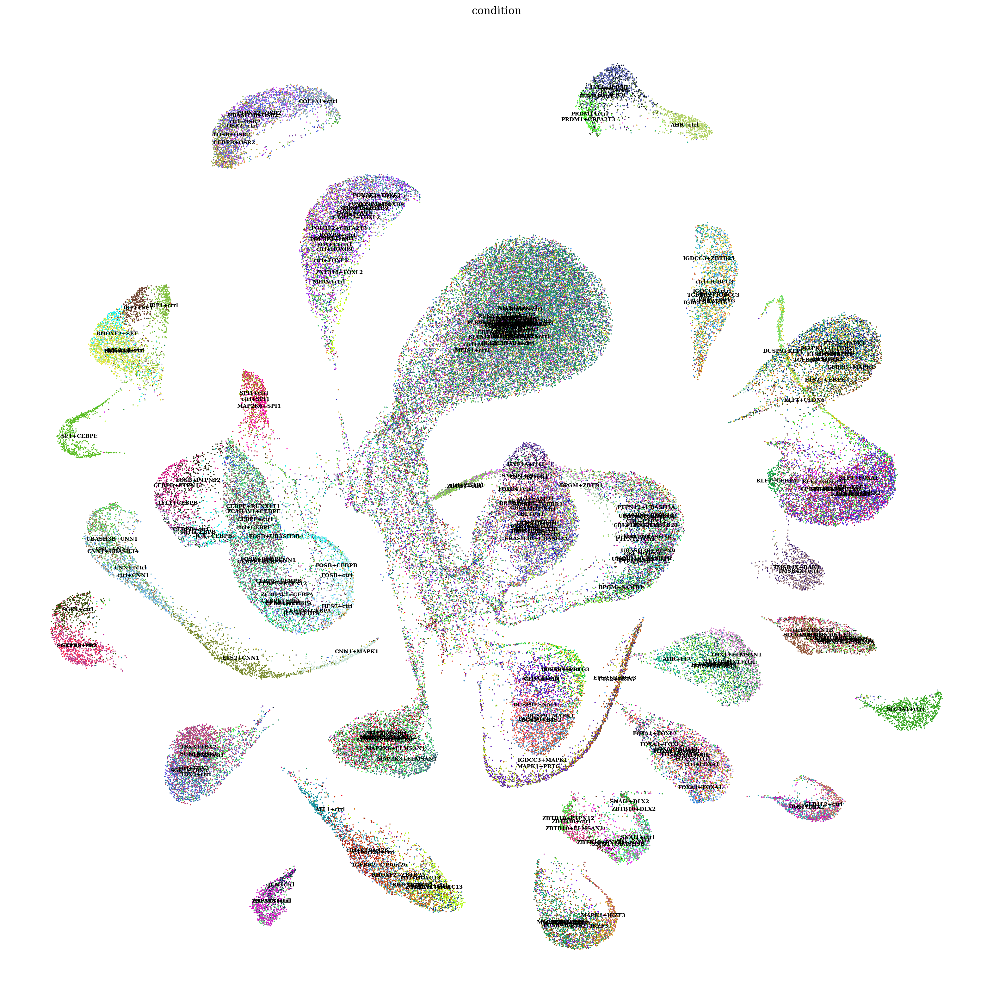

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

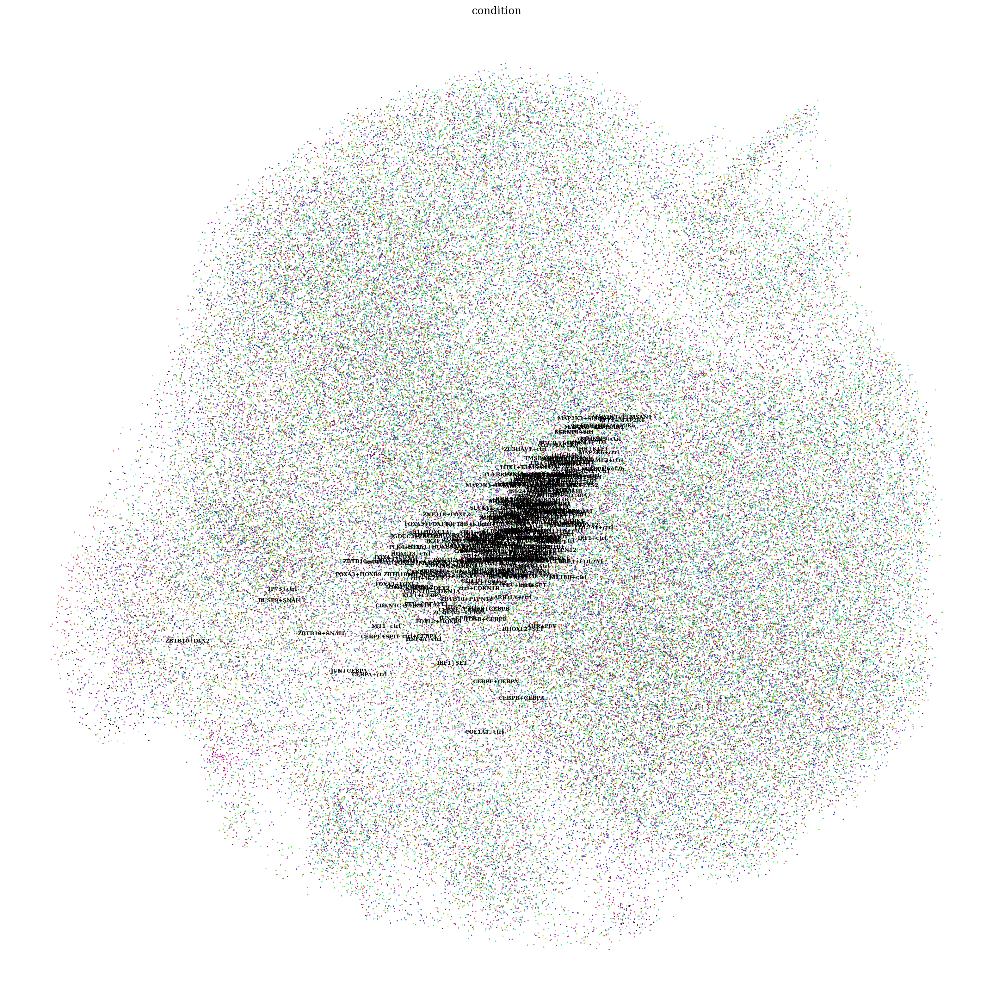

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()